# Lingting Shi Azizi/McFaline-Figueroa lab
all cells from both cripsri and crispra

In [1]:
import os
import tempfile

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scvi
import seaborn as sns
from scvi.external import MRVI
import anndata
import decipher as dc
dc.pl.activate_journal_quality()
import matplotlib as mpl
mpl.rcParams.update({'font.size': 10, 'svg.fonttype': 'none'})
mpl.rcParams['axes.titlesize'] = 10
mpl.rcParams['xtick.labelsize'] = 8  # Colorbar tick label size
mpl.rcParams['ytick.labelsize'] = 8  # Colorbar tick label size

In [2]:
scvi.settings.seed = 0  # optional: ensures reproducibility
print("Last run with scvi-tools version:", scvi.__version__)
colors = {'Untreated' : '#023047','1to0.25':'#219EBC','1to0.5':'#FFD166','1to1' :'#FF7F11'}

color_palette = colors
crispr_colors = {'crispri' : '#30C5D2','crispra':'#42047e'}
save_dir = "/home/user/Documents/Kinase_project/figures/decipher_analysis/"
# create a folder just for the figures

figures_dir = os.path.join(save_dir, "crispria")
os.makedirs(figures_dir, exist_ok=True)

Seed set to 0


Last run with scvi-tools version: 1.3.2


# Run decipher

In [3]:
pert_type = "crispri"
adata_path = os.path.join(f'/home/user/Documents/Kinase_project/{pert_type}_final/gbm_{pert_type}_crop_tcdg.h5ad')

adata_i = sc.read(adata_path)

In [4]:
adata_i

AnnData object with n_obs × n_vars = 125225 × 1669
    obs: 'P7', 'P5', 'sample', 'n.umi', 'log10.umi', 'percent_mito', 'cell_ID', 'RT', 'Lig', 'new_cell', 'oligo', 'total_reads.x', 'total_hash_umis_per_cell_ID', 'top_to_second_best_ratio', 'treatment', 'sgRNA', 'total_reads.y', 'sgRNA_proportion', 'total_sgrna_read_per_cell', 'rank', 'top_to_second', 'second_to_third', 'third_to_next', 'top_proportion', 'second_proportion', 'third_proportion', 'top_sg', 'second_sg', 'third_sg', 'gene', 'second_sg_gene', 'third_sg_gene', 'cell', 'RT_lig', 'num_genes_expressed', 'Size_Factor', 'gene_id', 'replicate', 'g1s_score', 'g2m_score', 'proliferation_index', 'dose', 'UMAP1', 'UMAP2', 'PCA_Cluster'
    var: 'features'

In [5]:
pert_type = "crispra"
adata_path = os.path.join(f'/home/user/Documents/Kinase_project/{pert_type}_final/gbm_{pert_type}_crop_tcdg.h5ad')

adata_a = sc.read(adata_path)


In [6]:
adata_a

AnnData object with n_obs × n_vars = 255701 × 4023
    obs: 'P7', 'P5', 'sample', 'n.umi', 'log10.umi', 'percent_mito', 'cell_ID', 'RT', 'Lig', 'new_cell', 'oligo', 'total_reads.x', 'total_hash_umis_per_cell_ID', 'top_to_second_best_ratio', 'treatment', 'sgRNA', 'total_reads.y', 'sgRNA_proportion', 'total_sgrna_read_per_cell', 'rank', 'top_to_second', 'second_to_third', 'third_to_next', 'top_proportion', 'second_proportion', 'third_proportion', 'top_sg', 'second_sg', 'third_sg', 'gene', 'second_sg_gene', 'third_sg_gene', 'cell', 'RT_lig', 'num_genes_expressed', 'Size_Factor', 'gene_id', 'replicate', 'g1s_score', 'g2m_score', 'proliferation_index', 'dose', 'UMAP1', 'UMAP2', 'PCA_Cluster'
    var: 'features'

In [7]:
adata_i.obs['perturbation'] = 'crispri'

In [8]:
adata_a

AnnData object with n_obs × n_vars = 255701 × 4023
    obs: 'P7', 'P5', 'sample', 'n.umi', 'log10.umi', 'percent_mito', 'cell_ID', 'RT', 'Lig', 'new_cell', 'oligo', 'total_reads.x', 'total_hash_umis_per_cell_ID', 'top_to_second_best_ratio', 'treatment', 'sgRNA', 'total_reads.y', 'sgRNA_proportion', 'total_sgrna_read_per_cell', 'rank', 'top_to_second', 'second_to_third', 'third_to_next', 'top_proportion', 'second_proportion', 'third_proportion', 'top_sg', 'second_sg', 'third_sg', 'gene', 'second_sg_gene', 'third_sg_gene', 'cell', 'RT_lig', 'num_genes_expressed', 'Size_Factor', 'gene_id', 'replicate', 'g1s_score', 'g2m_score', 'proliferation_index', 'dose', 'UMAP1', 'UMAP2', 'PCA_Cluster'
    var: 'features'

In [9]:
adata_a.obs['perturbation'] = 'crispra'

In [10]:
adata_a.obs['dose']

01A_A01_RT_BC_100_Lig_BC_103    0.00
01A_A01_RT_BC_100_Lig_BC_113    1.00
01A_A01_RT_BC_100_Lig_BC_138    0.00
01A_A01_RT_BC_100_Lig_BC_140    0.25
01A_A01_RT_BC_100_Lig_BC_143    0.25
                                ... 
12A_H12_RT_BC_99_Lig_BC_91      0.00
12A_H12_RT_BC_99_Lig_BC_92      1.00
12A_H12_RT_BC_99_Lig_BC_94      0.00
12A_H12_RT_BC_99_Lig_BC_95      0.00
12A_H12_RT_BC_99_Lig_BC_98      0.50
Name: dose, Length: 255701, dtype: float64

In [11]:
adata_a.obs.dose

01A_A01_RT_BC_100_Lig_BC_103    0.00
01A_A01_RT_BC_100_Lig_BC_113    1.00
01A_A01_RT_BC_100_Lig_BC_138    0.00
01A_A01_RT_BC_100_Lig_BC_140    0.25
01A_A01_RT_BC_100_Lig_BC_143    0.25
                                ... 
12A_H12_RT_BC_99_Lig_BC_91      0.00
12A_H12_RT_BC_99_Lig_BC_92      1.00
12A_H12_RT_BC_99_Lig_BC_94      0.00
12A_H12_RT_BC_99_Lig_BC_95      0.00
12A_H12_RT_BC_99_Lig_BC_98      0.50
Name: dose, Length: 255701, dtype: float64

In [12]:
import pandas as pd


# Mapping dictionary
mapping = {1.00: '1to1', 0.50: '1to0.5', 0.25: '1to0.25', 0.00: 'Untreated'}

# Replace numeric values with strings
adata_a.obs['treatment'] = adata_a.obs['dose'].replace(mapping)

adata_i.obs['treatment'] = adata_i.obs['dose'].replace(mapping)

print(adata_i.obs['treatment'])


01D_A01_RT_BC_100_Lig_BC_107      1to0.25
01D_A01_RT_BC_100_Lig_BC_115      1to0.25
01D_A01_RT_BC_100_Lig_BC_116      1to0.25
01D_A01_RT_BC_100_Lig_BC_122       1to0.5
01D_A01_RT_BC_100_Lig_BC_127    Untreated
                                  ...    
12D_H12_RT_BC_99_Lig_BC_74      Untreated
12D_H12_RT_BC_99_Lig_BC_75           1to1
12D_H12_RT_BC_99_Lig_BC_80           1to1
12D_H12_RT_BC_99_Lig_BC_85      Untreated
12D_H12_RT_BC_99_Lig_BC_86        1to0.25
Name: treatment, Length: 125225, dtype: object


In [13]:
print(adata_a.obs['treatment'])

01A_A01_RT_BC_100_Lig_BC_103    Untreated
01A_A01_RT_BC_100_Lig_BC_113         1to1
01A_A01_RT_BC_100_Lig_BC_138    Untreated
01A_A01_RT_BC_100_Lig_BC_140      1to0.25
01A_A01_RT_BC_100_Lig_BC_143      1to0.25
                                  ...    
12A_H12_RT_BC_99_Lig_BC_91      Untreated
12A_H12_RT_BC_99_Lig_BC_92           1to1
12A_H12_RT_BC_99_Lig_BC_94      Untreated
12A_H12_RT_BC_99_Lig_BC_95      Untreated
12A_H12_RT_BC_99_Lig_BC_98         1to0.5
Name: treatment, Length: 255701, dtype: object


In [14]:
# First, let's find the shared genes between both datasets
shared_genes = list(set(adata_i.var_names).intersection(set(adata_a.var_names)))

In [15]:
len(shared_genes)

1250

In [16]:
# Subset both AnnData objects to only include shared genes
adata_i_shared = adata_i[:, shared_genes]
adata_a_shared = adata_a[:, shared_genes]

# Now concatenate the subsetted objects
adata_concat = anndata.concat([adata_i_shared, adata_a_shared], axis=0)

In [17]:
adata_concat = adata_concat[(adata_concat.obs['total_hash_umis_per_cell_ID']>3) & (adata_concat.obs['top_to_second_best_ratio']>2)].copy()

In [18]:
adata_concat.obs['treatment_perturbation'] = adata_concat.obs['treatment'].astype(str)+'_'+adata_concat.obs['perturbation']

In [19]:
adata_concat.obs['treatment']

01D_A01_RT_BC_100_Lig_BC_107      1to0.25
01D_A01_RT_BC_100_Lig_BC_122       1to0.5
01D_A01_RT_BC_100_Lig_BC_127    Untreated
01D_A01_RT_BC_100_Lig_BC_160       1to0.5
01D_A01_RT_BC_100_Lig_BC_3      Untreated
                                  ...    
12A_H12_RT_BC_99_Lig_BC_85         1to0.5
12A_H12_RT_BC_99_Lig_BC_91      Untreated
12A_H12_RT_BC_99_Lig_BC_92           1to1
12A_H12_RT_BC_99_Lig_BC_95      Untreated
12A_H12_RT_BC_99_Lig_BC_98         1to0.5
Name: treatment, Length: 227806, dtype: object

In [20]:
# Downsample NTC to the sample
adata_concat.obs['treatment_perturbation'].unique()

array(['1to0.25_crispri', '1to0.5_crispri', 'Untreated_crispri',
       '1to1_crispri', '1to1_crispra', '1to0.25_crispra',
       'Untreated_crispra', '1to0.5_crispra'], dtype=object)

Epoch 28 (batch 400/400) | | train elbo: 1073.19 (last epoch: 1073.41) | val ll: 1079.36:   3%|▎         | 28/1000 [04:50<2:48:00, 10.37s/it]2025-12-08 00:19:33,267 | INFO : Early stopping has been triggered.
2025-12-08 00:19:34,531 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2025-12-08 00:19:34,531 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2025-12-08 00:19:34,532 | INFO : Saving decipher model with run_id 2025-12-08-00-19-34-rigid-crazy-hash.


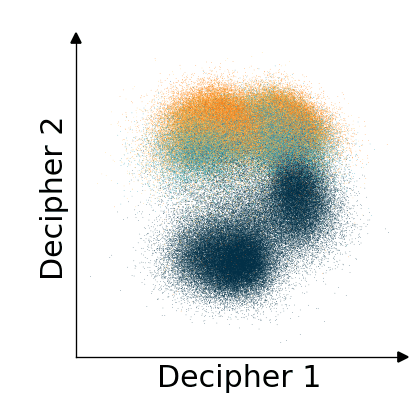

... storing 'new_cell' as categorical
... storing 'treatment' as categorical
... storing 'perturbation' as categorical
... storing 'treatment_perturbation' as categorical


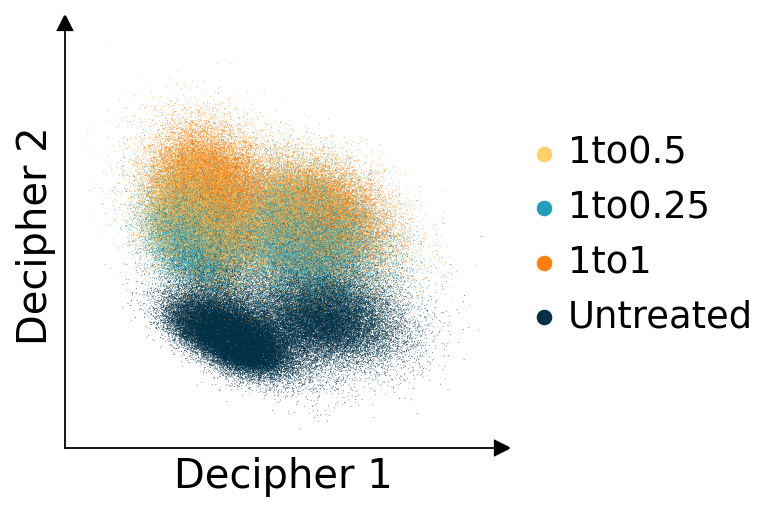

In [21]:
# seed 0, 1,2 

    
decipher_config = dc.tl.DecipherConfig(seed=4, batch_size=512)  # optional Decipher config

d3, val3 = dc.tl.decipher_train(
    adata_concat, decipher_config, plot_kwargs={"color": "treatment", "palette": color_palette}, plot_every_k_epochs=1
)

2025-12-08 00:19:40,019 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2025-12-08 00:19:40,020 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
... storing 'new_cell' as categorical
... storing 'treatment' as categorical
... storing 'perturbation' as categorical
... storing 'treatment_perturbation' as categorical


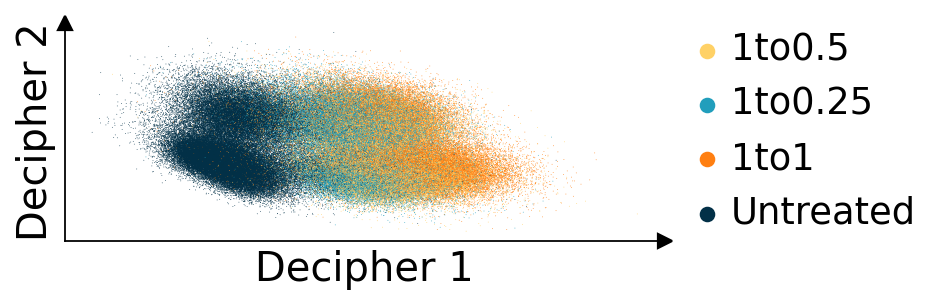

In [22]:
dc.tl.decipher_rotate_space(
    adata_concat,
        v1_col="treatment",
        v1_order=["Untreated", "1to1"],
        v2_col="perturbation",
        v2_order=["crispra", "crispri"],
    )
dc.pl.decipher(adata_concat, ["treatment"], palette=color_palette, figsize=(6, 2))
plt.tight_layout() 

... storing 'new_cell' as categorical
... storing 'treatment' as categorical
... storing 'perturbation' as categorical
... storing 'treatment_perturbation' as categorical
2025-12-08 00:19:48,636 | INFO : maxp pruned
2025-12-08 00:19:48,639 | INFO : cmap pruned
2025-12-08 00:19:48,640 | INFO : kern dropped
2025-12-08 00:19:48,640 | INFO : post pruned
2025-12-08 00:19:48,641 | INFO : FFTM dropped
2025-12-08 00:19:48,641 | INFO : GPOS pruned
2025-12-08 00:19:48,643 | INFO : GSUB pruned
2025-12-08 00:19:48,645 | INFO : glyf pruned
2025-12-08 00:19:48,645 | INFO : Added gid0 to subset
2025-12-08 00:19:48,645 | INFO : Added first four glyphs to subset
2025-12-08 00:19:48,646 | INFO : Closing glyph list over 'GSUB': 22 glyphs before
2025-12-08 00:19:48,646 | INFO : Glyph names: ['.notdef', '.null', 'D', 'U', 'a', 'c', 'd', 'e', 'five', 'h', 'i', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 'space', 't', 'two', 'zero']
2025-12-08 00:19:48,646 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 

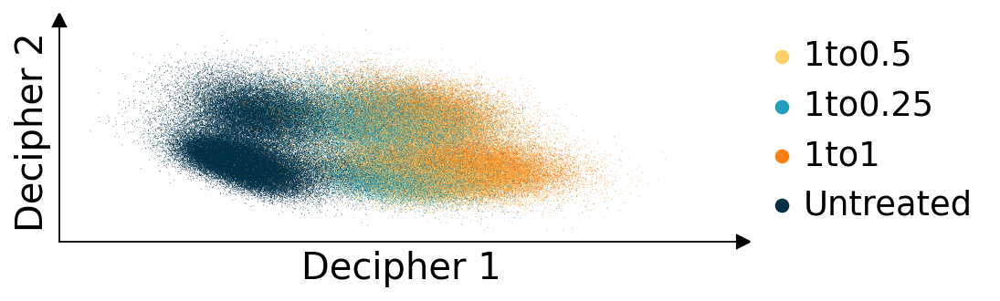

In [23]:

fig = dc.pl.decipher(adata_concat, ["treatment"], palette=color_palette)
fig.set_size_inches(6, 2)
plt.savefig(f'{figures_dir}/crispra_trajectory_treatment_color.png', dpi=300, bbox_inches='tight')
plt.savefig(f'{figures_dir}/crispra_trajectory_treatment_color.pdf', dpi=300, bbox_inches='tight')
plt.savefig(f'{figures_dir}/crispra_trajectory_treatment_color.svg', dpi=300, bbox_inches='tight')

In [24]:
adata_concat.obs

,P7,P5,sample,n.umi,log10.umi,percent_mito,cell_ID,RT,Lig,new_cell,...,g1s_score,g2m_score,proliferation_index,dose,UMAP1,UMAP2,PCA_Cluster,perturbation,treatment_perturbation,decipher_split
01D_A01_RT_BC_100_Lig_BC_107,01D,A01,CRISPRI_GBM_Tcells,1113.0,3.046495,0.0,01D_A01_RT_BC_100_Lig_BC_107,RT_BC_100,Lig_BC_107,A01_RT_BC_100_Lig_BC_107,...,1.293869,3.706303,3.769305,0.25,1.798775,-0.031063,9,crispri,1to0.25_crispri,validation
01D_A01_RT_BC_100_Lig_BC_122,01D,A01,CRISPRI_GBM_Tcells,2347.0,3.370513,0.0,01D_A01_RT_BC_100_Lig_BC_122,RT_BC_100,Lig_BC_122,A01_RT_BC_100_Lig_BC_122,...,2.143733,4.174625,4.284230,0.50,-0.385891,0.481959,4,crispri,1to0.5_crispri,train
01D_A01_RT_BC_100_Lig_BC_127,01D,A01,CRISPRI_GBM_Tcells,1645.0,3.216166,0.0,01D_A01_RT_BC_100_Lig_BC_127,RT_BC_100,Lig_BC_127,A01_RT_BC_100_Lig_BC_127,...,1.026350,2.463442,2.605355,0.00,-2.181030,-4.527240,11,crispri,Untreated_crispri,train
01D_A01_RT_BC_100_Lig_BC_160,01D,A01,CRISPRI_GBM_Tcells,2493.0,3.396722,0.0,01D_A01_RT_BC_100_Lig_BC_160,RT_BC_100,Lig_BC_160,A01_RT_BC_100_Lig_BC_160,...,2.090650,3.528930,3.717895,0.50,-3.294749,4.760447,0,crispri,1to0.5_crispri,train
01D_A01_RT_BC_100_Lig_BC_3,01D,A01,CRISPRI_GBM_Tcells,2593.0,3.413803,0.0,01D_A01_RT_BC_100_Lig_BC_3,RT_BC_100,Lig_BC_3,A01_RT_BC_100_Lig_BC_3,...,2.418153,4.057095,4.219967,0.00,-2.126102,-1.234671,8,crispri,Untreated_crispri,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12A_H12_RT_BC_99_Lig_BC_85,12A,H12,CRISPRA_GBM_Tcells,725.0,2.860338,0.0,12A_H12_RT_BC_99_Lig_BC_85,RT_BC_99,Lig_BC_85,H12_RT_BC_99_Lig_BC_85,...,1.841118,0.000000,1.841118,0.50,2.345738,3.583949,7,crispra,1to0.5_crispra,train
12A_H12_RT_BC_99_Lig_BC_91,12A,H12,CRISPRA_GBM_Tcells,4519.0,3.655042,0.0,12A_H12_RT_BC_99_Lig_BC_91,RT_BC_99,Lig_BC_91,H12_RT_BC_99_Lig_BC_91,...,2.558174,2.337914,3.103322,0.00,-1.654491,-5.462883,8,crispra,Untreated_crispra,train
12A_H12_RT_BC_99_Lig_BC_92,12A,H12,CRISPRA_GBM_Tcells,3773.0,3.576687,0.0,12A_H12_RT_BC_99_Lig_BC_92,RT_BC_99,Lig_BC_92,H12_RT_BC_99_Lig_BC_92,...,1.962156,3.889738,4.007565,1.00,0.226275,2.100054,9,crispra,1to1_crispra,validation
12A_H12_RT_BC_99_Lig_BC_95,12A,H12,CRISPRA_GBM_Tcells,7875.0,3.896251,0.0,12A_H12_RT_BC_99_Lig_BC_95,RT_BC_99,Lig_BC_95,H12_RT_BC_99_Lig_BC_95,...,3.068386,3.326999,3.878710,0.00,2.048898,-2.888049,4,crispra,Untreated_crispra,train


... storing 'new_cell' as categorical
... storing 'treatment' as categorical
... storing 'perturbation' as categorical
... storing 'treatment_perturbation' as categorical
2025-12-08 00:19:54,194 | INFO : maxp pruned
2025-12-08 00:19:54,197 | INFO : cmap pruned
2025-12-08 00:19:54,197 | INFO : kern dropped
2025-12-08 00:19:54,197 | INFO : post pruned
2025-12-08 00:19:54,198 | INFO : FFTM dropped
2025-12-08 00:19:54,198 | INFO : GPOS pruned
2025-12-08 00:19:54,200 | INFO : GSUB pruned
2025-12-08 00:19:54,202 | INFO : glyf pruned
2025-12-08 00:19:54,202 | INFO : Added gid0 to subset
2025-12-08 00:19:54,202 | INFO : Added first four glyphs to subset
2025-12-08 00:19:54,203 | INFO : Closing glyph list over 'GSUB': 15 glyphs before
2025-12-08 00:19:54,203 | INFO : Glyph names: ['.notdef', '.null', 'D', 'a', 'c', 'e', 'h', 'i', 'nonmarkingreturn', 'one', 'p', 'r', 's', 'space', 'two']
2025-12-08 00:19:54,203 | INFO : Glyph IDs:   [0, 1, 2, 3, 20, 21, 39, 68, 70, 72, 75, 76, 83, 85, 86]
2025-1

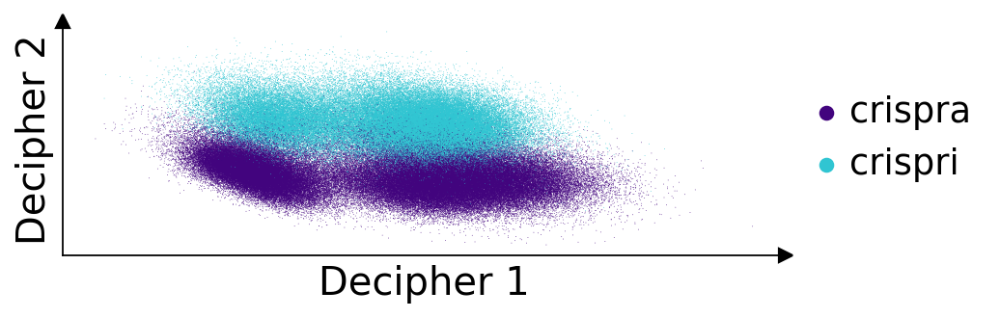

In [25]:
meta = "perturbation"
fig = dc.pl.decipher(adata_concat, [meta], palette=crispr_colors)
fig.set_size_inches(6, 2)
plt.savefig(f'{figures_dir}/crispra_trajectory_{meta}_color.png', dpi=300, bbox_inches='tight')
plt.savefig(f'{figures_dir}/crispra_trajectory_{meta}_color.pdf', dpi=300, bbox_inches='tight')
plt.savefig(f'{figures_dir}/crispra_trajectory_{meta}_color.svg', dpi=300, bbox_inches='tight')

In [26]:
adata_concat.obsm

AxisArrays with keys: decipher_v, decipher_z, decipher_v_not_rotated, decipher_z_not_rotated

Perturbation groups created:
perturbation_combined
Perturbed_crispra    121747
Perturbed_crispri     91188
NTC_crispra           13081
NTC_crispri            1790
Name: count, dtype: int64


2025-12-08 00:19:55,857 | INFO : maxp pruned
2025-12-08 00:19:55,860 | INFO : cmap pruned
2025-12-08 00:19:55,861 | INFO : kern dropped
2025-12-08 00:19:55,861 | INFO : post pruned
2025-12-08 00:19:55,861 | INFO : FFTM dropped
2025-12-08 00:19:55,862 | INFO : GPOS pruned
2025-12-08 00:19:55,863 | INFO : GSUB pruned
2025-12-08 00:19:55,865 | INFO : glyf pruned
2025-12-08 00:19:55,865 | INFO : Added gid0 to subset
2025-12-08 00:19:55,866 | INFO : Added first four glyphs to subset
2025-12-08 00:19:55,866 | INFO : Closing glyph list over 'GSUB': 19 glyphs before
2025-12-08 00:19:55,866 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'N', 'T', 'a', 'c', 'e', 'h', 'i', 'nonmarkingreturn', 'one', 'p', 'r', 's', 'space', 'two', 'underscore']
2025-12-08 00:19:55,866 | INFO : Glyph IDs:   [0, 1, 2, 3, 20, 21, 38, 39, 49, 55, 66, 68, 70, 72, 75, 76, 83, 85, 86]
2025-12-08 00:19:55,867 | INFO : Closed glyph list over 'GSUB': 19 glyphs after
2025-12-08 00:19:55,868 | INFO : Glyph names: ['.not

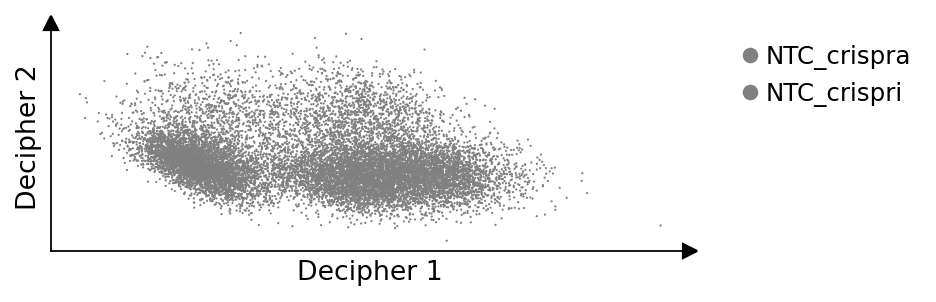

In [27]:
# Create a combined grouping variable for NTC vs perturbed within each CRISPR system
import pandas as pd
import matplotlib.pyplot as plt

# Create the combined perturbation groups directly
perturbation = adata_concat.obs['perturbation'].copy()
gene_id = adata_concat.obs['gene_id'].copy()

# Create the combined groups
combined_groups = []
for pert, gene in zip(perturbation, gene_id):
    if gene == 'NTC':
        combined_groups.append(f'NTC_{pert}')
    else:
        combined_groups.append(f'Perturbed_{pert}')

# Add the combined grouping to your adata object
adata_concat.obs['perturbation_combined'] = combined_groups

# Check the groups created
print("Perturbation groups created:")
print(adata_concat.obs['perturbation_combined'].value_counts())

# Define custom colors - bright colors for NTC, gray for perturbed
import matplotlib.colors as mcolors

# Create color mapping
color_dict = {
    'NTC_crispra': 'gray',       
    'NTC_crispri': 'gray',       
    'Perturbed_crispra': '#61427F', 
    'Perturbed_crispri': '#58A3A9' 
}

# Alternative approach: Plot perturbed cells first with low alpha, then NTC on top
import matplotlib.pyplot as plt

# Create the plot manually to control layering
fig, ax = plt.subplots(figsize=(6, 2))

# Get decipher coordinates
decipher_coords = adata_concat.obsm['decipher_v']  # or wherever decipher stores coordinates

# Plot perturbed cells first (background) with transparency
perturbed_mask = ~adata_concat.obs['perturbation_combined'].str.startswith('NTC')
perturbed_crispra = adata_concat.obs['perturbation_combined'] == 'Perturbed_crispra'
perturbed_crispri = adata_concat.obs['perturbation_combined'] == 'Perturbed_crispri'

#ax.scatter(decipher_coords[perturbed_crispra, 0], decipher_coords[perturbed_crispra, 1], 
           #c=color_dict['Perturbed_crispra'], alpha=0.1, s=1, label='Perturbed_crispra', edgecolors='none')
#ax.scatter(decipher_coords[perturbed_crispri, 0], decipher_coords[perturbed_crispri, 1], 
           #c=color_dict['Perturbed_crispri'], alpha=0.1, s=1, label='Perturbed_crispri', edgecolors='none')

# Plot NTC cells on top with full opacity
ntc_crispra = adata_concat.obs['perturbation_combined'] == 'NTC_crispra'
ntc_crispri = adata_concat.obs['perturbation_combined'] == 'NTC_crispri'

ax.scatter(decipher_coords[ntc_crispra, 0], decipher_coords[ntc_crispra, 1], 
           c=color_dict['NTC_crispra'], alpha=1.0, s=1, label='NTC_crispra', edgecolors='none')
ax.scatter(decipher_coords[ntc_crispri, 0], decipher_coords[ntc_crispri, 1], 
           c=color_dict['NTC_crispri'], alpha=1.0, s=1, label='NTC_crispri', edgecolors='none')

# Style the plot like decipher function
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.plot(1, 0, ">k", transform=ax.transAxes, clip_on=False)
ax.plot(0, 1, "^k", transform=ax.transAxes, clip_on=False)

# Remove ticks on x and y axis
ax.set_xticks([])
ax.set_yticks([])

ax.set_xlabel('Decipher 1', fontsize=12)
ax.set_ylabel('Decipher 2', fontsize=12)

# Create legend with custom marker size
legend_elements = [
    #plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_dict['Perturbed_crispra'], markersize=8, label='Perturbed_crispra', alpha=0.3),
    #plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_dict['Perturbed_crispri'], markersize=8, label='Perturbed_crispri', alpha=0.3),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_dict['NTC_crispra'], markersize=8, label='NTC_crispra'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_dict['NTC_crispri'], markersize=8, label='NTC_crispri')
]
ax.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False, fontsize=11)

plt.tight_layout()
plt.savefig(f'{figures_dir}/crispra_trajectory_ntc_{meta}_color.png', dpi=300, bbox_inches='tight')
plt.savefig(f'{figures_dir}/crispra_trajectory_ntc_{meta}_color.pdf', dpi=300, bbox_inches='tight')
plt.savefig(f'{figures_dir}/crispra_trajectory_ntc_{meta}_color.svg', dpi=300, bbox_inches='tight')
plt.show()

... storing 'new_cell' as categorical
... storing 'treatment' as categorical
... storing 'perturbation' as categorical
... storing 'treatment_perturbation' as categorical
... storing 'perturbation_combined' as categorical


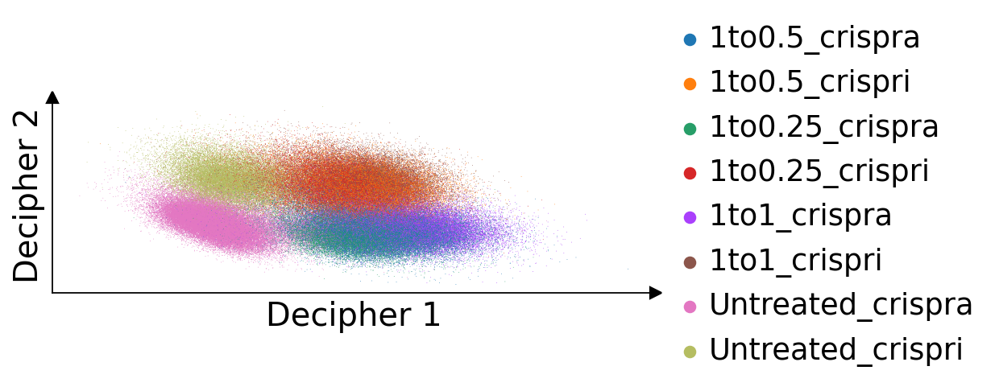

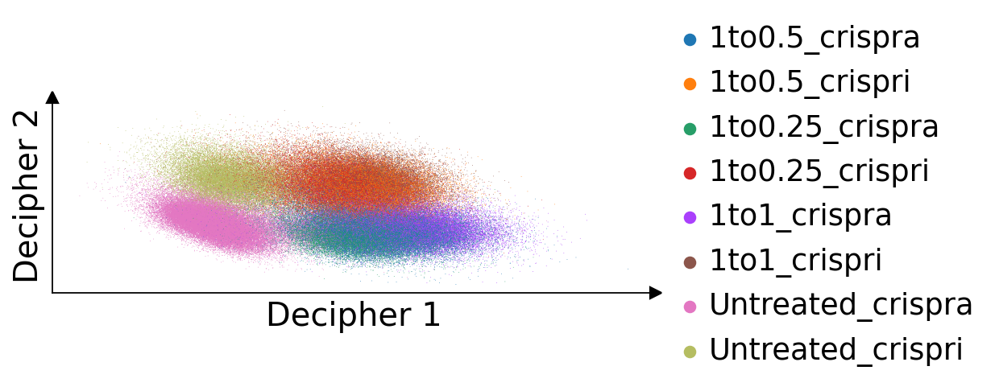

In [28]:
dc.pl.decipher(adata_concat, ["treatment_perturbation"], figsize=(6, 2))

In [29]:
adata_concat.obs["treatment_perturbation"].unique()

array(['1to0.25_crispri', '1to0.5_crispri', 'Untreated_crispri',
       '1to1_crispri', '1to1_crispra', '1to0.25_crispra',
       'Untreated_crispra', '1to0.5_crispra'], dtype=object)

In [30]:
#del adata_concat.uns['decipher']['trajectories']

In [31]:
adata_concat.obs['decipher_clusters'] = adata_concat.obs["treatment_perturbation"]
dc.tl.trajectories(
        adata_concat,
        dc.tl.TConfig("crispri_class", cluster_ids_list = ['Untreated_crispri','1to1_crispri']),
    dc.tl.TConfig("crispra_class", cluster_ids_list = ['Untreated_crispra','1to1_crispra'])
    )
#fig = dc.pl.trajectories(adata_concat, "treatment_perturbation")
#fig.set_size_inches(6, 2)
#plt.savefig(f'{figures_dir}/crispra_trajectory.png', dpi=300, bbox_inches='tight')



2025-12-08 00:20:00,075 | INFO : Trajectory crispri_class : ['Untreated_crispri', '1to1_crispri'])
2025-12-08 00:20:00,076 | INFO : Added trajectory crispri_class to `adata.uns['decipher']['trajectories']`.
2025-12-08 00:20:00,090 | INFO : Trajectory crispra_class : ['Untreated_crispra', '1to1_crispra'])
2025-12-08 00:20:00,091 | INFO : Added trajectory crispra_class to `adata.uns['decipher']['trajectories']`.


... storing 'new_cell' as categorical
... storing 'treatment' as categorical
... storing 'perturbation' as categorical
... storing 'treatment_perturbation' as categorical
... storing 'perturbation_combined' as categorical
... storing 'decipher_clusters' as categorical
2025-12-08 00:20:04,290 | INFO : maxp pruned
2025-12-08 00:20:04,293 | INFO : cmap pruned
2025-12-08 00:20:04,293 | INFO : kern dropped
2025-12-08 00:20:04,294 | INFO : post pruned
2025-12-08 00:20:04,294 | INFO : FFTM dropped
2025-12-08 00:20:04,295 | INFO : GPOS pruned
2025-12-08 00:20:04,296 | INFO : GSUB pruned
2025-12-08 00:20:04,298 | INFO : glyf pruned
2025-12-08 00:20:04,299 | INFO : Added gid0 to subset
2025-12-08 00:20:04,299 | INFO : Added first four glyphs to subset
2025-12-08 00:20:04,299 | INFO : Closing glyph list over 'GSUB': 22 glyphs before
2025-12-08 00:20:04,299 | INFO : Glyph names: ['.notdef', '.null', 'D', 'U', 'a', 'c', 'd', 'e', 'five', 'h', 'i', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period',

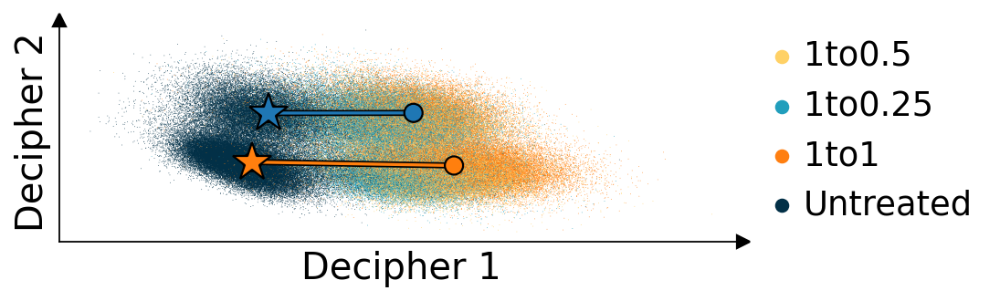

In [32]:

fig = dc.pl.trajectories(adata_concat, "treatment", palette=color_palette)
fig.set_size_inches(6, 2)
plt.savefig(f'{figures_dir}/crispra_trajectory.png', dpi=300, bbox_inches='tight')
plt.savefig(f'{figures_dir}/crispra_trajectory.pdf', dpi=300, bbox_inches='tight')
plt.savefig(f'{figures_dir}/crispra_trajectory.svg', dpi=300, bbox_inches='tight')

In [33]:
dc.tl.decipher_time(adata_concat)
plt.tight_layout() 
plt.savefig(f'{figures_dir}/dose_deciphertime.png', dpi=300)

# Save the plot as PDF
plt.savefig(f'{figures_dir}/dose_deciphertime.pdf', dpi=300)
plt.savefig(f'{figures_dir}/dose_deciphertime.svg', dpi=300)

2025-12-08 00:20:05,795 | INFO : Added `.obs['decipher_time']`: the decipher time of each cell.


<Figure size 320x320 with 0 Axes>

In [34]:
# Save the concatenated AnnData object
adata_concat.write(f'{figures_dir}/adata_concat_ia.h5ad')

... storing 'new_cell' as categorical
... storing 'treatment' as categorical
... storing 'perturbation' as categorical
... storing 'treatment_perturbation' as categorical
... storing 'perturbation_combined' as categorical
... storing 'decipher_clusters' as categorical


# Read in previous decipher Run

In [35]:
# read the saved adata_concat
adata_concat = sc.read(f'{figures_dir}/adata_concat_ia.h5ad')

2025-12-08 00:20:16,312 | INFO : maxp pruned
2025-12-08 00:20:16,315 | INFO : cmap pruned
2025-12-08 00:20:16,315 | INFO : kern dropped
2025-12-08 00:20:16,316 | INFO : post pruned
2025-12-08 00:20:16,316 | INFO : FFTM dropped
2025-12-08 00:20:16,317 | INFO : GPOS pruned
2025-12-08 00:20:16,318 | INFO : GSUB pruned
2025-12-08 00:20:16,320 | INFO : glyf pruned
2025-12-08 00:20:16,320 | INFO : Added gid0 to subset
2025-12-08 00:20:16,320 | INFO : Added first four glyphs to subset
2025-12-08 00:20:16,320 | INFO : Closing glyph list over 'GSUB': 16 glyphs before
2025-12-08 00:20:16,320 | INFO : Glyph names: ['.notdef', '.null', 'D', 'c', 'e', 'five', 'h', 'i', 'nonmarkingreturn', 'one', 'p', 'period', 'r', 'space', 'two', 'zero']
2025-12-08 00:20:16,321 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 39, 70, 72, 75, 76, 83, 85]
2025-12-08 00:20:16,322 | INFO : Closed glyph list over 'GSUB': 16 glyphs after
2025-12-08 00:20:16,322 | INFO : Glyph names: ['.notdef', '.null', 'D', 'c', 

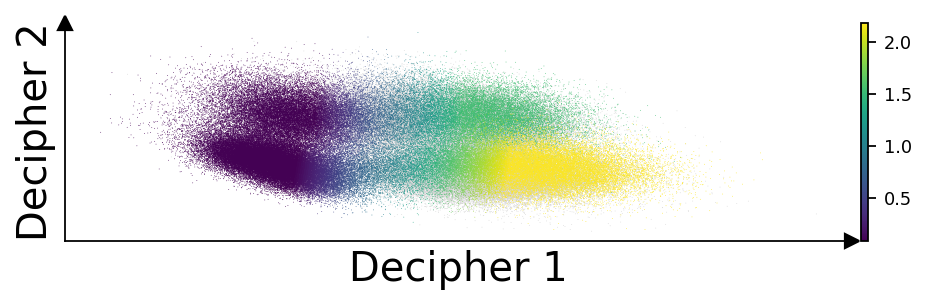

In [36]:
dc.pl.decipher_time(adata_concat, figsize=(6, 2))

plt.tight_layout() 
plt.savefig(f'{figures_dir}/dose_deciphertime.png', dpi=300)

# Save the plot as PDF
plt.savefig(f'{figures_dir}/dose_deciphertime.pdf', dpi=300)
plt.savefig(f'{figures_dir}/dose_deciphertime.svg', dpi=300)

In [37]:
dc.tl.gene_patterns(adata_concat)

In [38]:
colors

{'Untreated': '#023047',
 '1to0.25': '#219EBC',
 '1to0.5': '#FFD166',
 '1to1': '#FF7F11'}

In [39]:
crispr_colors

{'crispri': '#30C5D2', 'crispra': '#42047e'}

In [40]:
combined_colors = {'Untreated': '#023047',
 '1to0.25': '#219EBC',
 '1to0.5': '#FFD166',
 '1to1': '#FF7F11',
 'crispri_class': '#30C5D2',
 'crispra_class': '#42047e'}

2025-12-08 00:20:18,504 | INFO : maxp pruned
2025-12-08 00:20:18,508 | INFO : cmap pruned
2025-12-08 00:20:18,508 | INFO : kern dropped
2025-12-08 00:20:18,508 | INFO : post pruned
2025-12-08 00:20:18,508 | INFO : FFTM dropped
2025-12-08 00:20:18,509 | INFO : GPOS pruned
2025-12-08 00:20:18,510 | INFO : GSUB pruned
2025-12-08 00:20:18,996 | INFO : glyf pruned
2025-12-08 00:20:18,997 | INFO : Added gid0 to subset
2025-12-08 00:20:18,997 | INFO : Added first four glyphs to subset
2025-12-08 00:20:18,998 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2025-12-08 00:20:18,998 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'O', 'S', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:20:18,998 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 21, 23, 25, 27, 39, 42, 50, 54, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:20:19,000 | INFO : Closed g

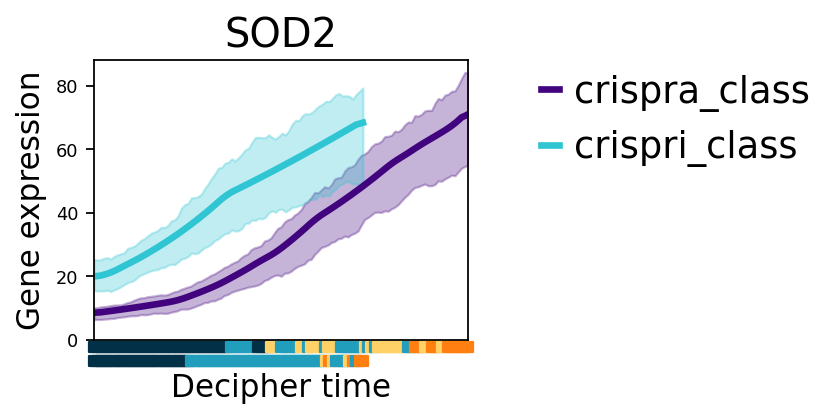

2025-12-08 00:20:19,153 | INFO : maxp pruned
2025-12-08 00:20:19,156 | INFO : cmap pruned
2025-12-08 00:20:19,157 | INFO : kern dropped
2025-12-08 00:20:19,157 | INFO : post pruned
2025-12-08 00:20:19,157 | INFO : FFTM dropped
2025-12-08 00:20:19,158 | INFO : GPOS pruned
2025-12-08 00:20:19,159 | INFO : GSUB pruned
2025-12-08 00:20:19,162 | INFO : glyf pruned
2025-12-08 00:20:19,162 | INFO : Added gid0 to subset
2025-12-08 00:20:19,162 | INFO : Added first four glyphs to subset
2025-12-08 00:20:19,162 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-12-08 00:20:19,162 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'F', 'G', 'S', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'seven', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:20:19,163 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 24, 26, 38, 39, 41, 42, 54, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:20:19

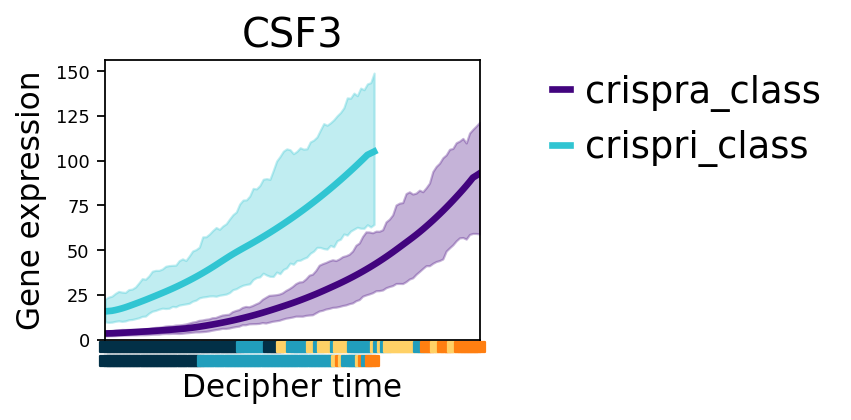

2025-12-08 00:20:19,324 | INFO : maxp pruned
2025-12-08 00:20:19,327 | INFO : cmap pruned
2025-12-08 00:20:19,327 | INFO : kern dropped
2025-12-08 00:20:19,328 | INFO : post pruned
2025-12-08 00:20:19,328 | INFO : FFTM dropped
2025-12-08 00:20:19,328 | INFO : GPOS pruned
2025-12-08 00:20:19,330 | INFO : GSUB pruned
2025-12-08 00:20:19,332 | INFO : glyf pruned
2025-12-08 00:20:19,333 | INFO : Added gid0 to subset
2025-12-08 00:20:19,333 | INFO : Added first four glyphs to subset
2025-12-08 00:20:19,333 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-12-08 00:20:19,333 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'I', 'O', 'a', 'c', 'e', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:20:19,334 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 39, 42, 44, 50, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:20:1

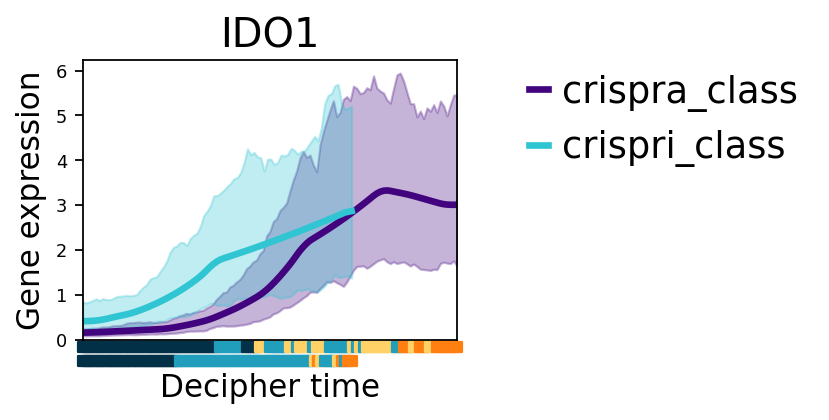

2025-12-08 00:20:19,494 | INFO : maxp pruned
2025-12-08 00:20:19,498 | INFO : cmap pruned
2025-12-08 00:20:19,498 | INFO : kern dropped
2025-12-08 00:20:19,498 | INFO : post pruned
2025-12-08 00:20:19,498 | INFO : FFTM dropped
2025-12-08 00:20:19,499 | INFO : GPOS pruned
2025-12-08 00:20:19,500 | INFO : GSUB pruned
2025-12-08 00:20:19,502 | INFO : glyf pruned
2025-12-08 00:20:19,502 | INFO : Added gid0 to subset
2025-12-08 00:20:19,503 | INFO : Added first four glyphs to subset
2025-12-08 00:20:19,503 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-12-08 00:20:19,503 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'a', 'c', 'e', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:20:19,504 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 26, 38, 39, 42, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:

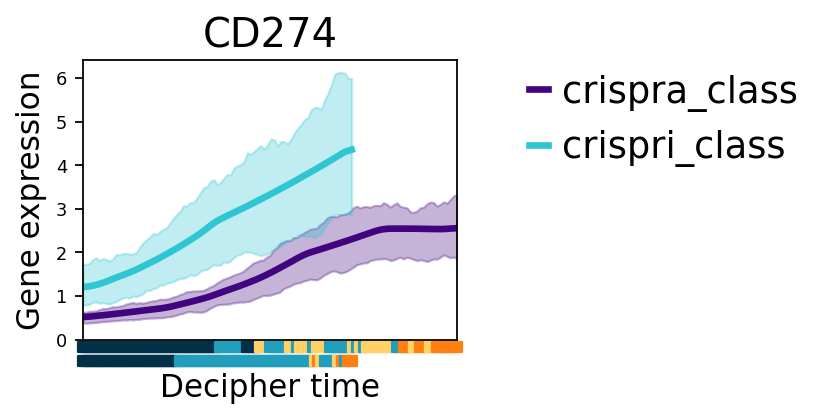

2025-12-08 00:20:19,660 | INFO : maxp pruned
2025-12-08 00:20:19,664 | INFO : cmap pruned
2025-12-08 00:20:19,664 | INFO : kern dropped
2025-12-08 00:20:19,664 | INFO : post pruned
2025-12-08 00:20:19,664 | INFO : FFTM dropped
2025-12-08 00:20:19,665 | INFO : GPOS pruned
2025-12-08 00:20:19,666 | INFO : GSUB pruned
2025-12-08 00:20:19,669 | INFO : glyf pruned
2025-12-08 00:20:19,669 | INFO : Added gid0 to subset
2025-12-08 00:20:19,669 | INFO : Added first four glyphs to subset
2025-12-08 00:20:19,669 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-12-08 00:20:19,670 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'L', 'P', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:20:19,670 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 23, 25, 27, 38, 39, 42, 47, 51, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:20:19,6

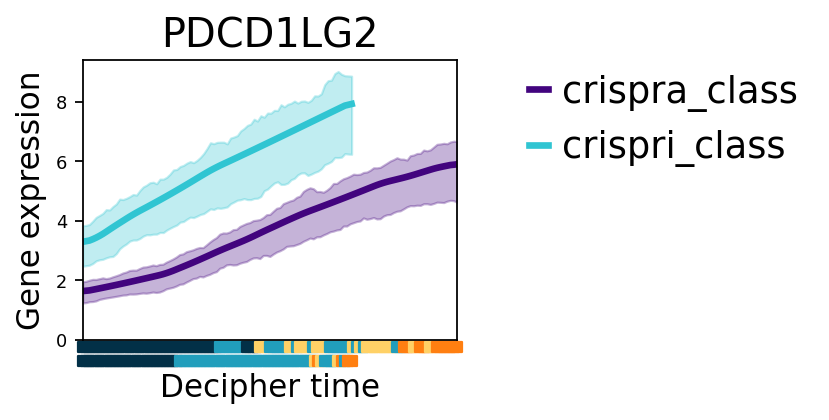

2025-12-08 00:20:19,824 | INFO : maxp pruned
2025-12-08 00:20:19,827 | INFO : cmap pruned
2025-12-08 00:20:19,827 | INFO : kern dropped
2025-12-08 00:20:19,827 | INFO : post pruned
2025-12-08 00:20:19,827 | INFO : FFTM dropped
2025-12-08 00:20:19,828 | INFO : GPOS pruned
2025-12-08 00:20:19,830 | INFO : GSUB pruned
2025-12-08 00:20:19,832 | INFO : glyf pruned
2025-12-08 00:20:19,833 | INFO : Added gid0 to subset
2025-12-08 00:20:19,833 | INFO : Added first four glyphs to subset
2025-12-08 00:20:19,833 | INFO : Closing glyph list over 'GSUB': 26 glyphs before
2025-12-08 00:20:19,833 | INFO : Glyph names: ['.notdef', '.null', 'D', 'E', 'G', 'P', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'underscore', 'x', 'zero']
2025-12-08 00:20:19,833 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 24, 39, 40, 42, 51, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:20:19,835 | INFO : Closed glyph list over 'GSUB': 2

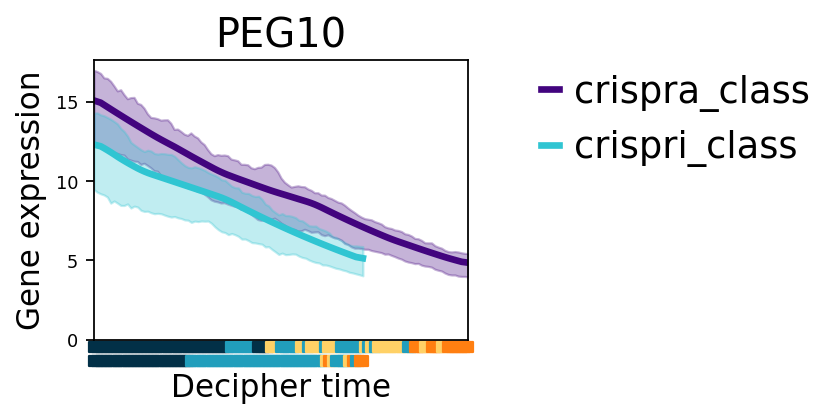

2025-12-08 00:20:19,983 | INFO : maxp pruned
2025-12-08 00:20:19,987 | INFO : cmap pruned
2025-12-08 00:20:19,987 | INFO : kern dropped
2025-12-08 00:20:19,987 | INFO : post pruned
2025-12-08 00:20:19,987 | INFO : FFTM dropped
2025-12-08 00:20:19,988 | INFO : GPOS pruned
2025-12-08 00:20:19,989 | INFO : GSUB pruned
2025-12-08 00:20:19,992 | INFO : glyf pruned
2025-12-08 00:20:19,993 | INFO : Added gid0 to subset
2025-12-08 00:20:19,993 | INFO : Added first four glyphs to subset
2025-12-08 00:20:19,993 | INFO : Closing glyph list over 'GSUB': 27 glyphs before
2025-12-08 00:20:19,993 | INFO : Glyph names: ['.notdef', '.null', 'A', 'D', 'G', 'R', 'a', 'c', 'e', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:20:19,993 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 21, 23, 25, 36, 39, 42, 53, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:20:19,995 | INFO : Closed glyph list ove

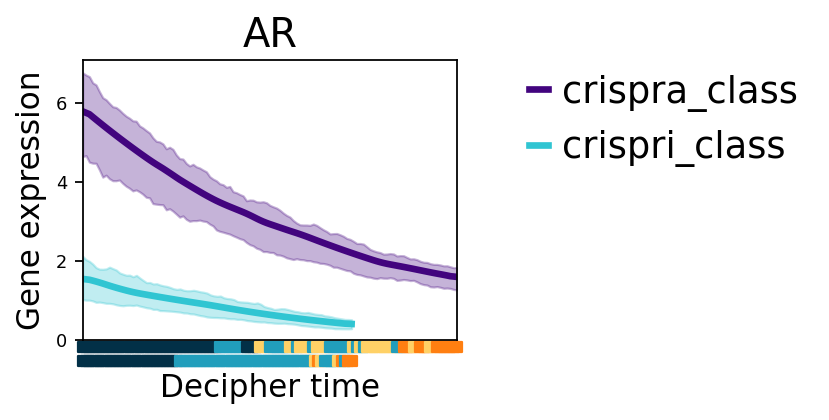

2025-12-08 00:20:20,141 | INFO : maxp pruned
2025-12-08 00:20:20,145 | INFO : cmap pruned
2025-12-08 00:20:20,145 | INFO : kern dropped
2025-12-08 00:20:20,145 | INFO : post pruned
2025-12-08 00:20:20,146 | INFO : FFTM dropped
2025-12-08 00:20:20,146 | INFO : GPOS pruned
2025-12-08 00:20:20,148 | INFO : GSUB pruned
2025-12-08 00:20:20,150 | INFO : glyf pruned
2025-12-08 00:20:20,151 | INFO : Added gid0 to subset
2025-12-08 00:20:20,151 | INFO : Added first four glyphs to subset
2025-12-08 00:20:20,151 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2025-12-08 00:20:20,151 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'R', 'T', 'W', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:20:20,151 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 24, 39, 42, 53, 55, 58, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:20:20,153 | INFO : Closed glyph

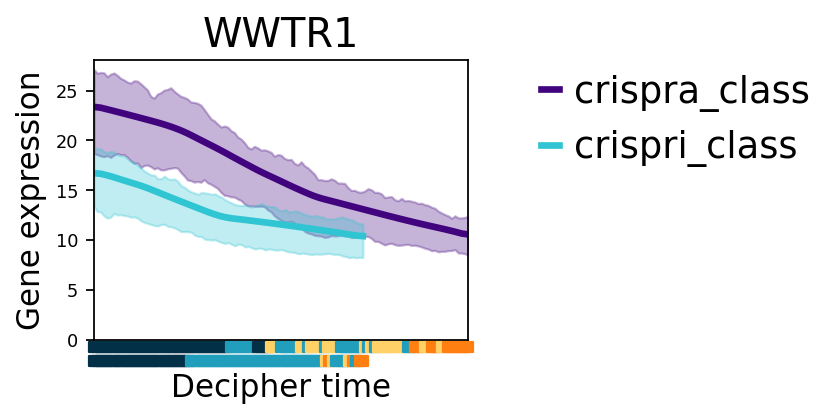

2025-12-08 00:20:20,313 | INFO : maxp pruned
2025-12-08 00:20:20,317 | INFO : cmap pruned
2025-12-08 00:20:20,317 | INFO : kern dropped
2025-12-08 00:20:20,317 | INFO : post pruned
2025-12-08 00:20:20,317 | INFO : FFTM dropped
2025-12-08 00:20:20,318 | INFO : GPOS pruned
2025-12-08 00:20:20,320 | INFO : GSUB pruned
2025-12-08 00:20:20,323 | INFO : glyf pruned
2025-12-08 00:20:20,323 | INFO : Added gid0 to subset
2025-12-08 00:20:20,323 | INFO : Added first four glyphs to subset
2025-12-08 00:20:20,323 | INFO : Closing glyph list over 'GSUB': 26 glyphs before
2025-12-08 00:20:20,323 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'I', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:20:20,324 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 24, 39, 42, 44, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:20:20,325 | INFO : Closed glyph list over 'GSUB':

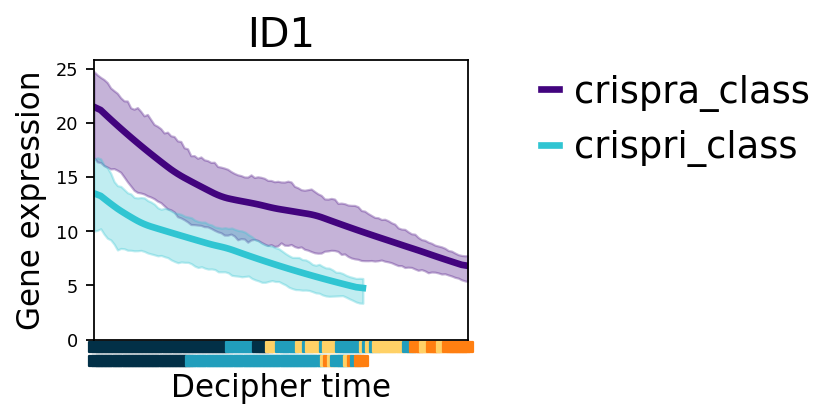

2025-12-08 00:20:20,482 | INFO : maxp pruned
2025-12-08 00:20:20,486 | INFO : cmap pruned
2025-12-08 00:20:20,486 | INFO : kern dropped
2025-12-08 00:20:20,486 | INFO : post pruned
2025-12-08 00:20:20,486 | INFO : FFTM dropped
2025-12-08 00:20:20,487 | INFO : GPOS pruned
2025-12-08 00:20:20,488 | INFO : GSUB pruned
2025-12-08 00:20:20,491 | INFO : glyf pruned
2025-12-08 00:20:20,491 | INFO : Added gid0 to subset
2025-12-08 00:20:20,491 | INFO : Added first four glyphs to subset
2025-12-08 00:20:20,491 | INFO : Closing glyph list over 'GSUB': 27 glyphs before
2025-12-08 00:20:20,491 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'X', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:20:20,492 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 24, 38, 39, 42, 59, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:20:20,493 | INFO : Closed glyph list ove

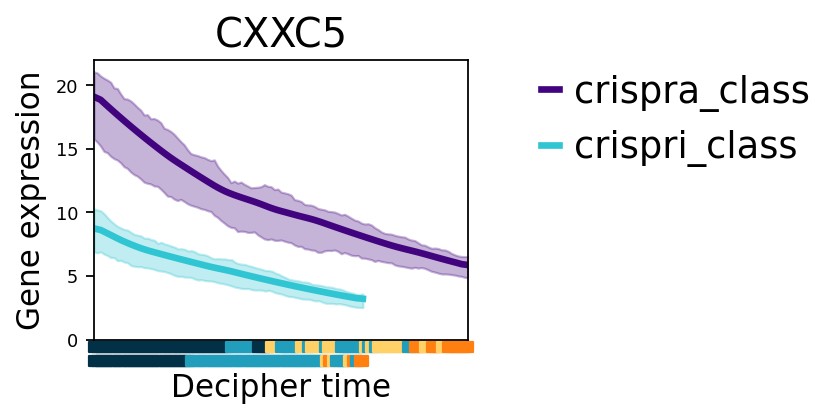

2025-12-08 00:20:20,646 | INFO : maxp pruned
2025-12-08 00:20:20,650 | INFO : cmap pruned
2025-12-08 00:20:20,650 | INFO : kern dropped
2025-12-08 00:20:20,651 | INFO : post pruned
2025-12-08 00:20:20,651 | INFO : FFTM dropped
2025-12-08 00:20:20,651 | INFO : GPOS pruned
2025-12-08 00:20:20,653 | INFO : GSUB pruned
2025-12-08 00:20:20,655 | INFO : glyf pruned
2025-12-08 00:20:20,656 | INFO : Added gid0 to subset
2025-12-08 00:20:20,656 | INFO : Added first four glyphs to subset
2025-12-08 00:20:20,656 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-12-08 00:20:20,656 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'G', 'L', 'O', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:20:20,656 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 24, 36, 38, 39, 42, 47, 50, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:20:20,657

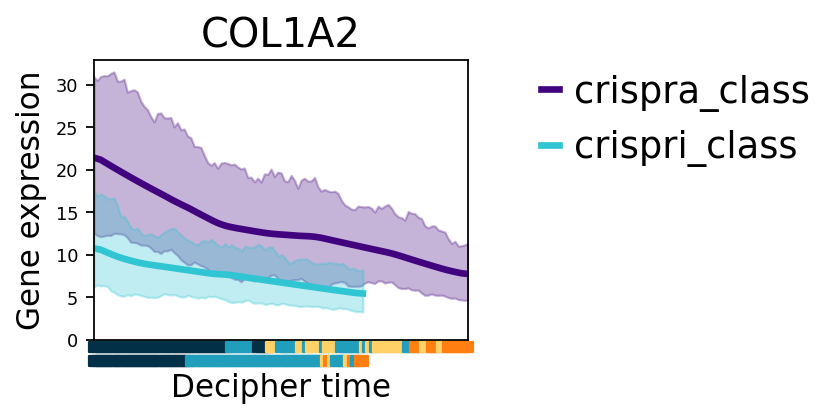

2025-12-08 00:20:20,818 | INFO : maxp pruned
2025-12-08 00:20:20,822 | INFO : cmap pruned
2025-12-08 00:20:20,822 | INFO : kern dropped
2025-12-08 00:20:20,822 | INFO : post pruned
2025-12-08 00:20:20,822 | INFO : FFTM dropped
2025-12-08 00:20:20,823 | INFO : GPOS pruned
2025-12-08 00:20:20,825 | INFO : GSUB pruned
2025-12-08 00:20:20,827 | INFO : glyf pruned
2025-12-08 00:20:20,828 | INFO : Added gid0 to subset
2025-12-08 00:20:20,828 | INFO : Added first four glyphs to subset
2025-12-08 00:20:20,828 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-12-08 00:20:20,828 | INFO : Glyph names: ['.notdef', '.null', 'A', 'D', 'G', 'P', 'T', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:20:20,828 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 26, 36, 39, 42, 51, 55, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:20:2

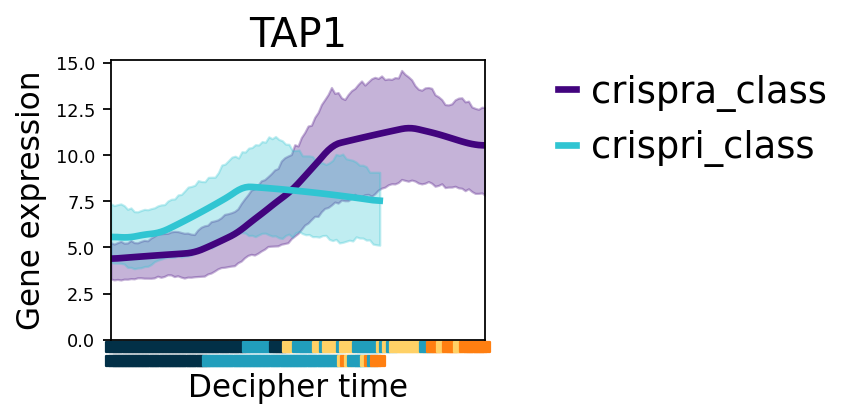

2025-12-08 00:20:20,993 | INFO : maxp pruned
2025-12-08 00:20:20,996 | INFO : cmap pruned
2025-12-08 00:20:20,997 | INFO : kern dropped
2025-12-08 00:20:20,997 | INFO : post pruned
2025-12-08 00:20:20,997 | INFO : FFTM dropped
2025-12-08 00:20:20,998 | INFO : GPOS pruned
2025-12-08 00:20:20,999 | INFO : GSUB pruned
2025-12-08 00:20:21,274 | INFO : glyf pruned
2025-12-08 00:20:21,275 | INFO : Added gid0 to subset
2025-12-08 00:20:21,275 | INFO : Added first four glyphs to subset
2025-12-08 00:20:21,275 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-12-08 00:20:21,276 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'G', 'I', 'M', 'a', 'c', 'e', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:20:21,276 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 36, 38, 39, 42, 44, 48, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:20:21,277

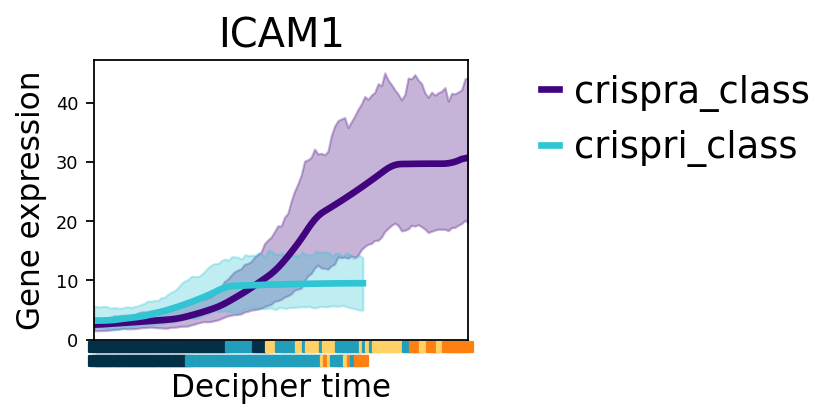

2025-12-08 00:20:21,428 | INFO : maxp pruned
2025-12-08 00:20:21,432 | INFO : cmap pruned
2025-12-08 00:20:21,432 | INFO : kern dropped
2025-12-08 00:20:21,432 | INFO : post pruned
2025-12-08 00:20:21,432 | INFO : FFTM dropped
2025-12-08 00:20:21,433 | INFO : GPOS pruned
2025-12-08 00:20:21,434 | INFO : GSUB pruned
2025-12-08 00:20:21,437 | INFO : glyf pruned
2025-12-08 00:20:21,437 | INFO : Added gid0 to subset
2025-12-08 00:20:21,437 | INFO : Added first four glyphs to subset
2025-12-08 00:20:21,437 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-12-08 00:20:21,437 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'L', 'X', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'six', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:20:21,438 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 21, 22, 23, 25, 27, 38, 39, 42, 47, 59, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:20:21

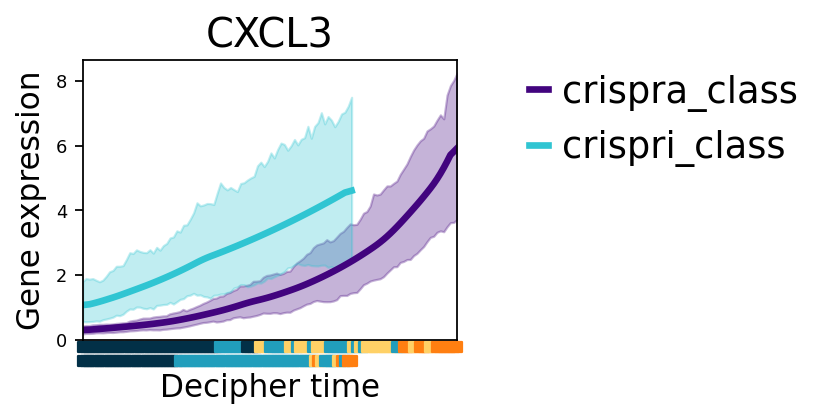

2025-12-08 00:20:21,591 | INFO : maxp pruned
2025-12-08 00:20:21,594 | INFO : cmap pruned
2025-12-08 00:20:21,594 | INFO : kern dropped
2025-12-08 00:20:21,594 | INFO : post pruned
2025-12-08 00:20:21,594 | INFO : FFTM dropped
2025-12-08 00:20:21,595 | INFO : GPOS pruned
2025-12-08 00:20:21,596 | INFO : GSUB pruned
2025-12-08 00:20:21,599 | INFO : glyf pruned
2025-12-08 00:20:21,600 | INFO : Added gid0 to subset
2025-12-08 00:20:21,600 | INFO : Added first four glyphs to subset
2025-12-08 00:20:21,600 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2025-12-08 00:20:21,600 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'L', 'X', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:20:21,601 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 24, 38, 39, 42, 47, 59, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:20:21,602 | INFO : Closed glyph

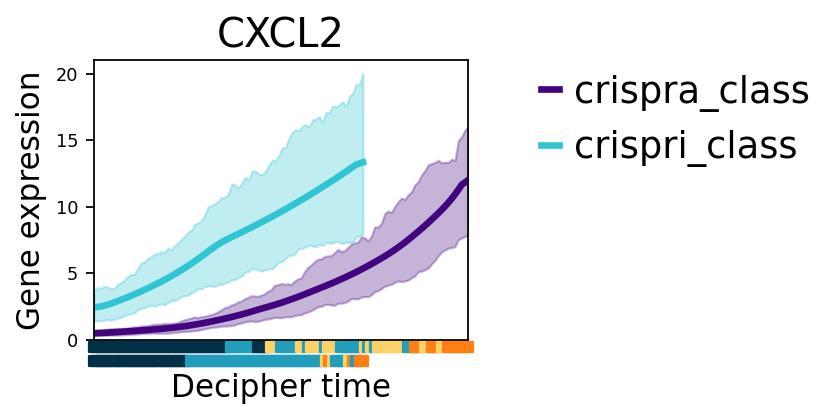

2025-12-08 00:20:21,756 | INFO : maxp pruned
2025-12-08 00:20:21,760 | INFO : cmap pruned
2025-12-08 00:20:21,760 | INFO : kern dropped
2025-12-08 00:20:21,760 | INFO : post pruned
2025-12-08 00:20:21,760 | INFO : FFTM dropped
2025-12-08 00:20:21,761 | INFO : GPOS pruned
2025-12-08 00:20:21,762 | INFO : GSUB pruned
2025-12-08 00:20:21,765 | INFO : glyf pruned
2025-12-08 00:20:21,765 | INFO : Added gid0 to subset
2025-12-08 00:20:21,765 | INFO : Added first four glyphs to subset
2025-12-08 00:20:21,765 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-12-08 00:20:21,766 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'L', 'X', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:20:21,766 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 27, 38, 39, 42, 47, 59, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:20:21

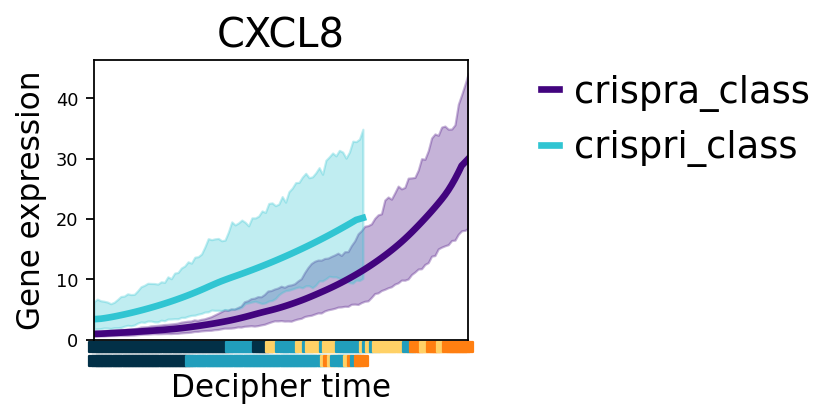

In [41]:
gene_list = ["SOD2","CSF3","IDO1","CD274",'PDCD1LG2','PEG10','AR','WWTR1','ID1','CXXC5','COL1A2','TAP1','ICAM1','CXCL3','CXCL2','CXCL8']
for i in gene_list:
    dc.pl.gene_patterns(adata_concat, i, palette=combined_colors, cell_type_key="treatment")
    plt.legend(loc='lower right', bbox_to_anchor=(2, 0.5), frameon = False)  # Change 'upper right' to your desired location
    # Show the plot
    plt.savefig(f'{figures_dir}/'+ i + '_full_expression_plot.pdf',dpi = 300, bbox_inches='tight')
    plt.savefig(f'{figures_dir}/'+ i + '_full_expression_plot.png',dpi = 300, bbox_inches='tight')
    plt.savefig(f'{figures_dir}/'+ i + '_full_expression_plot.svg',dpi = 300, bbox_inches='tight')
    plt.show()

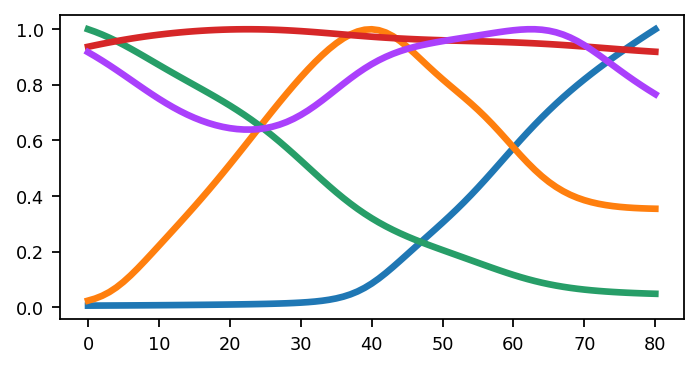

Loss: -707732.0 - Relative Error: 0.00%:  68%|██████▊   | 6766/10000 [01:00<00:29, 110.97it/s]


In [42]:
training_losses = dc.tl.basis_decomposition(adata_concat, seed=0);

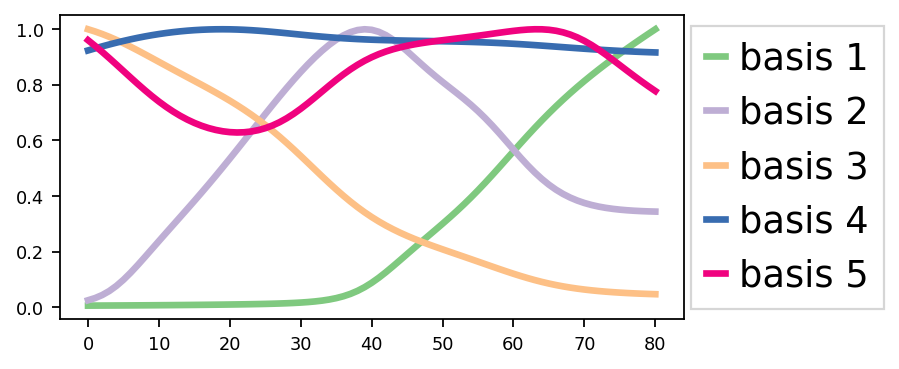

In [43]:
colors = [sns.color_palette("Accent")[i] for i in [0, 1, 2, 4, 5]]
dc.pl.basis(adata_concat, colors=colors);

In [44]:
# compare between cripsri and a
dc.tl.disruption_scores(adata_concat)
gene_list = adata_concat.var[[c for c in adata_concat.var if "decipher_disruption" in c]].sort_values(
    "decipher_disruption_combined", ascending=False
).head(50)

gene_list

2025-12-08 00:21:23,366 | INFO : Added `.var['decipher_disruption_shape']`: shape disruption scores
2025-12-08 00:21:23,367 | INFO : Added `.var['decipher_disruption_scale']`: scale disruption scores
2025-12-08 00:21:23,367 | INFO : Added `.var['decipher_disruption_combined']`: combined disruption scores
2025-12-08 00:21:23,367 | INFO : Added `.uns['decipher']['disruption_scores']`: disruption scores
2025-12-08 00:21:23,368 | INFO : Added `.uns['decipher']['disruption_scores_samples']`: disruption scores probabilistic samples


,decipher_disruption_shape,decipher_disruption_scale,decipher_disruption_combined
CEMIP,0.128835,0.390767,10.252639
AR,0.138270,1.381014,10.067460
DCC,0.210558,1.550422,10.063864
GBP4,0.489474,0.275940,10.036312
IDO1,0.396827,0.231573,9.797314
LAMA5,0.617557,0.912500,9.533833
SOX9,0.314388,0.155931,9.322494
ICAM1,0.571062,0.763677,9.283898
CXCL2,0.230350,1.049416,9.036733
IL6,0.226305,0.796017,8.965395


In [45]:
gene_list = gene_list.index

In [46]:
gene_list

Index(['CEMIP', 'AR', 'DCC', 'GBP4', 'IDO1', 'LAMA5', 'SOX9', 'ICAM1', 'CXCL2',
       'IL6', 'CXCL3', 'GBP5', 'CKS2', 'LINC01060', 'NR2F1', 'CXCL8', 'ID1',
       'ID3', 'CDR1', 'PLK1', 'CSF3', 'CCNB1', 'CDC20', 'NEK2', 'CCNB2',
       'GINS2', 'IL1B', 'MIR100HG', 'NDP', 'ARL6IP1', 'C4orf22', 'DNAJB1',
       'TIMP2', 'UCK1', 'DEPDC1', 'KCNMA1', 'NALCN', 'NBEA', 'FAM196B',
       'PHF10', 'DLGAP5', 'AC109466.1', 'NR2F1-AS1', 'SAPCD2', 'GPX1', 'NLGN1',
       'TUBA4A', 'TK1', 'TYMS', 'PLAU'],
      dtype='object')

2025-12-08 00:21:23,407 | INFO : maxp pruned
2025-12-08 00:21:23,410 | INFO : cmap pruned
2025-12-08 00:21:23,410 | INFO : kern dropped
2025-12-08 00:21:23,410 | INFO : post pruned
2025-12-08 00:21:23,410 | INFO : FFTM dropped
2025-12-08 00:21:23,412 | INFO : GPOS pruned
2025-12-08 00:21:23,413 | INFO : GSUB pruned
2025-12-08 00:21:23,415 | INFO : glyf pruned
2025-12-08 00:21:23,416 | INFO : Added gid0 to subset
2025-12-08 00:21:23,416 | INFO : Added first four glyphs to subset
2025-12-08 00:21:23,416 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2025-12-08 00:21:23,416 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'E', 'G', 'I', 'M', 'P', 'a', 'c', 'e', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:23,417 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 38, 39, 40, 42, 44, 48, 51, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
20

2025-12-08 00:21:23,420 | INFO : hhea subsetting not needed
2025-12-08 00:21:23,420 | INFO : maxp subsetting not needed
2025-12-08 00:21:23,420 | INFO : OS/2 subsetting not needed
2025-12-08 00:21:23,422 | INFO : hmtx subsetted
2025-12-08 00:21:23,423 | INFO : cmap subsetted
2025-12-08 00:21:23,423 | INFO : fpgm subsetting not needed
2025-12-08 00:21:23,423 | INFO : prep subsetting not needed
2025-12-08 00:21:23,423 | INFO : cvt  subsetting not needed
2025-12-08 00:21:23,423 | INFO : loca subsetting not needed
2025-12-08 00:21:23,423 | INFO : post subsetted
2025-12-08 00:21:23,423 | INFO : gasp subsetting not needed
2025-12-08 00:21:23,424 | INFO : MATH subsetted
2025-12-08 00:21:23,424 | INFO : GDEF subsetted
2025-12-08 00:21:23,431 | INFO : GPOS subsetted
2025-12-08 00:21:23,431 | INFO : GSUB subsetted
2025-12-08 00:21:23,432 | INFO : name subsetting not needed
2025-12-08 00:21:23,432 | INFO : glyf subsetted
2025-12-08 00:21:23,432 | INFO : head pruned
2025-12-08 00:21:23,432 | INFO 

CEMIP
AR


2025-12-08 00:21:23,682 | INFO : maxp pruned
2025-12-08 00:21:23,685 | INFO : cmap pruned
2025-12-08 00:21:23,685 | INFO : kern dropped
2025-12-08 00:21:23,685 | INFO : post pruned
2025-12-08 00:21:23,686 | INFO : FFTM dropped
2025-12-08 00:21:23,686 | INFO : GPOS pruned
2025-12-08 00:21:23,688 | INFO : GSUB pruned
2025-12-08 00:21:23,690 | INFO : glyf pruned
2025-12-08 00:21:23,690 | INFO : Added gid0 to subset
2025-12-08 00:21:23,690 | INFO : Added first four glyphs to subset
2025-12-08 00:21:23,690 | INFO : Closing glyph list over 'GSUB': 26 glyphs before
2025-12-08 00:21:23,691 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:23,691 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 24, 38, 39, 42, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:21:23,692 | INFO : Closed glyph list over 'GSUB':

DCC
GBP4


2025-12-08 00:21:23,955 | INFO : maxp pruned
2025-12-08 00:21:23,958 | INFO : cmap pruned
2025-12-08 00:21:23,958 | INFO : kern dropped
2025-12-08 00:21:23,959 | INFO : post pruned
2025-12-08 00:21:23,959 | INFO : FFTM dropped
2025-12-08 00:21:23,960 | INFO : GPOS pruned
2025-12-08 00:21:23,961 | INFO : GSUB pruned
2025-12-08 00:21:23,963 | INFO : glyf pruned
2025-12-08 00:21:23,963 | INFO : Added gid0 to subset
2025-12-08 00:21:23,963 | INFO : Added first four glyphs to subset
2025-12-08 00:21:23,963 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-12-08 00:21:23,964 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'I', 'O', 'a', 'c', 'e', 'five', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:23,964 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 39, 42, 44, 50, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:21:2

IDO1
LAMA5


2025-12-08 00:21:24,230 | INFO : maxp pruned
2025-12-08 00:21:24,233 | INFO : cmap pruned
2025-12-08 00:21:24,233 | INFO : kern dropped
2025-12-08 00:21:24,233 | INFO : post pruned
2025-12-08 00:21:24,234 | INFO : FFTM dropped
2025-12-08 00:21:24,234 | INFO : GPOS pruned
2025-12-08 00:21:24,235 | INFO : GSUB pruned
2025-12-08 00:21:24,237 | INFO : glyf pruned
2025-12-08 00:21:24,237 | INFO : Added gid0 to subset
2025-12-08 00:21:24,237 | INFO : Added first four glyphs to subset
2025-12-08 00:21:24,237 | INFO : Closing glyph list over 'GSUB': 29 glyphs before
2025-12-08 00:21:24,238 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'O', 'S', 'X', 'a', 'c', 'e', 'h', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:24,238 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 28, 39, 42, 50, 54, 59, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:21:24,239 | INFO :

SOX9
ICAM1


2025-12-08 00:21:24,502 | INFO : maxp pruned
2025-12-08 00:21:24,505 | INFO : cmap pruned
2025-12-08 00:21:24,505 | INFO : kern dropped
2025-12-08 00:21:24,505 | INFO : post pruned
2025-12-08 00:21:24,505 | INFO : FFTM dropped
2025-12-08 00:21:24,506 | INFO : GPOS pruned
2025-12-08 00:21:24,507 | INFO : GSUB pruned
2025-12-08 00:21:24,509 | INFO : glyf pruned
2025-12-08 00:21:24,509 | INFO : Added gid0 to subset
2025-12-08 00:21:24,510 | INFO : Added first four glyphs to subset
2025-12-08 00:21:24,510 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2025-12-08 00:21:24,510 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'L', 'X', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:24,510 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 24, 38, 39, 42, 47, 59, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:21:24,511 | INFO : Closed glyph

CXCL2
IL6


2025-12-08 00:21:24,776 | INFO : maxp pruned
2025-12-08 00:21:24,779 | INFO : cmap pruned
2025-12-08 00:21:24,779 | INFO : kern dropped
2025-12-08 00:21:24,779 | INFO : post pruned
2025-12-08 00:21:24,780 | INFO : FFTM dropped
2025-12-08 00:21:24,780 | INFO : GPOS pruned
2025-12-08 00:21:24,781 | INFO : GSUB pruned
2025-12-08 00:21:24,783 | INFO : glyf pruned
2025-12-08 00:21:24,784 | INFO : Added gid0 to subset
2025-12-08 00:21:24,784 | INFO : Added first four glyphs to subset
2025-12-08 00:21:24,784 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-12-08 00:21:24,784 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'L', 'X', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'six', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:24,784 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 21, 22, 23, 25, 27, 38, 39, 42, 47, 59, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:21:24

CXCL3
GBP5


2025-12-08 00:21:25,049 | INFO : maxp pruned
2025-12-08 00:21:25,052 | INFO : cmap pruned
2025-12-08 00:21:25,052 | INFO : kern dropped
2025-12-08 00:21:25,053 | INFO : post pruned
2025-12-08 00:21:25,053 | INFO : FFTM dropped
2025-12-08 00:21:25,054 | INFO : GPOS pruned
2025-12-08 00:21:25,055 | INFO : GSUB pruned
2025-12-08 00:21:25,057 | INFO : glyf pruned
2025-12-08 00:21:25,057 | INFO : Added gid0 to subset
2025-12-08 00:21:25,057 | INFO : Added first four glyphs to subset
2025-12-08 00:21:25,057 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-12-08 00:21:25,058 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'K', 'S', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:25,058 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 23, 25, 27, 38, 39, 42, 46, 54, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:21:25,0

CKS2
LINC01060


2025-12-08 00:21:25,333 | INFO : maxp pruned
2025-12-08 00:21:25,336 | INFO : cmap pruned
2025-12-08 00:21:25,336 | INFO : kern dropped
2025-12-08 00:21:25,336 | INFO : post pruned
2025-12-08 00:21:25,337 | INFO : FFTM dropped
2025-12-08 00:21:25,338 | INFO : GPOS pruned
2025-12-08 00:21:25,339 | INFO : GSUB pruned
2025-12-08 00:21:25,340 | INFO : glyf pruned
2025-12-08 00:21:25,341 | INFO : Added gid0 to subset
2025-12-08 00:21:25,341 | INFO : Added first four glyphs to subset
2025-12-08 00:21:25,341 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-12-08 00:21:25,341 | INFO : Glyph names: ['.notdef', '.null', 'D', 'F', 'G', 'N', 'R', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:25,342 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 26, 39, 41, 42, 49, 53, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:21:2

NR2F1
CXCL8


2025-12-08 00:21:25,873 | INFO : glyf pruned
2025-12-08 00:21:25,874 | INFO : Added gid0 to subset
2025-12-08 00:21:25,874 | INFO : Added first four glyphs to subset
2025-12-08 00:21:25,874 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-12-08 00:21:25,874 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'L', 'X', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:25,875 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 27, 38, 39, 42, 47, 59, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:21:25,876 | INFO : Closed glyph list over 'GSUB': 30 glyphs after
2025-12-08 00:21:25,876 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'L', 'X', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
202

ID1
ID3


2025-12-08 00:21:26,282 | INFO : maxp pruned
2025-12-08 00:21:26,285 | INFO : cmap pruned
2025-12-08 00:21:26,286 | INFO : kern dropped
2025-12-08 00:21:26,286 | INFO : post pruned
2025-12-08 00:21:26,286 | INFO : FFTM dropped
2025-12-08 00:21:26,287 | INFO : GPOS pruned
2025-12-08 00:21:26,288 | INFO : GSUB pruned
2025-12-08 00:21:26,290 | INFO : glyf pruned
2025-12-08 00:21:26,291 | INFO : Added gid0 to subset
2025-12-08 00:21:26,291 | INFO : Added first four glyphs to subset
2025-12-08 00:21:26,291 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-12-08 00:21:26,291 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'R', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:26,291 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 23, 25, 27, 38, 39, 42, 53, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:21

CDR1
PLK1


/home/user/anaconda3/lib/python3.12/site-packages/decipher/plot/trajectory_inference.py:154: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)
2025-12-08 00:21:26,567 | INFO : maxp pruned
2025-12-08 00:21:26,570 | INFO : cmap pruned
2025-12-08 00:21:26,570 | INFO : kern dropped
2025-12-08 00:21:26,571 | INFO : post pruned
2025-12-08 00:21:26,571 | INFO : FFTM dropped
2025-12-08 00:21:26,572 | INFO : GPOS pruned
2025-12-08 00:21:26,573 | INFO : GSUB pruned
2025-12-08 00:21:26,575 | INFO : glyf pruned
2025-12-08 00:21:26,576 | INFO : Added gid0 to subset
2025-12-08 00:21:26,576 | INFO : Added first four glyphs to subset
2025-12-08 00:21:26,576 | INFO : Closing glyph list over 'GSUB': 30 glyphs 

CSF3
CCNB1


2025-12-08 00:21:26,739 | INFO : head pruned
2025-12-08 00:21:26,739 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:26,740 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:26,740 | INFO : glyf pruned
2025-12-08 00:21:26,740 | INFO : GDEF pruned
2025-12-08 00:21:26,740 | INFO : GPOS pruned
2025-12-08 00:21:26,740 | INFO : GSUB pruned
2025-12-08 00:21:26,742 | INFO : name pruned
2025-12-08 00:21:26,857 | INFO : maxp pruned
2025-12-08 00:21:26,860 | INFO : cmap pruned
2025-12-08 00:21:26,861 | INFO : kern dropped
2025-12-08 00:21:26,861 | INFO : post pruned
2025-12-08 00:21:26,861 | INFO : FFTM dropped
2025-12-08 00:21:26,862 | INFO : GPOS pruned
2025-12-08 00:21:26,863 | INFO : GSUB pruned
2025-12-08 00:21:26,865 | INFO : glyf pruned
2025-12-08 00:21:26,866 | INFO : Added gid0 to subset
2025-12-08 00:21:26,866 | INFO : Added first four glyphs to subset
2025-12-08 00:21:26,866 | INFO : Closing glyph list over 'GSUB': 26 glyphs before
2025-12-08 00:21:26,866 | INFO : G

CDC20
NEK2


2025-12-08 00:21:27,132 | INFO : maxp pruned
2025-12-08 00:21:27,136 | INFO : cmap pruned
2025-12-08 00:21:27,136 | INFO : kern dropped
2025-12-08 00:21:27,136 | INFO : post pruned
2025-12-08 00:21:27,136 | INFO : FFTM dropped
2025-12-08 00:21:27,137 | INFO : GPOS pruned
2025-12-08 00:21:27,138 | INFO : GSUB pruned
2025-12-08 00:21:27,141 | INFO : glyf pruned
2025-12-08 00:21:27,141 | INFO : Added gid0 to subset
2025-12-08 00:21:27,141 | INFO : Added first four glyphs to subset
2025-12-08 00:21:27,142 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2025-12-08 00:21:27,142 | INFO : Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'G', 'N', 'a', 'c', 'e', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:27,142 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 21, 23, 25, 37, 38, 39, 42, 49, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:21:27,143 | INFO : Closed glyph

CCNB2
GINS2


2025-12-08 00:21:27,410 | INFO : maxp pruned
2025-12-08 00:21:27,414 | INFO : cmap pruned
2025-12-08 00:21:27,414 | INFO : kern dropped
2025-12-08 00:21:27,415 | INFO : post pruned
2025-12-08 00:21:27,415 | INFO : FFTM dropped
2025-12-08 00:21:27,416 | INFO : GPOS pruned
2025-12-08 00:21:27,417 | INFO : GSUB pruned
2025-12-08 00:21:27,420 | INFO : glyf pruned
2025-12-08 00:21:27,420 | INFO : Added gid0 to subset
2025-12-08 00:21:27,420 | INFO : Added first four glyphs to subset
2025-12-08 00:21:27,420 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-12-08 00:21:27,420 | INFO : Glyph names: ['.notdef', '.null', 'B', 'D', 'G', 'I', 'L', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:27,421 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 23, 25, 27, 37, 39, 42, 44, 47, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:21:27,4

IL1B
MIR100HG
NDP


2025-12-08 00:21:27,974 | INFO : maxp pruned
2025-12-08 00:21:27,978 | INFO : cmap pruned
2025-12-08 00:21:27,978 | INFO : kern dropped
2025-12-08 00:21:27,978 | INFO : post pruned
2025-12-08 00:21:27,978 | INFO : FFTM dropped
2025-12-08 00:21:27,979 | INFO : GPOS pruned
2025-12-08 00:21:27,980 | INFO : GSUB pruned
2025-12-08 00:21:27,982 | INFO : glyf pruned
2025-12-08 00:21:27,983 | INFO : Added gid0 to subset
2025-12-08 00:21:27,983 | INFO : Added first four glyphs to subset
2025-12-08 00:21:27,983 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2025-12-08 00:21:27,983 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'N', 'P', 'a', 'c', 'e', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:27,984 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 39, 42, 49, 51, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:21:27,985 | INFO : Closed g

ARL6IP1
C4orf22


2025-12-08 00:21:28,393 | INFO : maxp pruned
2025-12-08 00:21:28,397 | INFO : cmap pruned
2025-12-08 00:21:28,397 | INFO : kern dropped
2025-12-08 00:21:28,397 | INFO : post pruned
2025-12-08 00:21:28,397 | INFO : FFTM dropped
2025-12-08 00:21:28,398 | INFO : GPOS pruned
2025-12-08 00:21:28,399 | INFO : GSUB pruned
2025-12-08 00:21:28,402 | INFO : glyf pruned
2025-12-08 00:21:28,402 | INFO : Added gid0 to subset
2025-12-08 00:21:28,402 | INFO : Added first four glyphs to subset
2025-12-08 00:21:28,403 | INFO : Closing glyph list over 'GSUB': 31 glyphs before
2025-12-08 00:21:28,403 | INFO : Glyph names: ['.notdef', '.null', 'A', 'B', 'D', 'G', 'J', 'N', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:28,403 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 26, 36, 37, 39, 42, 45, 49, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-0

DNAJB1
TIMP2


2025-12-08 00:21:28,673 | INFO : maxp pruned
2025-12-08 00:21:28,677 | INFO : cmap pruned
2025-12-08 00:21:28,677 | INFO : kern dropped
2025-12-08 00:21:28,677 | INFO : post pruned
2025-12-08 00:21:28,677 | INFO : FFTM dropped
2025-12-08 00:21:28,678 | INFO : GPOS pruned
2025-12-08 00:21:28,679 | INFO : GSUB pruned
2025-12-08 00:21:28,682 | INFO : glyf pruned
2025-12-08 00:21:28,683 | INFO : Added gid0 to subset
2025-12-08 00:21:28,683 | INFO : Added first four glyphs to subset
2025-12-08 00:21:28,683 | INFO : Closing glyph list over 'GSUB': 29 glyphs before
2025-12-08 00:21:28,683 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'K', 'U', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:28,683 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 38, 39, 42, 46, 56, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:21:28,685 | INFO 

UCK1
DEPDC1


2025-12-08 00:21:28,962 | INFO : maxp pruned
2025-12-08 00:21:28,966 | INFO : cmap pruned
2025-12-08 00:21:28,966 | INFO : kern dropped
2025-12-08 00:21:28,966 | INFO : post pruned
2025-12-08 00:21:28,966 | INFO : FFTM dropped
2025-12-08 00:21:28,967 | INFO : GPOS pruned
2025-12-08 00:21:28,968 | INFO : GSUB pruned
2025-12-08 00:21:28,971 | INFO : glyf pruned
2025-12-08 00:21:28,971 | INFO : Added gid0 to subset
2025-12-08 00:21:28,971 | INFO : Added first four glyphs to subset
2025-12-08 00:21:28,971 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2025-12-08 00:21:28,972 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'G', 'K', 'M', 'N', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:28,972 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 23, 25, 27, 36, 38, 39, 42, 46, 48, 49, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
202

KCNMA1
NALCN


2025-12-08 00:21:29,252 | INFO : maxp pruned
2025-12-08 00:21:29,255 | INFO : cmap pruned
2025-12-08 00:21:29,255 | INFO : kern dropped
2025-12-08 00:21:29,255 | INFO : post pruned
2025-12-08 00:21:29,256 | INFO : FFTM dropped
2025-12-08 00:21:29,257 | INFO : GPOS pruned
2025-12-08 00:21:29,258 | INFO : GSUB pruned
2025-12-08 00:21:29,261 | INFO : glyf pruned
2025-12-08 00:21:29,261 | INFO : Added gid0 to subset
2025-12-08 00:21:29,261 | INFO : Added first four glyphs to subset
2025-12-08 00:21:29,261 | INFO : Closing glyph list over 'GSUB': 31 glyphs before
2025-12-08 00:21:29,261 | INFO : Glyph names: ['.notdef', '.null', 'A', 'B', 'D', 'E', 'G', 'N', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:29,262 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 23, 25, 27, 36, 37, 39, 40, 42, 49, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 0

NBEA
FAM196B


2025-12-08 00:21:29,540 | INFO : maxp pruned
2025-12-08 00:21:29,543 | INFO : cmap pruned
2025-12-08 00:21:29,543 | INFO : kern dropped
2025-12-08 00:21:29,544 | INFO : post pruned
2025-12-08 00:21:29,544 | INFO : FFTM dropped
2025-12-08 00:21:29,545 | INFO : GPOS pruned
2025-12-08 00:21:29,546 | INFO : GSUB pruned
2025-12-08 00:21:29,548 | INFO : glyf pruned
2025-12-08 00:21:29,549 | INFO : Added gid0 to subset
2025-12-08 00:21:29,549 | INFO : Added first four glyphs to subset
2025-12-08 00:21:29,549 | INFO : Closing glyph list over 'GSUB': 30 glyphs before
2025-12-08 00:21:29,549 | INFO : Glyph names: ['.notdef', '.null', 'D', 'F', 'G', 'H', 'P', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:29,549 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 26, 39, 41, 42, 43, 51, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:21:2

PHF10
DLGAP5


2025-12-08 00:21:30,147 | INFO : maxp pruned
2025-12-08 00:21:30,150 | INFO : cmap pruned
2025-12-08 00:21:30,150 | INFO : kern dropped
2025-12-08 00:21:30,151 | INFO : post pruned
2025-12-08 00:21:30,151 | INFO : FFTM dropped
2025-12-08 00:21:30,151 | INFO : GPOS pruned
2025-12-08 00:21:30,152 | INFO : GSUB pruned
2025-12-08 00:21:30,155 | INFO : glyf pruned
2025-12-08 00:21:30,155 | INFO : Added gid0 to subset
2025-12-08 00:21:30,156 | INFO : Added first four glyphs to subset
2025-12-08 00:21:30,156 | INFO : Closing glyph list over 'GSUB': 31 glyphs before
2025-12-08 00:21:30,156 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'G', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:30,156 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 23, 25, 27, 28, 36, 38, 39, 42, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025

AC109466.1
NR2F1-AS1


2025-12-08 00:21:30,320 | INFO : glyf pruned
2025-12-08 00:21:30,320 | INFO : GDEF pruned
2025-12-08 00:21:30,320 | INFO : GPOS pruned
2025-12-08 00:21:30,320 | INFO : GSUB pruned
2025-12-08 00:21:30,322 | INFO : name pruned
2025-12-08 00:21:30,435 | INFO : maxp pruned
2025-12-08 00:21:30,438 | INFO : cmap pruned
2025-12-08 00:21:30,438 | INFO : kern dropped
2025-12-08 00:21:30,438 | INFO : post pruned
2025-12-08 00:21:30,439 | INFO : FFTM dropped
2025-12-08 00:21:30,439 | INFO : GPOS pruned
2025-12-08 00:21:30,441 | INFO : GSUB pruned
2025-12-08 00:21:30,443 | INFO : glyf pruned
2025-12-08 00:21:30,444 | INFO : Added gid0 to subset
2025-12-08 00:21:30,444 | INFO : Added first four glyphs to subset
2025-12-08 00:21:30,444 | INFO : Closing glyph list over 'GSUB': 29 glyphs before
2025-12-08 00:21:30,444 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'G', 'P', 'S', 'a', 'c', 'e', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'six', 'space', 't', 'two

SAPCD2
GPX1


2025-12-08 00:21:30,715 | INFO : maxp pruned
2025-12-08 00:21:30,718 | INFO : cmap pruned
2025-12-08 00:21:30,719 | INFO : kern dropped
2025-12-08 00:21:30,719 | INFO : post pruned
2025-12-08 00:21:30,719 | INFO : FFTM dropped
2025-12-08 00:21:30,720 | INFO : GPOS pruned
2025-12-08 00:21:30,721 | INFO : GSUB pruned
2025-12-08 00:21:30,723 | INFO : glyf pruned
2025-12-08 00:21:30,724 | INFO : Added gid0 to subset
2025-12-08 00:21:30,724 | INFO : Added first four glyphs to subset
2025-12-08 00:21:30,724 | INFO : Closing glyph list over 'GSUB': 28 glyphs before
2025-12-08 00:21:30,725 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'L', 'N', 'a', 'c', 'e', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'space', 't', 'three', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:30,725 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 39, 42, 47, 49, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:21:30,727 | INFO : Closed g

NLGN1
TUBA4A


2025-12-08 00:21:30,998 | INFO : maxp pruned
2025-12-08 00:21:31,001 | INFO : cmap pruned
2025-12-08 00:21:31,002 | INFO : kern dropped
2025-12-08 00:21:31,002 | INFO : post pruned
2025-12-08 00:21:31,002 | INFO : FFTM dropped
2025-12-08 00:21:31,003 | INFO : GPOS pruned
2025-12-08 00:21:31,004 | INFO : GSUB pruned
2025-12-08 00:21:31,007 | INFO : glyf pruned
2025-12-08 00:21:31,007 | INFO : Added gid0 to subset
2025-12-08 00:21:31,007 | INFO : Added first four glyphs to subset
2025-12-08 00:21:31,007 | INFO : Closing glyph list over 'GSUB': 29 glyphs before
2025-12-08 00:21:31,008 | INFO : Glyph names: ['.notdef', '.null', 'D', 'G', 'K', 'T', 'a', 'c', 'e', 'eight', 'four', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'r', 's', 'six', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:31,008 | INFO : Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 23, 25, 27, 39, 42, 46, 55, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-08 00:21:31,009 | INFO

TK1
TYMS


2025-12-08 00:21:31,277 | INFO : maxp pruned
2025-12-08 00:21:31,281 | INFO : cmap pruned
2025-12-08 00:21:31,281 | INFO : kern dropped
2025-12-08 00:21:31,281 | INFO : post pruned
2025-12-08 00:21:31,282 | INFO : FFTM dropped
2025-12-08 00:21:31,282 | INFO : GPOS pruned
2025-12-08 00:21:31,283 | INFO : GSUB pruned
2025-12-08 00:21:31,286 | INFO : glyf pruned
2025-12-08 00:21:31,286 | INFO : Added gid0 to subset
2025-12-08 00:21:31,286 | INFO : Added first four glyphs to subset
2025-12-08 00:21:31,287 | INFO : Closing glyph list over 'GSUB': 31 glyphs before
2025-12-08 00:21:31,287 | INFO : Glyph names: ['.notdef', '.null', 'A', 'D', 'G', 'L', 'P', 'U', 'a', 'c', 'e', 'five', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'space', 't', 'two', 'underscore', 'x', 'zero']
2025-12-08 00:21:31,287 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 26, 36, 39, 42, 47, 51, 56, 66, 68, 70, 72, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91]
2025-12-0

PLAU


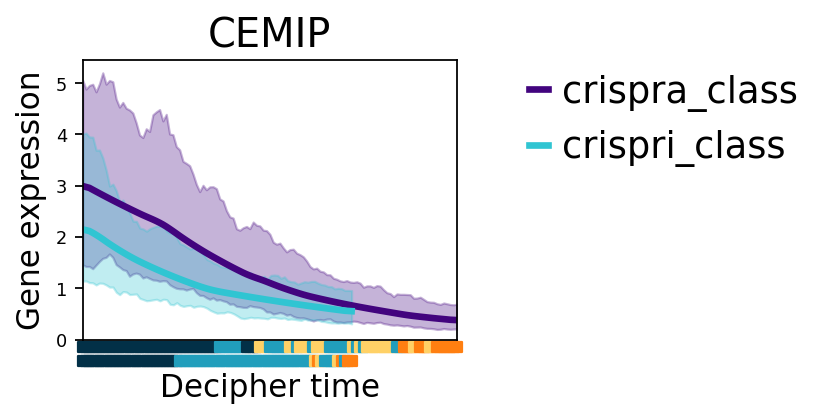

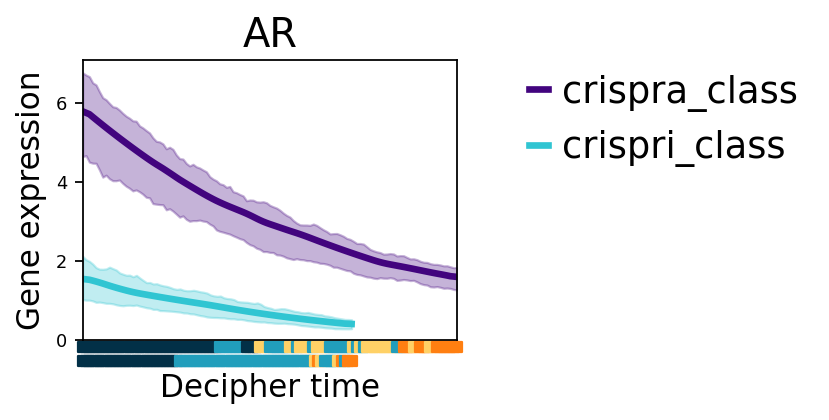

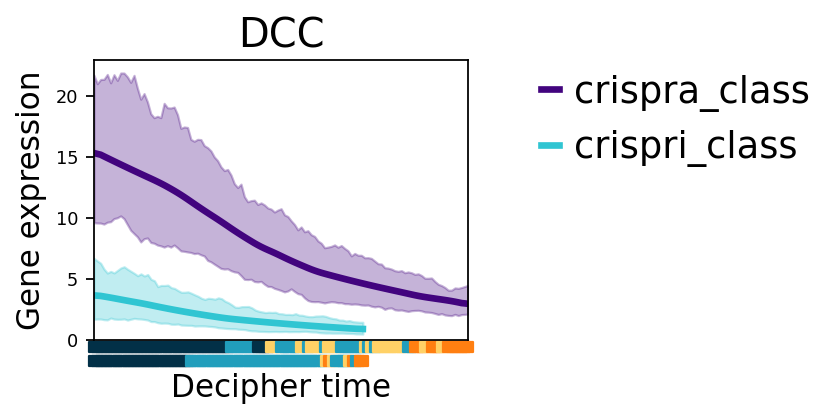

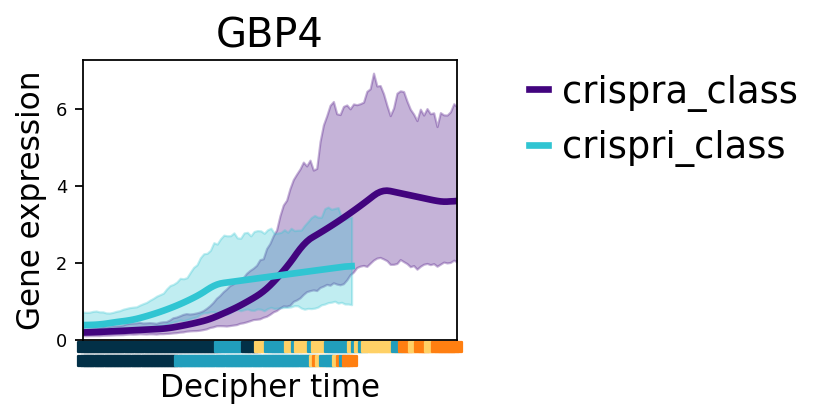

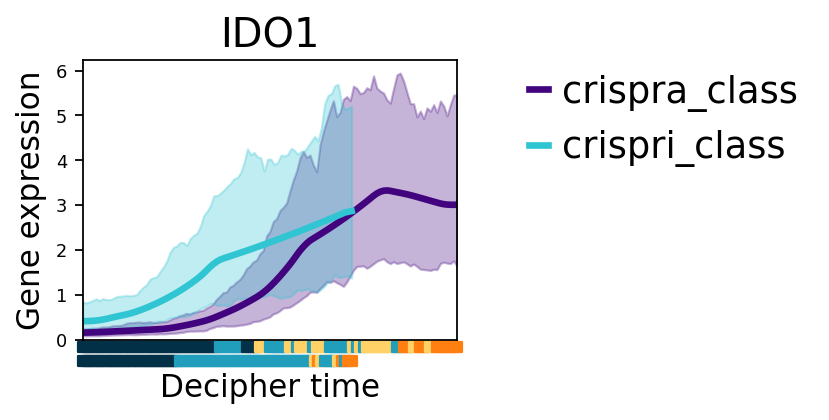

...

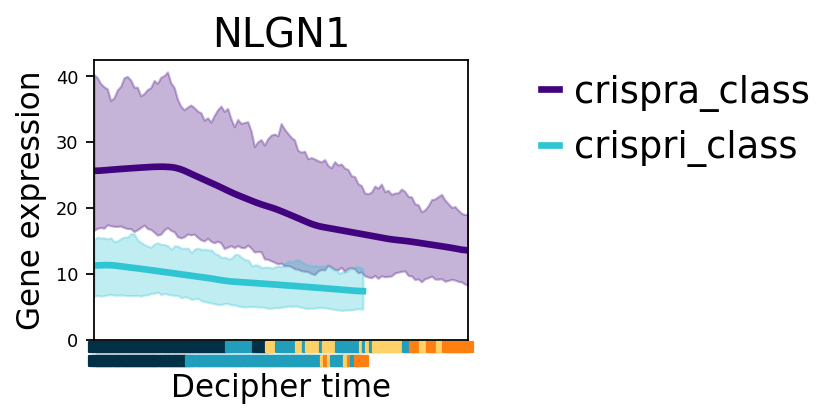

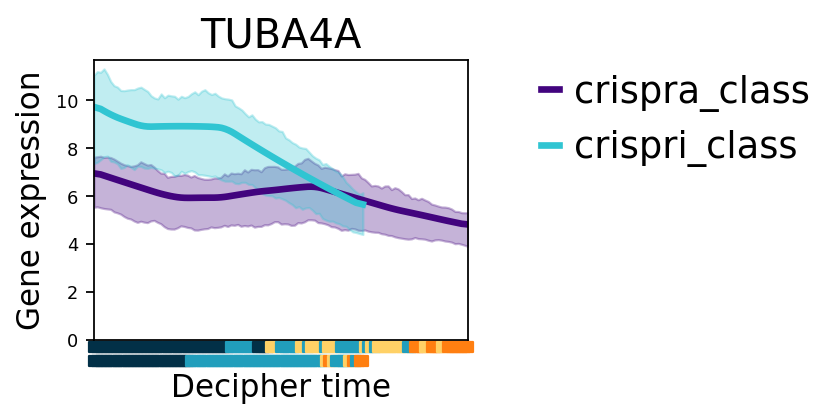

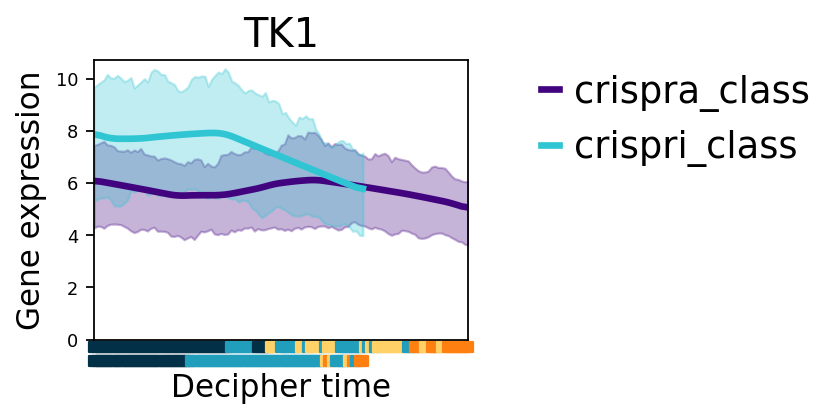

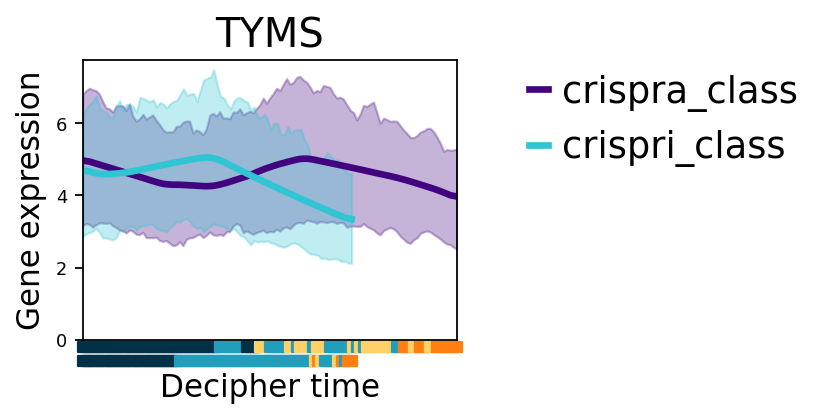

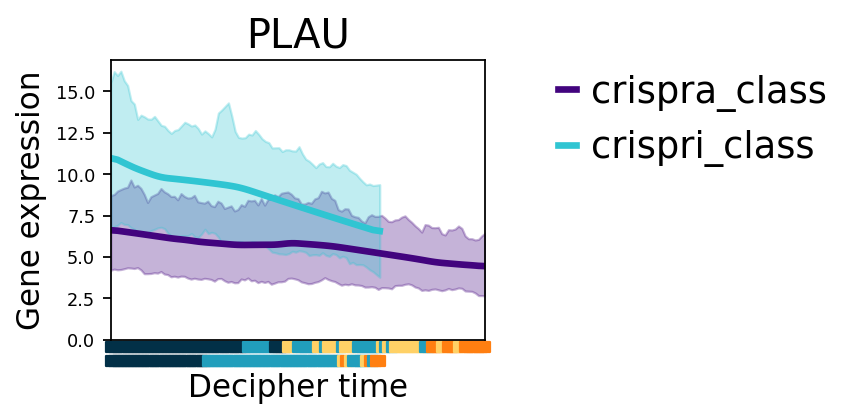

In [47]:

colors = {'Untreated' : '#023047','1to0.25':'#219EBC','1to0.5':'#FFD166','1to1' :'#FF7F11'}
for i in gene_list:
    print(i)
    dc.pl.gene_patterns(adata_concat, i, palette=combined_colors, cell_type_key="treatment")
    #plt.legend(loc='lower right', bbox_to_anchor=(3, 1))  # Change 'upper right' to your desired location
    plt.legend(loc='lower right', bbox_to_anchor=(2, 0.5), frameon = False)  # Adjust location as needed
    # Show the plot
    plt.savefig(f'{figures_dir}/'+ i + '_full_expression_plot.pdf',dpi = 300, bbox_inches='tight')
    plt.savefig(f'{figures_dir}/'+ i + '_full_expression_plot.png',dpi = 300, bbox_inches='tight')
    plt.savefig(f'{figures_dir}/'+ i + '_full_expression_plot.svg',dpi = 300, bbox_inches='tight')
    #plt.show()

In [48]:
def compare_two_perturbations(adata_concat, pert1, pert2):
    # Create a DataFrame with gene_id and perturbation
    gene_pert_df = pd.DataFrame({
        'gene_id': adata_concat.obs['gene_id'],
        'perturbation': adata_concat.obs['perturbation']
    })
    
    # Get genes for each perturbation
    genes_pert1 = set(gene_pert_df[gene_pert_df['perturbation'] == pert1]['gene_id'].unique())
    genes_pert2 = set(gene_pert_df[gene_pert_df['perturbation'] == pert2]['gene_id'].unique())
    
    # Find overlapping genes
    overlapping_genes = genes_pert1.intersection(genes_pert2)
    
    print(f"Found {len(overlapping_genes)} gene IDs present in both '{pert1}' and '{pert2}'")
    print(list(overlapping_genes))
    
    return list(overlapping_genes)

# Usage example (replace with your actual perturbation names)
overlap = compare_two_perturbations(adata_concat, "crispri", 'crispra')

Found 524 gene IDs present in both 'crispri' and 'crispra'
['CDKL2', 'ROCK1', 'ADCK4', 'CDK7', 'EPHA6', 'ERN1', 'CHEK2', 'C9orf96', 'SCYL1', 'TSSK4', 'MAP2K2', 'MAP2K3', 'NEK5', 'PDGFRA', 'CAMK2G', 'CSNK2A1', 'TRPM6', 'EPHA3', 'TYRO3', 'PRKX', 'TSSK6', 'NRBP2', 'RPS6KA3', 'TRIB2', 'PDPK1', 'PLK3', 'PTK2B', 'PRKAA2', 'PDK1', 'TP53RK', 'EIF2AK3', 'PRKCE', 'BUB1', 'random', 'TEK', 'SLK', 'ATR', 'MAPK14', 'ADCK1', 'ACVR2A', 'PIK3CA', 'PAK1', 'GUCY2D', 'CHUK', 'MARK3', 'PIK3C3', 'STK35', 'EPHB1', 'TRIB1', 'VRK1', 'STK38', 'DAPK3', 'LIMK2', 'CSNK1A1', 'PSKH2', 'PDIK1L', 'MAPK9', 'PIM3', 'BMPR1A', 'PIK3CG', 'JAK3', 'PRKG2', 'PASK', 'EPHA7', 'PDK2', 'CDKL5', 'ROCK2', 'FLT1', 'RPS6KA5', 'SPEG', 'CDK13', 'AKT1', 'MYLK2', 'KIT', 'STK36', 'SRC', 'MAPK15', 'NEK4', 'PBK', 'STK17A', 'MAP3K19', 'GRK1', 'FGFR2', 'PTK7', 'PRKDC', 'SBK2', 'BCKDK', 'CDKL3', 'DSTYK', 'MAP3K10', 'DCLK3', 'PLK4', 'PSKH1', 'MAP3K11', 'NEK10', 'PDGFRB', 'HSPB8', 'ROR2', 'ULK4', 'NEK2', 'EGFR', 'RIOK2', 'ICK', 'HIPK3', 'BRD4', 

In [49]:
# def add_cell_type_band(
#     adata, trajectory_name, cell_type_key, ax, palette, n_neighbors=50, offset=1
# ):
#     trajectory = adata.uns["decipher"]["trajectories"][trajectory_name]
#     if (
#         "cell_types" not in trajectory
#         or trajectory["cell_types"]["key"] != cell_type_key
#         or (trajectory["cell_types"]["n_neighbors"] != n_neighbors)
#     ):
#         knc = KNeighborsClassifier(n_neighbors=n_neighbors)
#         knc.fit(adata.obsm[trajectory["rep_key"]], adata.obs[cell_type_key])
#         cell_types = knc.predict(trajectory["points"])
#         trajectory["cell_types"] = {
#             "key": cell_type_key,
#             "n_neighbors": n_neighbors,
#             "values": cell_types,
#         }

#     times = trajectory["times"]
#     cell_types = trajectory["cell_types"]["values"]

#     if palette is None:
#         logging.info("No palette provided for the cell types, using default.")
#         ct = np.unique(cell_types)
#         palette = dict(zip(ct, sns.color_palette(n_colors=len(ct))))

#     plt.scatter(
#         times,
#         np.zeros(len(times)) - 0.05 * offset + 0.025,
#         c=[palette[c] for c in cell_types],
#         marker="s",
#         s=20,
#         transform=plt.gca().get_xaxis_transform(),
#         clip_on=False,
#         edgecolors=None,
#     )
#     ax.xaxis.labelpad = 5 + 5 * offset

In [50]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np

# Your data setup
data = pd.DataFrame({
    'decipher_time': adata_concat.obs['decipher_time'],
    'gene_id': adata_concat.obs['gene_id'],
    'treatment_perturbation': adata_concat.obs['treatment_perturbation'],
    'perturbation': adata_concat.obs['perturbation'],
    'gene_id_perturbation': adata_concat.obs['gene_id'].astype(str) + '' + adata_concat.obs['perturbation'].astype(str)
})

# Filter for crispri only (or adjust as needed)
data_filtered = data[data['gene_id_perturbation'].str.contains('crispri')]

# Get NTC data once
ntc_data = data_filtered[data_filtered['gene_id'] == 'NTC']['decipher_time'].dropna()

# Get all unique gene_ids except NTC
all_genes = data_filtered['gene_id'].unique()
comparison_genes = [gene for gene in all_genes if gene != 'NTC']

print(f"Comparing {len(comparison_genes)} genes with NTC (n={len(ntc_data)})")
print("="*80)

# Store results
results_list = []

# Loop through each gene
for gene in comparison_genes:
    gene_data = data_filtered[data_filtered['gene_id'] == gene]['decipher_time'].dropna()
    
    if len(gene_data) > 0:  # Only proceed if there's data
        # KS test
        ks_stat, ks_pvalue = stats.ks_2samp(ntc_data, gene_data)
        
        # Mann-Whitney U test
        mw_stat, mw_pvalue = stats.mannwhitneyu(ntc_data, gene_data, alternative='two-sided')
        
        # Effect size (Cohen's d)
        def cohens_d(group1, group2):
            n1, n2 = len(group1), len(group2)
            if n1 > 1 and n2 > 1:
                pooled_std = np.sqrt(((n1-1)*group1.var() + (n2-1)*group2.var()) / (n1+n2-2))
                if pooled_std > 0:
                    return (group1.mean() - group2.mean()) / pooled_std
            return np.nan
        
        effect_size = cohens_d(ntc_data, gene_data)
        
        # Store results
        results_list.append({
            'gene_id': gene,
            'n_cells': len(gene_data),
            'mean_diff': gene_data.mean() - ntc_data.mean(),
            'ks_statistic': ks_stat,
            'ks_pvalue': ks_pvalue,
            'mw_statistic': mw_stat,
            'mw_pvalue': mw_pvalue,
            'cohens_d': effect_size,
            'significant_ks': ks_pvalue < 0.05,
            'significant_mw': mw_pvalue < 0.05
        })
        
        print(f"{gene:15s} (n={len(gene_data):4d}): KS p={ks_pvalue:.4f}, MW p={mw_pvalue:.4f}, Cohen's d={effect_size:.3f}")

# Convert to DataFrame for easier analysis
results_df = pd.DataFrame(results_list)

print("\n" + "="*80)
print("SUMMARY:")
print(f"Total genes tested: {len(results_df)}")
print(f"Significant by KS test: {results_df['significant_ks'].sum()}")
print(f"Significant by MW test: {results_df['significant_mw'].sum()}")

# Sort by p-value to see most significant
print(f"\nTop 10 most significant (by KS test):")
top_significant = results_df.sort_values('ks_pvalue').head(10)
print(top_significant[['gene_id', 'n_cells', 'ks_pvalue', 'mw_pvalue', 'cohens_d']].to_string(index=False))

Comparing 523 genes with NTC (n=891)
STK35           (n=  81): KS p=0.0139, MW p=0.0776, Cohen's d=-0.258
TRIB1           (n= 111): KS p=0.9647, MW p=0.5217, Cohen's d=0.066
MAP3K11         (n= 152): KS p=0.5408, MW p=0.2403, Cohen's d=0.109
ACVR2B          (n=  78): KS p=0.9556, MW p=0.9434, Cohen's d=0.056
MAP2K1          (n=  99): KS p=0.7604, MW p=0.3601, Cohen's d=0.085
PIK3C2G         (n=  72): KS p=0.6820, MW p=0.6813, Cohen's d=-0.016
GRK6            (n=  53): KS p=0.0238, MW p=0.0091, Cohen's d=0.349
DYRK4           (n=  98): KS p=0.3476, MW p=0.3579, Cohen's d=0.058
MAPK7           (n= 159): KS p=0.8271, MW p=0.5509, Cohen's d=0.050
SPEG            (n= 154): KS p=0.5189, MW p=0.5632, Cohen's d=0.042
GRK1            (n=  57): KS p=0.9935, MW p=0.7718, Cohen's d=-0.053
FRK             (n=  78): KS p=0.2384, MW p=0.2353, Cohen's d=-0.083
CDK6            (n= 160): KS p=0.9316, MW p=0.9568, Cohen's d=-0.016
PDK2            (n= 140): KS p=0.8436, MW p=0.9141, Cohen's d=0.053
MYLK2 

In [51]:
significant_genes = results_df[results_df['significant_ks'] | results_df['significant_mw']]
significant_genes_crispri = significant_genes
significant_genes_crispri.to_csv(f'{figures_dir}/significant_genes_crispri.csv', index=False)

In [52]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np

# Your data setup
data = pd.DataFrame({
    'decipher_time': adata_concat.obs['decipher_time'],
    'gene_id': adata_concat.obs['gene_id'],
    'treatment_perturbation': adata_concat.obs['treatment_perturbation'],
    'perturbation': adata_concat.obs['perturbation'],
    'gene_id_perturbation': adata_concat.obs['gene_id'].astype(str) + '' + adata_concat.obs['perturbation'].astype(str)
})

# Filter for crispri only (or adjust as needed)
data_filtered = data[data['gene_id_perturbation'].str.contains('crispra')]

# Get NTC data once
ntc_data = data_filtered[data_filtered['gene_id'] == 'NTC']['decipher_time'].dropna()

# Get all unique gene_ids except NTC
all_genes = data_filtered['gene_id'].unique()
comparison_genes = [gene for gene in all_genes if gene != 'NTC']

print(f"Comparing {len(comparison_genes)} genes with NTC (n={len(ntc_data)})")
print("="*80)

# Store results
results_list = []

# Loop through each gene
for gene in comparison_genes:
    gene_data = data_filtered[data_filtered['gene_id'] == gene]['decipher_time'].dropna()
    
    if len(gene_data) > 0:  # Only proceed if there's data
        # KS test
        ks_stat, ks_pvalue = stats.ks_2samp(ntc_data, gene_data)
        
        # Mann-Whitney U test
        mw_stat, mw_pvalue = stats.mannwhitneyu(ntc_data, gene_data, alternative='two-sided')
        
        # Effect size (Cohen's d)
        def cohens_d(group1, group2):
            n1, n2 = len(group1), len(group2)
            if n1 > 1 and n2 > 1:
                pooled_std = np.sqrt(((n1-1)*group1.var() + (n2-1)*group2.var()) / (n1+n2-2))
                if pooled_std > 0:
                    return (group1.mean() - group2.mean()) / pooled_std
            return np.nan
        
        effect_size = cohens_d(ntc_data, gene_data)
        
        # Store results
        results_list.append({
            'gene_id': gene,
            'n_cells': len(gene_data),
            'mean_diff': gene_data.mean() - ntc_data.mean(),
            'ks_statistic': ks_stat,
            'ks_pvalue': ks_pvalue,
            'mw_statistic': mw_stat,
            'mw_pvalue': mw_pvalue,
            'cohens_d': effect_size,
            'significant_ks': ks_pvalue < 0.05,
            'significant_mw': mw_pvalue < 0.05
        })
        
        print(f"{gene:15s} (n={len(gene_data):4d}): KS p={ks_pvalue:.4f}, MW p={mw_pvalue:.4f}, Cohen's d={effect_size:.3f}")

# Convert to DataFrame for easier analysis
results_df = pd.DataFrame(results_list)

print("\n" + "="*80)
print("SUMMARY:")
print(f"Total genes tested: {len(results_df)}")
print(f"Significant by KS test: {results_df['significant_ks'].sum()}")
print(f"Significant by MW test: {results_df['significant_mw'].sum()}")

# Sort by p-value to see most significant
print(f"\nTop 10 most significant (by KS test):")
top_significant = results_df.sort_values('ks_pvalue').head(10)
print(top_significant[['gene_id', 'n_cells', 'ks_pvalue', 'mw_pvalue', 'cohens_d']].to_string(index=False))

Comparing 523 genes with NTC (n=8161)
TAF1            (n=  88): KS p=0.3726, MW p=0.2099, Cohen's d=0.047
random          (n= 346): KS p=1.0000, MW p=0.8861, Cohen's d=0.009
CDK6            (n= 252): KS p=0.3331, MW p=0.5091, Cohen's d=-0.056
RET             (n= 364): KS p=0.7946, MW p=0.4889, Cohen's d=-0.033
MAPK8           (n= 157): KS p=0.5809, MW p=0.3322, Cohen's d=0.085
BMPR1A          (n= 113): KS p=0.1373, MW p=0.1012, Cohen's d=-0.178
ACVRL1          (n= 164): KS p=0.9184, MW p=0.7171, Cohen's d=0.016
LRRK1           (n= 189): KS p=0.7381, MW p=0.3763, Cohen's d=-0.067
ABL2            (n= 228): KS p=0.6945, MW p=0.6072, Cohen's d=0.050
CDC7            (n=  85): KS p=0.6214, MW p=0.2267, Cohen's d=0.109
CDKL3           (n= 279): KS p=0.7523, MW p=0.5057, Cohen's d=-0.065
PAK6            (n= 278): KS p=0.1756, MW p=0.4140, Cohen's d=0.073
TEK             (n= 108): KS p=0.9837, MW p=0.6511, Cohen's d=0.002
MAST1           (n= 201): KS p=0.6455, MW p=0.7724, Cohen's d=-0.034
PTK2

In [53]:
significant_genes = results_df[results_df['significant_ks'] | results_df['significant_mw']]
significant_genes_crispra = significant_genes

In [54]:
significant_genes_crispra.to_csv(f'{figures_dir}/significant_genes_crispra.csv', index=False)

In [55]:
combined_genes = set(significant_genes_crispri['gene_id']).union(set(significant_genes_crispra['gene_id']))

# Convert the combined set back to a list if needed
combined_genes_list = list(combined_genes)

print(f"Total unique genes: {len(combined_genes_list)}")
print(combined_genes_list)

Total unique genes: 60
['EPHB6', 'NLK', 'LATS2', 'NEK4', 'SYK', 'ULK3', 'PIM1', 'GSK3A', 'MAPKAPK5', 'TSSK4', 'SNRK', 'MAP4K2', 'IRAK4', 'IRAK1', 'STK35', 'MST1R', 'GRK6', 'TSSK6', 'SGK494', 'MAPK6', 'DYRK4', 'FLT4', 'MAST4', 'TRIB3', 'TSSK2', 'SRPK3', 'PIK3CB', 'CDC7', 'EPHA2', 'CASK', 'IRAK3', 'PIM3', 'RIOK1', 'PINK1', 'RPS6KA5', 'PLK3', 'MAP4K5', 'CAMKK1', 'AURKB', 'MAPKAPK2', 'MAP3K9', 'MYLK', 'STK32B', 'STK17B', 'CDK3', 'SIK1', 'MKNK1', 'CDK11A', 'AURKC', 'IGF1R', 'CDC42BPG', 'BRD4', 'PDK2', 'ROCK2', 'PRKCD', 'ITK', 'MAPK10', 'PLK1', 'STK40', 'AKT1']


In [56]:
# Compare states
from sklearn.neighbors import KNeighborsClassifier

data = pd.DataFrame({
    'decipher_time': adata_concat.obs['decipher_time'],
    'gene_id': adata_concat.obs['gene_id'],
    'treatment_perturbation': adata_concat.obs['treatment_perturbation'],
    'perturbation': adata_concat.obs['perturbation'],
    'gene_id_perturbation': adata_concat.obs['gene_id'].astype(str) + '_' + adata_concat.obs['perturbation'].astype(str)
    })

# If you want to filter for specific gene_ids
# Convert categorical columns to string before concatenation


In [57]:
def add_cell_type_band(
    adata, trajectory_name, cell_type_key, ax, palette, n_neighbors=50, offset=1
):
    trajectory = adata.uns["decipher"]["trajectories"][trajectory_name]
    if (
        "cell_types" not in trajectory
        or trajectory["cell_types"]["key"] != cell_type_key
        or (trajectory["cell_types"]["n_neighbors"] != n_neighbors)
    ):
        knc = KNeighborsClassifier(n_neighbors=n_neighbors)
        knc.fit(adata.obsm[trajectory["rep_key"]], adata.obs[cell_type_key])
        cell_types = knc.predict(trajectory["points"])
        trajectory["cell_types"] = {
            "key": cell_type_key,
            "n_neighbors": n_neighbors,
            "values": cell_types,
        }
    times = trajectory["times"]
    cell_types = trajectory["cell_types"]["values"]
    if palette is None:
        logging.info("No palette provided for the cell types, using default.")
        ct = np.unique(cell_types)
        palette = dict(zip(ct, sns.color_palette(n_colors=len(ct))))
    
    # Fixed: Use ax.scatter() instead of plt.scatter() and ax.get_xaxis_transform()
    ax.scatter(
        times,
        np.zeros(len(times)) - 0.05 * offset + 0.025,
        c=[palette[c] for c in cell_types],
        marker="s",
        s=20,
        transform=ax.get_xaxis_transform(),  # Use the passed ax parameter
        clip_on=False,
        edgecolors=None,
    )
    ax.xaxis.labelpad = 5 + 5 * offset

In [58]:
crispr_colors

{'crispri': '#30C5D2', 'crispra': '#42047e'}

In [59]:
crispr_colors['crispri']

'#30C5D2'

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:34,078 | INFO : maxp pruned
2025-12-08 00:21:34,082 | INFO : cmap pruned
2025-12-08 00:21:34,082 | INFO : kern dropped
2025-12-08 00:21:34,082 | INFO : post pruned
2025-12-08 00:21:34,082 | INFO : FFTM dropped
2025-12-08 00:21:34,083 | INFO : GPOS pruned
2025-12-08 00:21:34,085 | INFO : GSUB pruned
2025-12-08 00:21:34,088 | INFO : glyf pruned
2025-12-08 00:21:34,088 | INFO : Added gid0 to subset
2025-12-08 00:21:34,088 | INFO : Added first four glyphs to subset
2025-12-08 00:21:34,089 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:34,089 | INFO : Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'E', 'H', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:34,089 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 25, 29, 37, 38, 39, 40, 43, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85

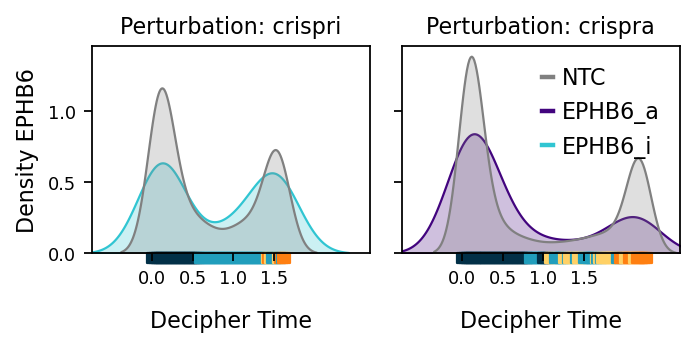

2025-12-08 00:21:34,385 | INFO : maxp pruned
2025-12-08 00:21:34,390 | INFO : cmap pruned
2025-12-08 00:21:34,390 | INFO : kern dropped
2025-12-08 00:21:34,390 | INFO : post pruned
2025-12-08 00:21:34,390 | INFO : FFTM dropped
2025-12-08 00:21:34,391 | INFO : GPOS pruned
2025-12-08 00:21:34,393 | INFO : GSUB pruned
2025-12-08 00:21:34,398 | INFO : glyf pruned
2025-12-08 00:21:34,400 | INFO : Added gid0 to subset
2025-12-08 00:21:34,400 | INFO : Added first four glyphs to subset
2025-12-08 00:21:34,400 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2025-12-08 00:21:34,400 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'L', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:34,400 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 46, 47, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


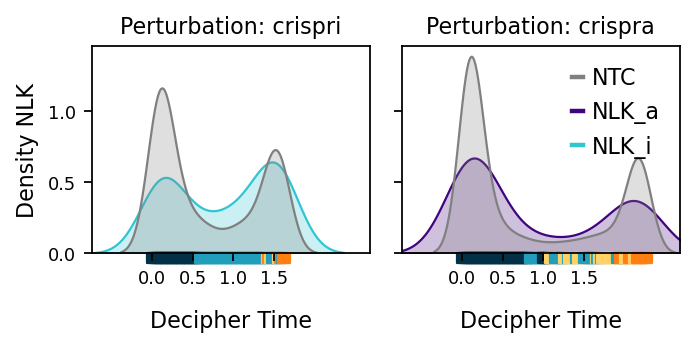

2025-12-08 00:21:34,727 | INFO : maxp pruned
2025-12-08 00:21:34,732 | INFO : cmap pruned
2025-12-08 00:21:34,732 | INFO : kern dropped
2025-12-08 00:21:34,732 | INFO : post pruned
2025-12-08 00:21:34,732 | INFO : FFTM dropped
2025-12-08 00:21:34,733 | INFO : GPOS pruned
2025-12-08 00:21:34,735 | INFO : GSUB pruned
2025-12-08 00:21:34,739 | INFO : glyf pruned
2025-12-08 00:21:34,740 | INFO : Added gid0 to subset
2025-12-08 00:21:34,740 | INFO : Added first four glyphs to subset
2025-12-08 00:21:34,740 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:34,740 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'L', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:34,741 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 29, 36, 38, 39, 47, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:34,743 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'L', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:34,743 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 29, 36, 38, 39, 47, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
2025-12-08 00:21:34,743 | INFO : Closing glyph list over 'glyf': 34 glyphs before
2025-12-08 00:21:34,744 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'L', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:34,744 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 29, 36, 38, 39, 47, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
2025-12-08 0

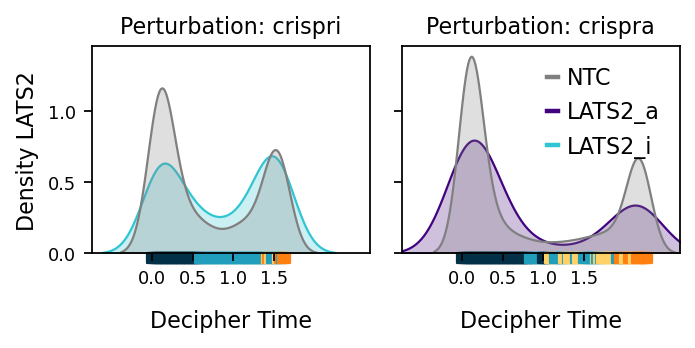

2025-12-08 00:21:35,015 | INFO : maxp pruned
2025-12-08 00:21:35,018 | INFO : cmap pruned
2025-12-08 00:21:35,019 | INFO : kern dropped
2025-12-08 00:21:35,019 | INFO : post pruned
2025-12-08 00:21:35,019 | INFO : FFTM dropped
2025-12-08 00:21:35,021 | INFO : GPOS pruned
2025-12-08 00:21:35,374 | INFO : GSUB pruned


Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:35,377 | INFO : glyf pruned
2025-12-08 00:21:35,378 | INFO : Added gid0 to subset
2025-12-08 00:21:35,378 | INFO : Added first four glyphs to subset
2025-12-08 00:21:35,378 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:35,378 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'E', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:35,379 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 29, 38, 39, 40, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
2025-12-08 00:21:35,380 | INFO : Closed glyph list over 'GSUB': 33 glyphs after
2025-12-08 00:21:35,380 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'E', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'sp

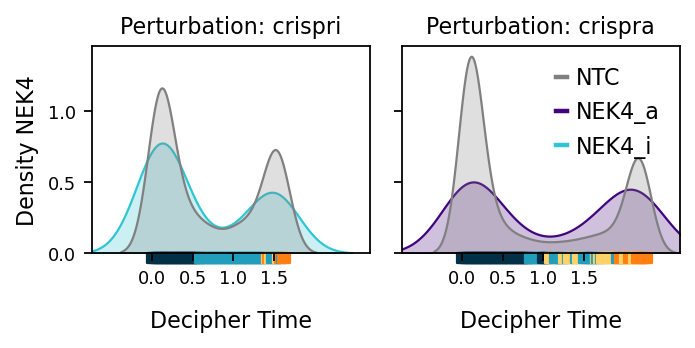

2025-12-08 00:21:35,696 | INFO : maxp pruned
2025-12-08 00:21:35,699 | INFO : cmap pruned
2025-12-08 00:21:35,700 | INFO : kern dropped
2025-12-08 00:21:35,700 | INFO : post pruned
2025-12-08 00:21:35,700 | INFO : FFTM dropped
2025-12-08 00:21:35,701 | INFO : GPOS pruned
2025-12-08 00:21:35,702 | INFO : GSUB pruned
2025-12-08 00:21:35,704 | INFO : glyf pruned
2025-12-08 00:21:35,705 | INFO : Added gid0 to subset
2025-12-08 00:21:35,705 | INFO : Added first four glyphs to subset
2025-12-08 00:21:35,705 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:35,705 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'Y', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:35,706 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 46, 49, 51, 54, 55, 60, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:35,721 | INFO : GPOS subsetted
2025-12-08 00:21:35,722 | INFO : GSUB subsetted
2025-12-08 00:21:35,722 | INFO : name subsetting not needed
2025-12-08 00:21:35,722 | INFO : glyf subsetted
2025-12-08 00:21:35,723 | INFO : head pruned
2025-12-08 00:21:35,723 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:35,723 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:35,723 | INFO : glyf pruned
2025-12-08 00:21:35,723 | INFO : GDEF pruned
2025-12-08 00:21:35,724 | INFO : GPOS pruned
2025-12-08 00:21:35,724 | INFO : GSUB pruned
2025-12-08 00:21:35,725 | INFO : name pruned


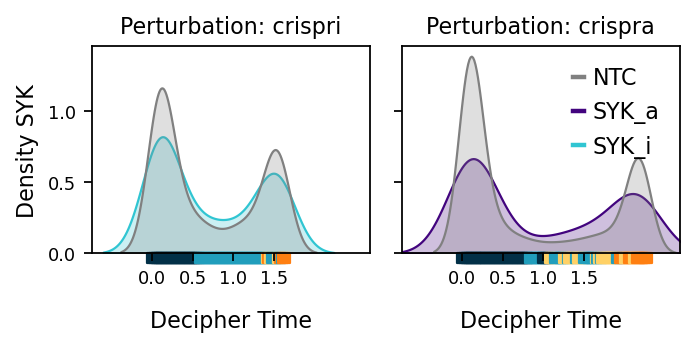

2025-12-08 00:21:36,002 | INFO : maxp pruned
2025-12-08 00:21:36,005 | INFO : cmap pruned
2025-12-08 00:21:36,006 | INFO : kern dropped
2025-12-08 00:21:36,006 | INFO : post pruned
2025-12-08 00:21:36,006 | INFO : FFTM dropped
2025-12-08 00:21:36,006 | INFO : GPOS pruned
2025-12-08 00:21:36,008 | INFO : GSUB pruned
2025-12-08 00:21:36,011 | INFO : glyf pruned
2025-12-08 00:21:36,011 | INFO : Added gid0 to subset
2025-12-08 00:21:36,011 | INFO : Added first four glyphs to subset
2025-12-08 00:21:36,012 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:36,012 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'L', 'N', 'P', 'T', 'U', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:36,012 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 38, 39, 46, 47, 49, 51, 55, 56, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:36,033 | INFO : name pruned


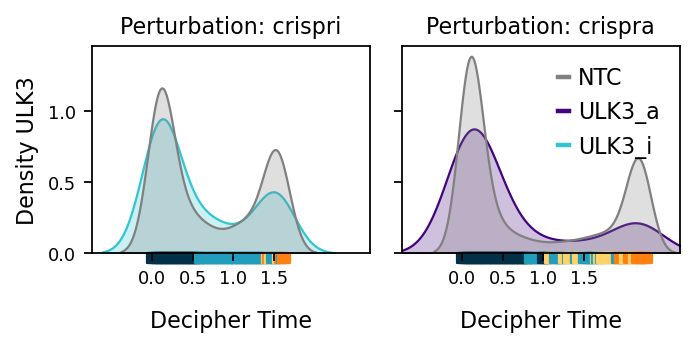

2025-12-08 00:21:36,320 | INFO : maxp pruned
2025-12-08 00:21:36,324 | INFO : cmap pruned
2025-12-08 00:21:36,324 | INFO : kern dropped
2025-12-08 00:21:36,324 | INFO : post pruned
2025-12-08 00:21:36,324 | INFO : FFTM dropped
2025-12-08 00:21:36,325 | INFO : GPOS pruned
2025-12-08 00:21:36,326 | INFO : GSUB pruned
2025-12-08 00:21:36,329 | INFO : glyf pruned
2025-12-08 00:21:36,330 | INFO : Added gid0 to subset
2025-12-08 00:21:36,330 | INFO : Added first four glyphs to subset
2025-12-08 00:21:36,330 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2025-12-08 00:21:36,330 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'I', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:36,330 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 44, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


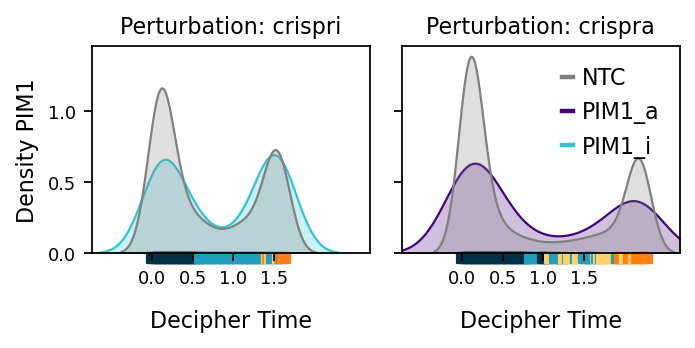

2025-12-08 00:21:36,638 | INFO : maxp pruned
2025-12-08 00:21:36,642 | INFO : cmap pruned
2025-12-08 00:21:36,642 | INFO : kern dropped
2025-12-08 00:21:36,642 | INFO : post pruned
2025-12-08 00:21:36,642 | INFO : FFTM dropped
2025-12-08 00:21:36,643 | INFO : GPOS pruned
2025-12-08 00:21:36,644 | INFO : GSUB pruned
2025-12-08 00:21:36,647 | INFO : glyf pruned
2025-12-08 00:21:36,648 | INFO : Added gid0 to subset
2025-12-08 00:21:36,648 | INFO : Added first four glyphs to subset
2025-12-08 00:21:36,648 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2025-12-08 00:21:36,648 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'G', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:36,649 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 36, 38, 39, 42, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81,

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


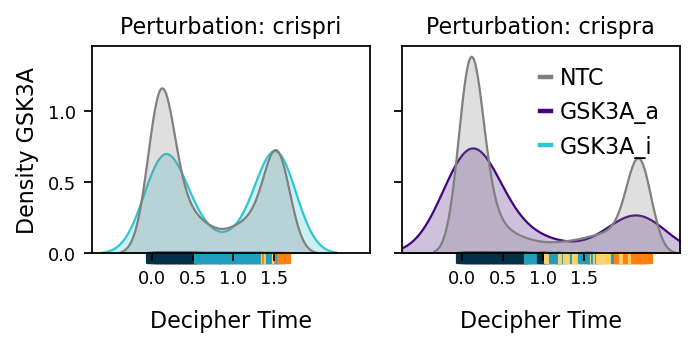

2025-12-08 00:21:36,968 | INFO : maxp pruned
2025-12-08 00:21:36,972 | INFO : cmap pruned
2025-12-08 00:21:36,972 | INFO : kern dropped
2025-12-08 00:21:36,972 | INFO : post pruned
2025-12-08 00:21:36,972 | INFO : FFTM dropped
2025-12-08 00:21:36,973 | INFO : GPOS pruned
2025-12-08 00:21:36,974 | INFO : GSUB pruned
2025-12-08 00:21:36,977 | INFO : glyf pruned
2025-12-08 00:21:36,978 | INFO : Added gid0 to subset
2025-12-08 00:21:36,978 | INFO : Added first four glyphs to subset
2025-12-08 00:21:36,978 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:36,978 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:36,979 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:36,985 | INFO : fpgm subsetting not needed
2025-12-08 00:21:36,985 | INFO : prep subsetting not needed
2025-12-08 00:21:36,985 | INFO : cvt  subsetting not needed
2025-12-08 00:21:36,985 | INFO : loca subsetting not needed
2025-12-08 00:21:36,985 | INFO : post subsetted
2025-12-08 00:21:36,985 | INFO : gasp subsetting not needed
2025-12-08 00:21:36,986 | INFO : MATH subsetted
2025-12-08 00:21:36,986 | INFO : GDEF subsetted
2025-12-08 00:21:36,993 | INFO : GPOS subsetted
2025-12-08 00:21:36,994 | INFO : GSUB subsetted
2025-12-08 00:21:36,994 | INFO : name subsetting not needed
2025-12-08 00:21:36,995 | INFO : glyf subsetted
2025-12-08 00:21:36,995 | INFO : head pruned
2025-12-08 00:21:36,995 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:36,995 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:36,996 | INFO : glyf pruned
2025-12-08 00:21:36,996 | INFO : GDEF pruned
2025-12-08 00:21:36,996 | INFO : GPOS pruned
2025-12-08 00:21:36,996 | INFO : GSUB pru

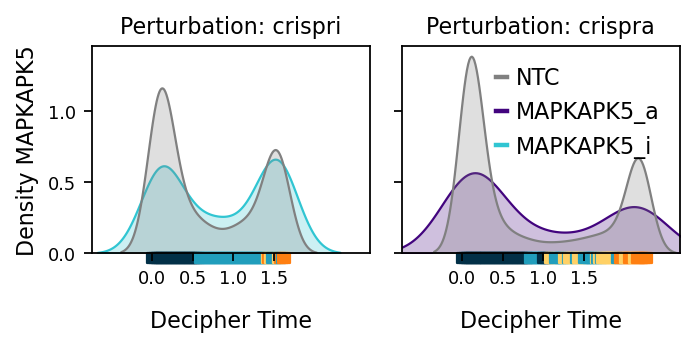

2025-12-08 00:21:37,270 | INFO : maxp pruned
2025-12-08 00:21:37,273 | INFO : cmap pruned
2025-12-08 00:21:37,274 | INFO : kern dropped
2025-12-08 00:21:37,274 | INFO : post pruned
2025-12-08 00:21:37,274 | INFO : FFTM dropped
2025-12-08 00:21:37,276 | INFO : GPOS pruned
2025-12-08 00:21:37,277 | INFO : GSUB pruned
2025-12-08 00:21:37,279 | INFO : glyf pruned
2025-12-08 00:21:37,280 | INFO : Added gid0 to subset
2025-12-08 00:21:37,280 | INFO : Added first four glyphs to subset
2025-12-08 00:21:37,280 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:37,280 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:37,281 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 29, 38, 39, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


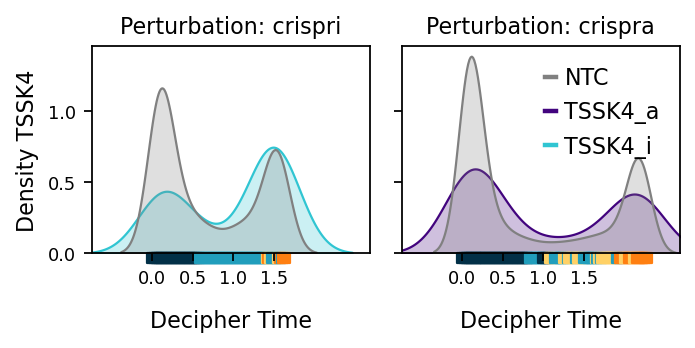

2025-12-08 00:21:37,550 | INFO : maxp pruned
2025-12-08 00:21:37,554 | INFO : cmap pruned
2025-12-08 00:21:37,554 | INFO : kern dropped
2025-12-08 00:21:37,554 | INFO : post pruned
2025-12-08 00:21:37,554 | INFO : FFTM dropped
2025-12-08 00:21:37,555 | INFO : GPOS pruned
2025-12-08 00:21:37,556 | INFO : GSUB pruned
2025-12-08 00:21:37,560 | INFO : glyf pruned
2025-12-08 00:21:37,560 | INFO : Added gid0 to subset
2025-12-08 00:21:37,560 | INFO : Added first four glyphs to subset
2025-12-08 00:21:37,560 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:37,561 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'R', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:37,561 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 46, 49, 51, 53, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


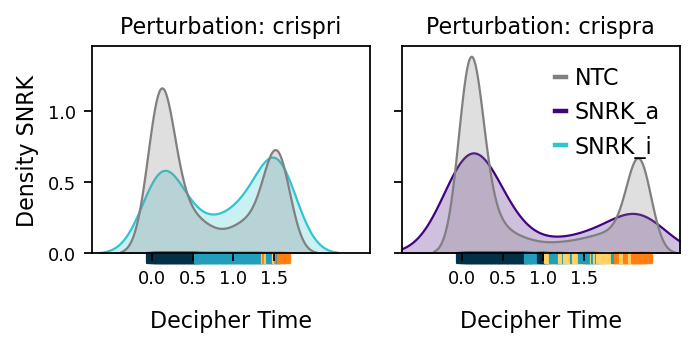

2025-12-08 00:21:37,836 | INFO : maxp pruned
2025-12-08 00:21:37,839 | INFO : cmap pruned
2025-12-08 00:21:37,839 | INFO : kern dropped
2025-12-08 00:21:37,840 | INFO : post pruned
2025-12-08 00:21:37,840 | INFO : FFTM dropped
2025-12-08 00:21:37,840 | INFO : GPOS pruned
2025-12-08 00:21:37,842 | INFO : GSUB pruned
2025-12-08 00:21:37,845 | INFO : glyf pruned
2025-12-08 00:21:37,845 | INFO : Added gid0 to subset
2025-12-08 00:21:37,845 | INFO : Added first four glyphs to subset
2025-12-08 00:21:37,845 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2025-12-08 00:21:37,845 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:37,846 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 23, 24, 29, 36, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


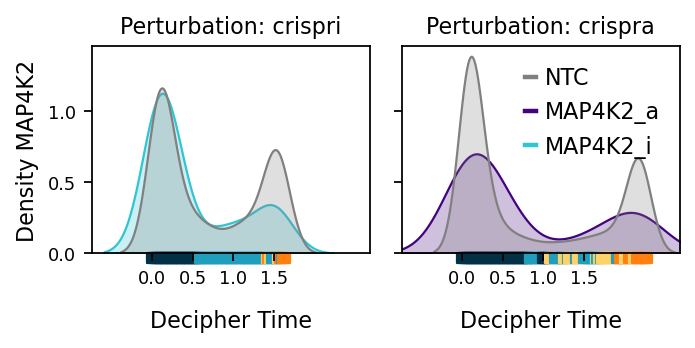

2025-12-08 00:21:38,111 | INFO : maxp pruned
2025-12-08 00:21:38,115 | INFO : cmap pruned
2025-12-08 00:21:38,115 | INFO : kern dropped
2025-12-08 00:21:38,116 | INFO : post pruned
2025-12-08 00:21:38,116 | INFO : FFTM dropped
2025-12-08 00:21:38,117 | INFO : GPOS pruned
2025-12-08 00:21:38,119 | INFO : GSUB pruned
2025-12-08 00:21:38,121 | INFO : glyf pruned
2025-12-08 00:21:38,122 | INFO : Added gid0 to subset
2025-12-08 00:21:38,122 | INFO : Added first four glyphs to subset
2025-12-08 00:21:38,122 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2025-12-08 00:21:38,122 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'I', 'K', 'N', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:38,123 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 29, 36, 38, 39, 44, 46, 49, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:38,429 | INFO : GPOS subsetted
2025-12-08 00:21:38,431 | INFO : GSUB subsetted
2025-12-08 00:21:38,431 | INFO : name subsetting not needed
2025-12-08 00:21:38,432 | INFO : glyf subsetted
2025-12-08 00:21:38,432 | INFO : head pruned
2025-12-08 00:21:38,432 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:38,432 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:38,433 | INFO : glyf pruned
2025-12-08 00:21:38,433 | INFO : GDEF pruned
2025-12-08 00:21:38,433 | INFO : GPOS pruned
2025-12-08 00:21:38,433 | INFO : GSUB pruned
2025-12-08 00:21:38,435 | INFO : name pruned


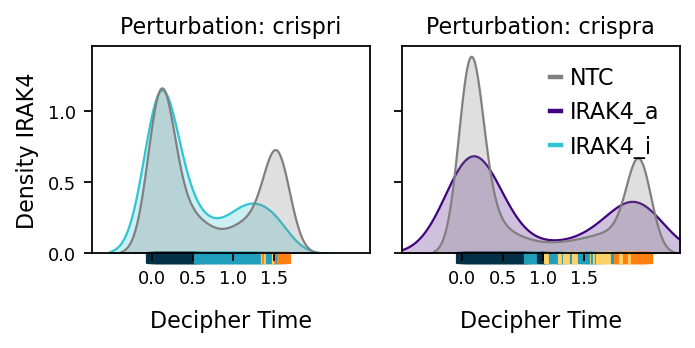

2025-12-08 00:21:38,692 | INFO : maxp pruned
2025-12-08 00:21:38,696 | INFO : cmap pruned
2025-12-08 00:21:38,696 | INFO : kern dropped
2025-12-08 00:21:38,696 | INFO : post pruned
2025-12-08 00:21:38,696 | INFO : FFTM dropped
2025-12-08 00:21:38,697 | INFO : GPOS pruned
2025-12-08 00:21:38,699 | INFO : GSUB pruned
2025-12-08 00:21:38,701 | INFO : glyf pruned
2025-12-08 00:21:38,702 | INFO : Added gid0 to subset
2025-12-08 00:21:38,702 | INFO : Added first four glyphs to subset
2025-12-08 00:21:38,702 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:38,702 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'I', 'K', 'N', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:38,702 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 44, 46, 49, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


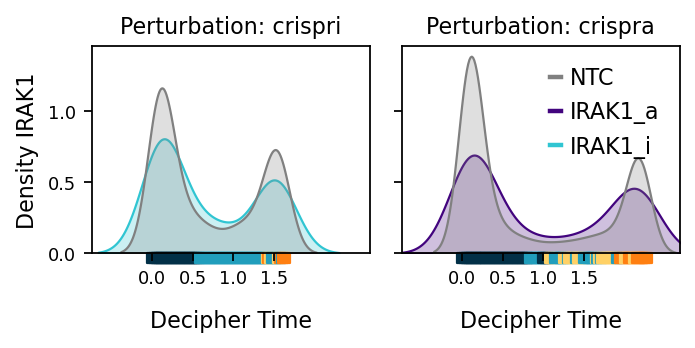

2025-12-08 00:21:38,972 | INFO : maxp pruned
2025-12-08 00:21:38,975 | INFO : cmap pruned
2025-12-08 00:21:38,976 | INFO : kern dropped
2025-12-08 00:21:38,976 | INFO : post pruned
2025-12-08 00:21:38,976 | INFO : FFTM dropped
2025-12-08 00:21:38,978 | INFO : GPOS pruned
2025-12-08 00:21:38,979 | INFO : GSUB pruned
2025-12-08 00:21:38,981 | INFO : glyf pruned
2025-12-08 00:21:38,982 | INFO : Added gid0 to subset
2025-12-08 00:21:38,982 | INFO : Added first four glyphs to subset
2025-12-08 00:21:38,982 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:38,982 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:38,983 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 38, 39, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


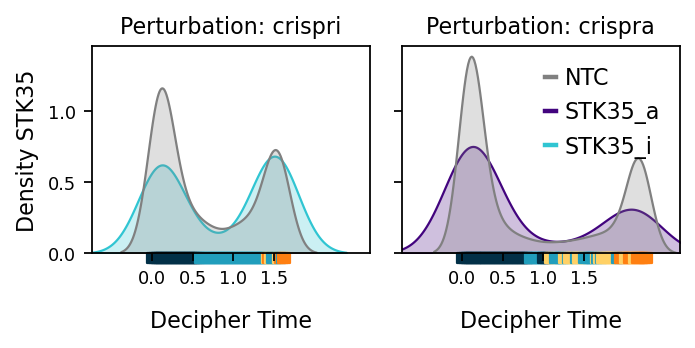

2025-12-08 00:21:39,305 | INFO : maxp pruned
2025-12-08 00:21:39,309 | INFO : cmap pruned
2025-12-08 00:21:39,309 | INFO : kern dropped
2025-12-08 00:21:39,309 | INFO : post pruned
2025-12-08 00:21:39,309 | INFO : FFTM dropped
2025-12-08 00:21:39,310 | INFO : GPOS pruned
2025-12-08 00:21:39,311 | INFO : GSUB pruned
2025-12-08 00:21:39,314 | INFO : glyf pruned
2025-12-08 00:21:39,315 | INFO : Added gid0 to subset
2025-12-08 00:21:39,315 | INFO : Added first four glyphs to subset
2025-12-08 00:21:39,315 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:39,315 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'M', 'N', 'P', 'R', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:39,316 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 48, 49, 51, 53, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:39,323 | INFO : cmap subsetted
2025-12-08 00:21:39,323 | INFO : fpgm subsetting not needed
2025-12-08 00:21:39,323 | INFO : prep subsetting not needed
2025-12-08 00:21:39,323 | INFO : cvt  subsetting not needed
2025-12-08 00:21:39,323 | INFO : loca subsetting not needed
2025-12-08 00:21:39,323 | INFO : post subsetted
2025-12-08 00:21:39,323 | INFO : gasp subsetting not needed
2025-12-08 00:21:39,323 | INFO : MATH subsetted
2025-12-08 00:21:39,324 | INFO : GDEF subsetted
2025-12-08 00:21:39,331 | INFO : GPOS subsetted
2025-12-08 00:21:39,332 | INFO : GSUB subsetted
2025-12-08 00:21:39,332 | INFO : name subsetting not needed
2025-12-08 00:21:39,332 | INFO : glyf subsetted
2025-12-08 00:21:39,333 | INFO : head pruned
2025-12-08 00:21:39,333 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:39,333 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:39,333 | INFO : glyf pruned
2025-12-08 00:21:39,333 | INFO : GDEF pruned
2025-12-08 00:21:39,333 | INFO : GPOS 

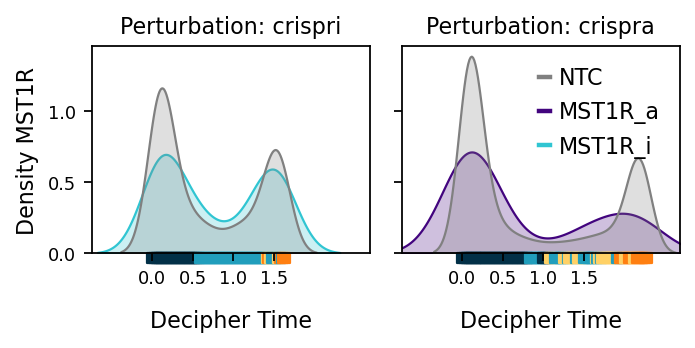

2025-12-08 00:21:39,600 | INFO : maxp pruned
2025-12-08 00:21:39,604 | INFO : cmap pruned
2025-12-08 00:21:39,604 | INFO : kern dropped
2025-12-08 00:21:39,604 | INFO : post pruned
2025-12-08 00:21:39,604 | INFO : FFTM dropped
2025-12-08 00:21:39,605 | INFO : GPOS pruned
2025-12-08 00:21:39,606 | INFO : GSUB pruned
2025-12-08 00:21:39,609 | INFO : glyf pruned
2025-12-08 00:21:39,610 | INFO : Added gid0 to subset
2025-12-08 00:21:39,610 | INFO : Added first four glyphs to subset
2025-12-08 00:21:39,610 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:39,610 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'K', 'N', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:39,611 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 25, 29, 38, 39, 42, 46, 49, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


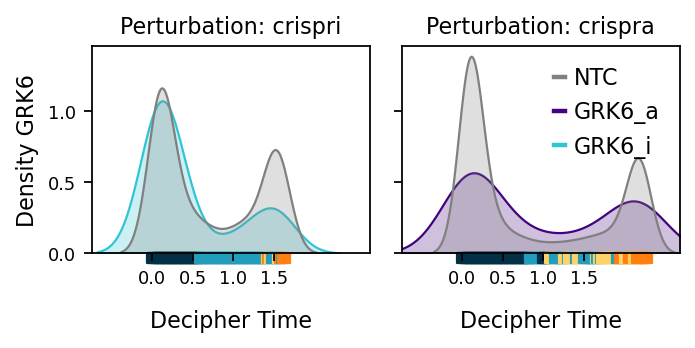

2025-12-08 00:21:39,889 | INFO : maxp pruned
2025-12-08 00:21:39,893 | INFO : cmap pruned
2025-12-08 00:21:39,893 | INFO : kern dropped
2025-12-08 00:21:39,894 | INFO : post pruned
2025-12-08 00:21:39,894 | INFO : FFTM dropped
2025-12-08 00:21:39,895 | INFO : GPOS pruned
2025-12-08 00:21:39,896 | INFO : GSUB pruned
2025-12-08 00:21:39,899 | INFO : glyf pruned
2025-12-08 00:21:39,900 | INFO : Added gid0 to subset
2025-12-08 00:21:39,900 | INFO : Added first four glyphs to subset
2025-12-08 00:21:39,900 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:39,900 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:39,901 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 25, 29, 38, 39, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87,

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


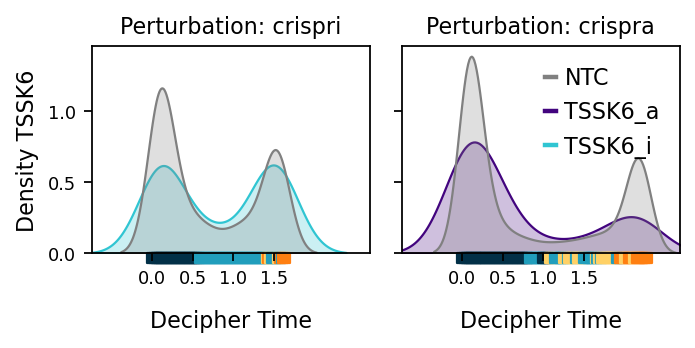

2025-12-08 00:21:40,168 | INFO : maxp pruned
2025-12-08 00:21:40,172 | INFO : cmap pruned
2025-12-08 00:21:40,172 | INFO : kern dropped
2025-12-08 00:21:40,172 | INFO : post pruned
2025-12-08 00:21:40,172 | INFO : FFTM dropped
2025-12-08 00:21:40,174 | INFO : GPOS pruned
2025-12-08 00:21:40,175 | INFO : GSUB pruned
2025-12-08 00:21:40,177 | INFO : glyf pruned
2025-12-08 00:21:40,178 | INFO : Added gid0 to subset
2025-12-08 00:21:40,178 | INFO : Added first four glyphs to subset
2025-12-08 00:21:40,178 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2025-12-08 00:21:40,178 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'G', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:40,179 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 28, 29, 38, 39, 42, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


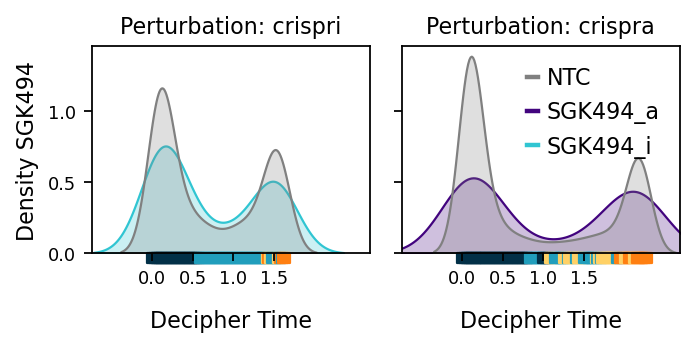

2025-12-08 00:21:40,497 | INFO : maxp pruned
2025-12-08 00:21:40,501 | INFO : cmap pruned
2025-12-08 00:21:40,501 | INFO : kern dropped
2025-12-08 00:21:40,502 | INFO : post pruned
2025-12-08 00:21:40,502 | INFO : FFTM dropped
2025-12-08 00:21:40,503 | INFO : GPOS pruned
2025-12-08 00:21:40,504 | INFO : GSUB pruned
2025-12-08 00:21:40,507 | INFO : glyf pruned
2025-12-08 00:21:40,507 | INFO : Added gid0 to subset
2025-12-08 00:21:40,508 | INFO : Added first four glyphs to subset
2025-12-08 00:21:40,508 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:40,508 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:40,508 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 25, 29, 36, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:40,516 | INFO : loca subsetting not needed
2025-12-08 00:21:40,516 | INFO : post subsetted
2025-12-08 00:21:40,516 | INFO : gasp subsetting not needed
2025-12-08 00:21:40,516 | INFO : MATH subsetted
2025-12-08 00:21:40,517 | INFO : GDEF subsetted
2025-12-08 00:21:40,523 | INFO : GPOS subsetted
2025-12-08 00:21:40,524 | INFO : GSUB subsetted
2025-12-08 00:21:40,524 | INFO : name subsetting not needed
2025-12-08 00:21:40,525 | INFO : glyf subsetted
2025-12-08 00:21:40,525 | INFO : head pruned
2025-12-08 00:21:40,525 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:40,525 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:40,526 | INFO : glyf pruned
2025-12-08 00:21:40,526 | INFO : GDEF pruned
2025-12-08 00:21:40,526 | INFO : GPOS pruned
2025-12-08 00:21:40,526 | INFO : GSUB pruned
2025-12-08 00:21:40,528 | INFO : name pruned


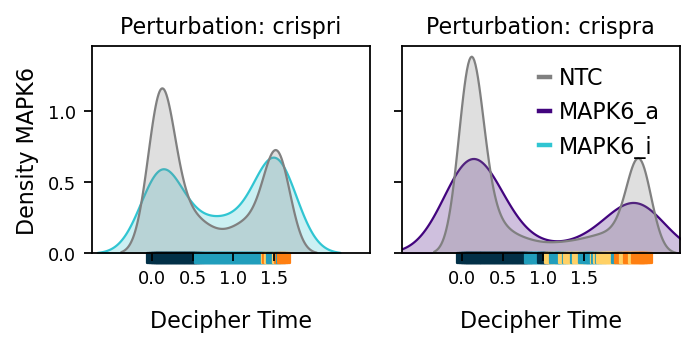

2025-12-08 00:21:40,827 | INFO : maxp pruned
2025-12-08 00:21:40,830 | INFO : cmap pruned
2025-12-08 00:21:40,831 | INFO : kern dropped
2025-12-08 00:21:40,831 | INFO : post pruned
2025-12-08 00:21:40,831 | INFO : FFTM dropped
2025-12-08 00:21:40,832 | INFO : GPOS pruned
2025-12-08 00:21:40,833 | INFO : GSUB pruned
2025-12-08 00:21:40,836 | INFO : glyf pruned
2025-12-08 00:21:40,837 | INFO : Added gid0 to subset
2025-12-08 00:21:40,837 | INFO : Added first four glyphs to subset
2025-12-08 00:21:40,837 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:40,837 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'R', 'T', 'Y', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:40,838 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 29, 38, 39, 46, 49, 51, 53, 55, 60, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:40,852 | INFO : GPOS subsetted
2025-12-08 00:21:40,853 | INFO : GSUB subsetted
2025-12-08 00:21:40,853 | INFO : name subsetting not needed
2025-12-08 00:21:40,853 | INFO : glyf subsetted
2025-12-08 00:21:40,854 | INFO : head pruned
2025-12-08 00:21:40,854 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:40,854 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:40,854 | INFO : glyf pruned
2025-12-08 00:21:40,854 | INFO : GDEF pruned
2025-12-08 00:21:40,854 | INFO : GPOS pruned
2025-12-08 00:21:40,855 | INFO : GSUB pruned
2025-12-08 00:21:40,856 | INFO : name pruned


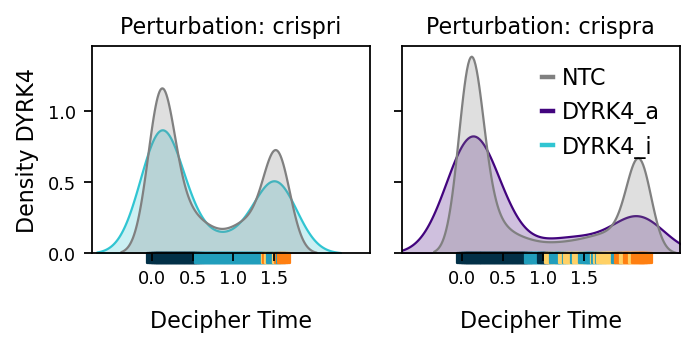

2025-12-08 00:21:41,140 | INFO : maxp pruned
2025-12-08 00:21:41,144 | INFO : cmap pruned
2025-12-08 00:21:41,144 | INFO : kern dropped
2025-12-08 00:21:41,144 | INFO : post pruned
2025-12-08 00:21:41,144 | INFO : FFTM dropped
2025-12-08 00:21:41,145 | INFO : GPOS pruned
2025-12-08 00:21:41,147 | INFO : GSUB pruned
2025-12-08 00:21:41,150 | INFO : glyf pruned
2025-12-08 00:21:41,150 | INFO : Added gid0 to subset
2025-12-08 00:21:41,150 | INFO : Added first four glyphs to subset
2025-12-08 00:21:41,150 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:41,150 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'F', 'L', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:41,151 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 29, 38, 39, 41, 47, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


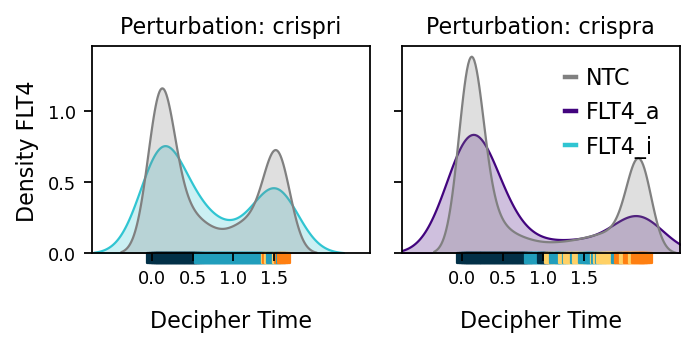

2025-12-08 00:21:41,452 | INFO : maxp pruned
2025-12-08 00:21:41,456 | INFO : cmap pruned
2025-12-08 00:21:41,456 | INFO : kern dropped
2025-12-08 00:21:41,456 | INFO : post pruned
2025-12-08 00:21:41,456 | INFO : FFTM dropped
2025-12-08 00:21:41,457 | INFO : GPOS pruned
2025-12-08 00:21:41,459 | INFO : GSUB pruned
2025-12-08 00:21:41,462 | INFO : glyf pruned
2025-12-08 00:21:41,463 | INFO : Added gid0 to subset
2025-12-08 00:21:41,463 | INFO : Added first four glyphs to subset
2025-12-08 00:21:41,463 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:41,463 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'M', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:41,463 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 29, 36, 38, 39, 48, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:41,767 | INFO : hmtx subsetted
2025-12-08 00:21:41,768 | INFO : cmap subsetted
2025-12-08 00:21:41,769 | INFO : fpgm subsetting not needed
2025-12-08 00:21:41,769 | INFO : prep subsetting not needed
2025-12-08 00:21:41,769 | INFO : cvt  subsetting not needed
2025-12-08 00:21:41,769 | INFO : loca subsetting not needed
2025-12-08 00:21:41,770 | INFO : post subsetted
2025-12-08 00:21:41,770 | INFO : gasp subsetting not needed
2025-12-08 00:21:41,770 | INFO : MATH subsetted
2025-12-08 00:21:41,771 | INFO : GDEF subsetted
2025-12-08 00:21:41,777 | INFO : GPOS subsetted
2025-12-08 00:21:41,778 | INFO : GSUB subsetted
2025-12-08 00:21:41,778 | INFO : name subsetting not needed
2025-12-08 00:21:41,779 | INFO : glyf subsetted
2025-12-08 00:21:41,780 | INFO : head pruned
2025-12-08 00:21:41,780 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:41,780 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:41,780 | INFO : glyf pruned
2025-12-08 00:21:41,780 | INFO : GD

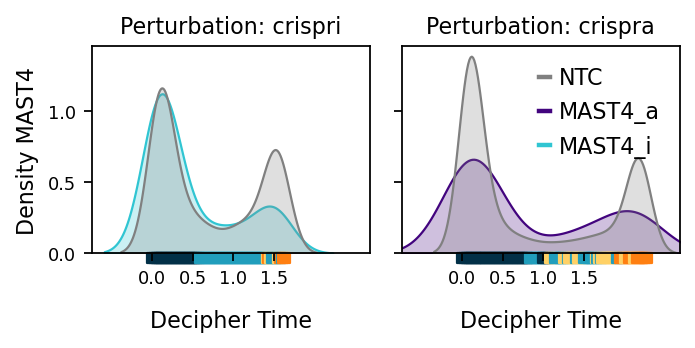

2025-12-08 00:21:42,029 | INFO : maxp pruned
2025-12-08 00:21:42,033 | INFO : cmap pruned
2025-12-08 00:21:42,033 | INFO : kern dropped
2025-12-08 00:21:42,033 | INFO : post pruned
2025-12-08 00:21:42,034 | INFO : FFTM dropped
2025-12-08 00:21:42,034 | INFO : GPOS pruned
2025-12-08 00:21:42,036 | INFO : GSUB pruned
2025-12-08 00:21:42,039 | INFO : glyf pruned
2025-12-08 00:21:42,039 | INFO : Added gid0 to subset
2025-12-08 00:21:42,039 | INFO : Added first four glyphs to subset
2025-12-08 00:21:42,039 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:42,040 | INFO : Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'N', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:42,040 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 37, 38, 39, 44, 49, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


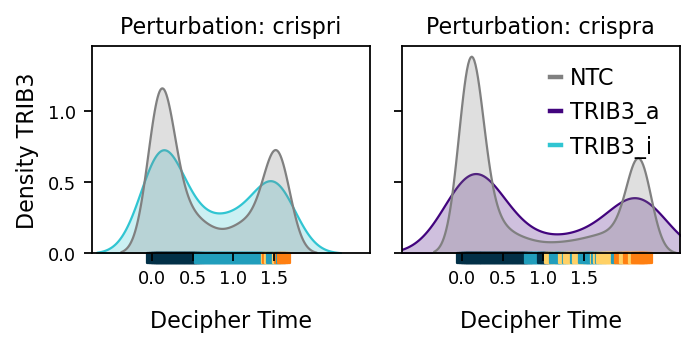

2025-12-08 00:21:42,321 | INFO : maxp pruned
2025-12-08 00:21:42,325 | INFO : cmap pruned
2025-12-08 00:21:42,325 | INFO : kern dropped
2025-12-08 00:21:42,326 | INFO : post pruned
2025-12-08 00:21:42,326 | INFO : FFTM dropped
2025-12-08 00:21:42,327 | INFO : GPOS pruned
2025-12-08 00:21:42,328 | INFO : GSUB pruned
2025-12-08 00:21:42,331 | INFO : glyf pruned
2025-12-08 00:21:42,331 | INFO : Added gid0 to subset
2025-12-08 00:21:42,331 | INFO : Added first four glyphs to subset
2025-12-08 00:21:42,332 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:42,332 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:42,332 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 29, 38, 39, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87,

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


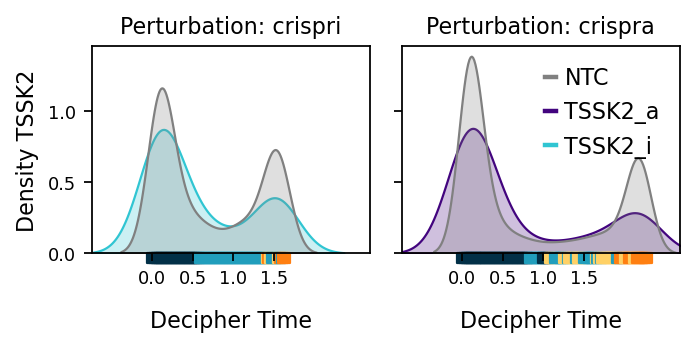

2025-12-08 00:21:42,601 | INFO : maxp pruned
2025-12-08 00:21:42,605 | INFO : cmap pruned
2025-12-08 00:21:42,605 | INFO : kern dropped
2025-12-08 00:21:42,605 | INFO : post pruned
2025-12-08 00:21:42,606 | INFO : FFTM dropped
2025-12-08 00:21:42,606 | INFO : GPOS pruned
2025-12-08 00:21:42,608 | INFO : GSUB pruned
2025-12-08 00:21:42,610 | INFO : glyf pruned
2025-12-08 00:21:42,611 | INFO : Added gid0 to subset
2025-12-08 00:21:42,611 | INFO : Added first four glyphs to subset
2025-12-08 00:21:42,611 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:42,611 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'R', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:42,612 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 38, 39, 46, 49, 51, 53, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


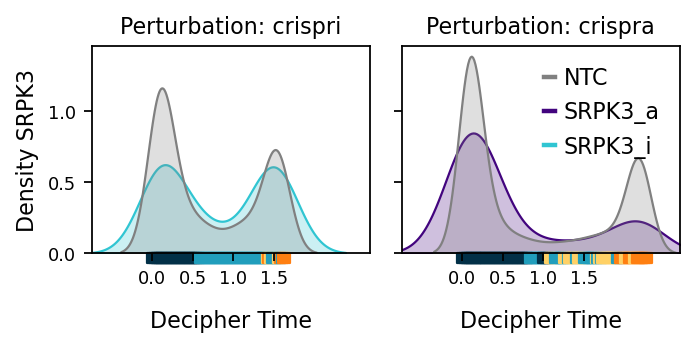

2025-12-08 00:21:42,881 | INFO : maxp pruned
2025-12-08 00:21:42,884 | INFO : cmap pruned
2025-12-08 00:21:42,885 | INFO : kern dropped
2025-12-08 00:21:42,885 | INFO : post pruned
2025-12-08 00:21:42,885 | INFO : FFTM dropped
2025-12-08 00:21:42,886 | INFO : GPOS pruned
2025-12-08 00:21:42,887 | INFO : GSUB pruned
2025-12-08 00:21:42,889 | INFO : glyf pruned
2025-12-08 00:21:42,890 | INFO : Added gid0 to subset
2025-12-08 00:21:42,890 | INFO : Added first four glyphs to subset
2025-12-08 00:21:42,890 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:42,890 | INFO : Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:42,891 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 37, 38, 39, 44, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


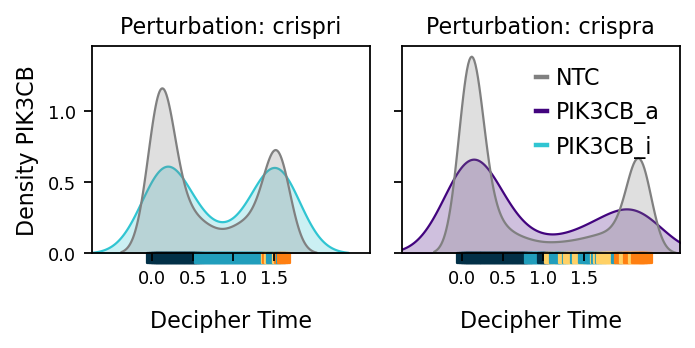

2025-12-08 00:21:43,161 | INFO : maxp pruned
2025-12-08 00:21:43,165 | INFO : cmap pruned
2025-12-08 00:21:43,165 | INFO : kern dropped
2025-12-08 00:21:43,165 | INFO : post pruned
2025-12-08 00:21:43,165 | INFO : FFTM dropped
2025-12-08 00:21:43,166 | INFO : GPOS pruned
2025-12-08 00:21:43,167 | INFO : GSUB pruned
2025-12-08 00:21:43,170 | INFO : glyf pruned
2025-12-08 00:21:43,171 | INFO : Added gid0 to subset
2025-12-08 00:21:43,171 | INFO : Added first four glyphs to subset
2025-12-08 00:21:43,171 | INFO : Closing glyph list over 'GSUB': 31 glyphs before
2025-12-08 00:21:43,171 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:43,172 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 26, 29, 38, 39, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
2025-12

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


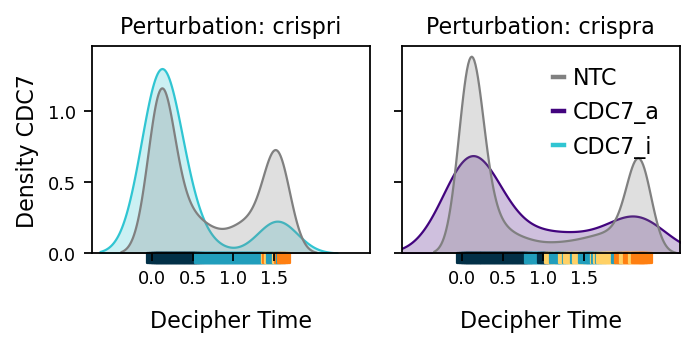

2025-12-08 00:21:43,439 | INFO : maxp pruned
2025-12-08 00:21:43,443 | INFO : cmap pruned
2025-12-08 00:21:43,443 | INFO : kern dropped
2025-12-08 00:21:43,444 | INFO : post pruned
2025-12-08 00:21:43,444 | INFO : FFTM dropped
2025-12-08 00:21:43,445 | INFO : GPOS pruned
2025-12-08 00:21:43,446 | INFO : GSUB pruned
2025-12-08 00:21:43,449 | INFO : glyf pruned
2025-12-08 00:21:43,449 | INFO : Added gid0 to subset
2025-12-08 00:21:43,449 | INFO : Added first four glyphs to subset
2025-12-08 00:21:43,450 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:43,450 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'E', 'H', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:43,450 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 29, 36, 38, 39, 40, 43, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


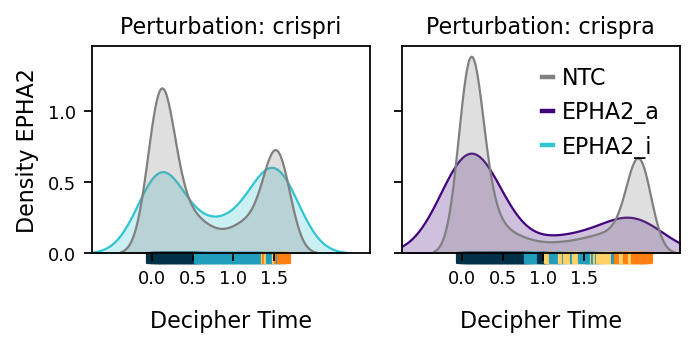

2025-12-08 00:21:43,759 | INFO : maxp pruned
2025-12-08 00:21:43,764 | INFO : cmap pruned
2025-12-08 00:21:43,764 | INFO : kern dropped
2025-12-08 00:21:43,764 | INFO : post pruned
2025-12-08 00:21:43,764 | INFO : FFTM dropped
2025-12-08 00:21:43,765 | INFO : GPOS pruned
2025-12-08 00:21:43,766 | INFO : GSUB pruned
2025-12-08 00:21:43,769 | INFO : glyf pruned
2025-12-08 00:21:43,769 | INFO : Added gid0 to subset
2025-12-08 00:21:43,769 | INFO : Added first four glyphs to subset
2025-12-08 00:21:43,769 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:43,769 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:43,770 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:43,787 | INFO : GPOS subsetted
2025-12-08 00:21:43,788 | INFO : GSUB subsetted
2025-12-08 00:21:43,788 | INFO : name subsetting not needed
2025-12-08 00:21:43,788 | INFO : glyf subsetted
2025-12-08 00:21:43,789 | INFO : head pruned
2025-12-08 00:21:43,789 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:43,789 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:43,789 | INFO : glyf pruned
2025-12-08 00:21:43,789 | INFO : GDEF pruned
2025-12-08 00:21:43,790 | INFO : GPOS pruned
2025-12-08 00:21:43,790 | INFO : GSUB pruned
2025-12-08 00:21:43,792 | INFO : name pruned


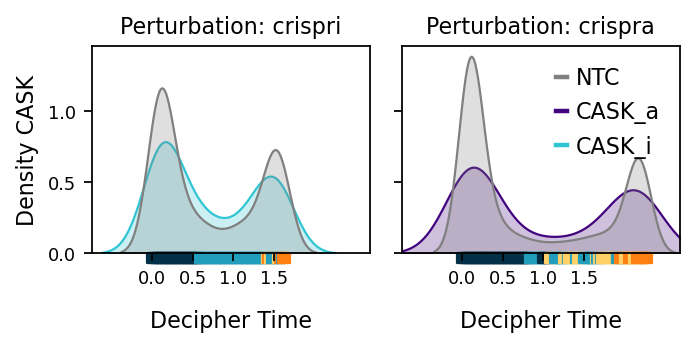

2025-12-08 00:21:44,050 | INFO : maxp pruned
2025-12-08 00:21:44,054 | INFO : cmap pruned
2025-12-08 00:21:44,054 | INFO : kern dropped
2025-12-08 00:21:44,054 | INFO : post pruned
2025-12-08 00:21:44,054 | INFO : FFTM dropped
2025-12-08 00:21:44,055 | INFO : GPOS pruned
2025-12-08 00:21:44,057 | INFO : GSUB pruned
2025-12-08 00:21:44,060 | INFO : glyf pruned
2025-12-08 00:21:44,061 | INFO : Added gid0 to subset
2025-12-08 00:21:44,061 | INFO : Added first four glyphs to subset
2025-12-08 00:21:44,061 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2025-12-08 00:21:44,061 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'I', 'K', 'N', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:44,062 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 36, 38, 39, 44, 46, 49, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81,

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


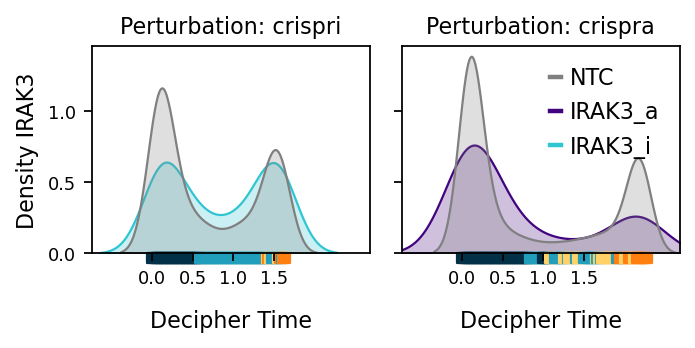

2025-12-08 00:21:44,335 | INFO : maxp pruned
2025-12-08 00:21:44,339 | INFO : cmap pruned
2025-12-08 00:21:44,339 | INFO : kern dropped
2025-12-08 00:21:44,340 | INFO : post pruned
2025-12-08 00:21:44,340 | INFO : FFTM dropped
2025-12-08 00:21:44,341 | INFO : GPOS pruned
2025-12-08 00:21:44,342 | INFO : GSUB pruned
2025-12-08 00:21:44,345 | INFO : glyf pruned
2025-12-08 00:21:44,345 | INFO : Added gid0 to subset
2025-12-08 00:21:44,346 | INFO : Added first four glyphs to subset
2025-12-08 00:21:44,346 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:44,346 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'I', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:44,347 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 38, 39, 44, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


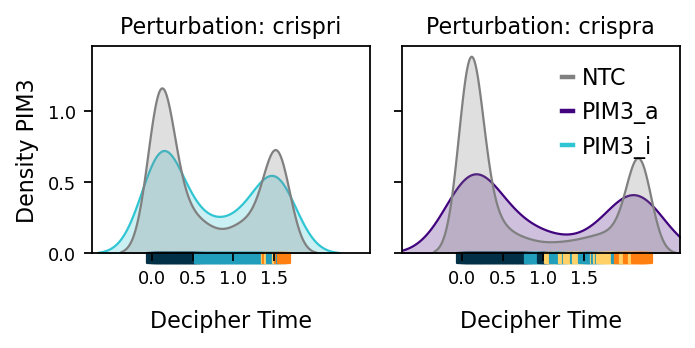

2025-12-08 00:21:44,620 | INFO : maxp pruned
2025-12-08 00:21:44,624 | INFO : cmap pruned
2025-12-08 00:21:44,624 | INFO : kern dropped
2025-12-08 00:21:44,624 | INFO : post pruned
2025-12-08 00:21:44,625 | INFO : FFTM dropped
2025-12-08 00:21:44,625 | INFO : GPOS pruned
2025-12-08 00:21:44,627 | INFO : GSUB pruned
2025-12-08 00:21:44,629 | INFO : glyf pruned
2025-12-08 00:21:44,630 | INFO : Added gid0 to subset
2025-12-08 00:21:44,630 | INFO : Added first four glyphs to subset
2025-12-08 00:21:44,630 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:44,630 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'I', 'K', 'N', 'O', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:44,631 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 44, 46, 49, 50, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:44,930 | INFO : hmtx subsetted
2025-12-08 00:21:44,932 | INFO : cmap subsetted
2025-12-08 00:21:44,932 | INFO : fpgm subsetting not needed
2025-12-08 00:21:44,932 | INFO : prep subsetting not needed
2025-12-08 00:21:44,932 | INFO : cvt  subsetting not needed
2025-12-08 00:21:44,932 | INFO : loca subsetting not needed
2025-12-08 00:21:44,933 | INFO : post subsetted
2025-12-08 00:21:44,933 | INFO : gasp subsetting not needed
2025-12-08 00:21:44,933 | INFO : MATH subsetted
2025-12-08 00:21:44,934 | INFO : GDEF subsetted
2025-12-08 00:21:44,941 | INFO : GPOS subsetted
2025-12-08 00:21:44,941 | INFO : GSUB subsetted
2025-12-08 00:21:44,941 | INFO : name subsetting not needed
2025-12-08 00:21:44,942 | INFO : glyf subsetted
2025-12-08 00:21:44,943 | INFO : head pruned
2025-12-08 00:21:44,943 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:44,943 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:44,943 | INFO : glyf pruned
2025-12-08 00:21:44,944 | INFO : GD

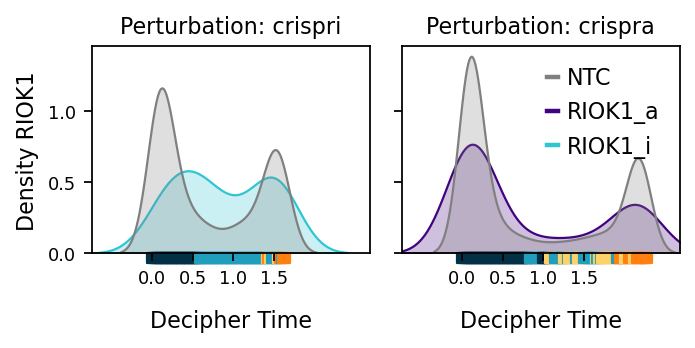

2025-12-08 00:21:45,237 | INFO : maxp pruned
2025-12-08 00:21:45,240 | INFO : cmap pruned
2025-12-08 00:21:45,241 | INFO : kern dropped
2025-12-08 00:21:45,241 | INFO : post pruned
2025-12-08 00:21:45,241 | INFO : FFTM dropped
2025-12-08 00:21:45,242 | INFO : GPOS pruned
2025-12-08 00:21:45,244 | INFO : GSUB pruned
2025-12-08 00:21:45,246 | INFO : glyf pruned
2025-12-08 00:21:45,247 | INFO : Added gid0 to subset
2025-12-08 00:21:45,247 | INFO : Added first four glyphs to subset
2025-12-08 00:21:45,247 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2025-12-08 00:21:45,247 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'I', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:45,247 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 44, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:45,263 | INFO : GPOS subsetted
2025-12-08 00:21:45,263 | INFO : GSUB subsetted
2025-12-08 00:21:45,263 | INFO : name subsetting not needed
2025-12-08 00:21:45,264 | INFO : glyf subsetted
2025-12-08 00:21:45,264 | INFO : head pruned
2025-12-08 00:21:45,264 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:45,264 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:45,265 | INFO : glyf pruned
2025-12-08 00:21:45,265 | INFO : GDEF pruned
2025-12-08 00:21:45,265 | INFO : GPOS pruned
2025-12-08 00:21:45,265 | INFO : GSUB pruned
2025-12-08 00:21:45,266 | INFO : name pruned


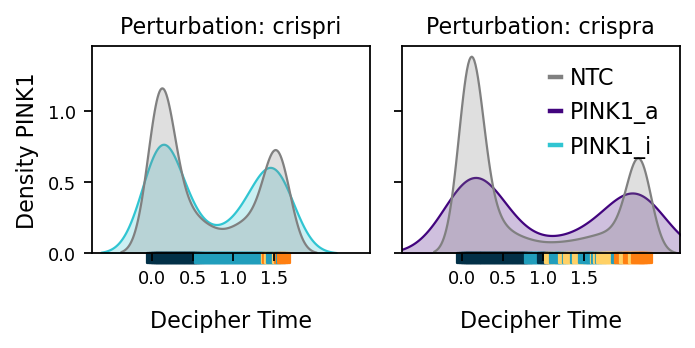

2025-12-08 00:21:45,518 | INFO : maxp pruned
2025-12-08 00:21:45,521 | INFO : cmap pruned
2025-12-08 00:21:45,522 | INFO : kern dropped
2025-12-08 00:21:45,522 | INFO : post pruned
2025-12-08 00:21:45,522 | INFO : FFTM dropped
2025-12-08 00:21:45,523 | INFO : GPOS pruned
2025-12-08 00:21:45,524 | INFO : GSUB pruned
2025-12-08 00:21:45,527 | INFO : glyf pruned
2025-12-08 00:21:45,527 | INFO : Added gid0 to subset
2025-12-08 00:21:45,528 | INFO : Added first four glyphs to subset
2025-12-08 00:21:45,528 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2025-12-08 00:21:45,528 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'N', 'P', 'R', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:45,528 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 25, 29, 36, 38, 39, 46, 49, 51, 53, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


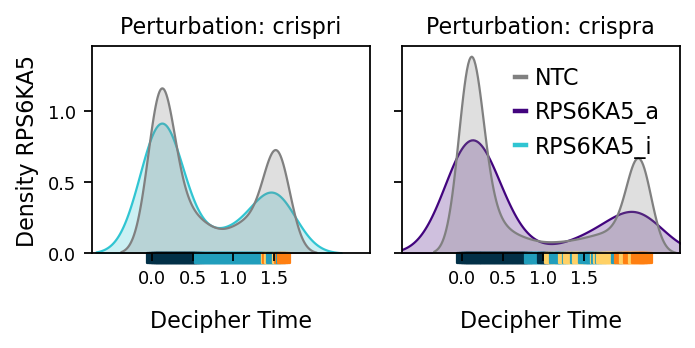

2025-12-08 00:21:45,822 | INFO : maxp pruned
2025-12-08 00:21:45,826 | INFO : cmap pruned
2025-12-08 00:21:45,826 | INFO : kern dropped
2025-12-08 00:21:45,826 | INFO : post pruned
2025-12-08 00:21:45,826 | INFO : FFTM dropped
2025-12-08 00:21:45,827 | INFO : GPOS pruned
2025-12-08 00:21:45,828 | INFO : GSUB pruned
2025-12-08 00:21:45,832 | INFO : glyf pruned
2025-12-08 00:21:45,832 | INFO : Added gid0 to subset
2025-12-08 00:21:45,832 | INFO : Added first four glyphs to subset
2025-12-08 00:21:45,832 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:45,832 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'L', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:45,833 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 38, 39, 46, 47, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


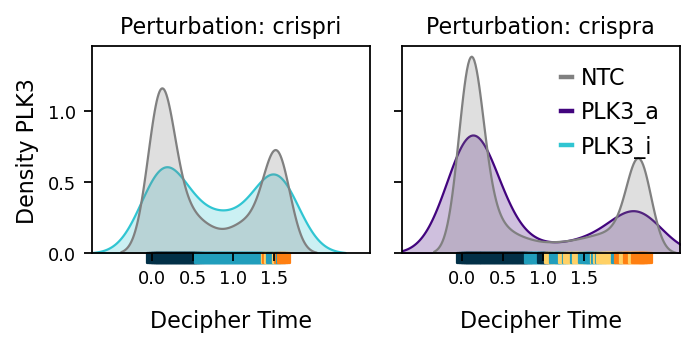

2025-12-08 00:21:46,135 | INFO : maxp pruned
2025-12-08 00:21:46,139 | INFO : cmap pruned
2025-12-08 00:21:46,139 | INFO : kern dropped
2025-12-08 00:21:46,139 | INFO : post pruned
2025-12-08 00:21:46,139 | INFO : FFTM dropped
2025-12-08 00:21:46,140 | INFO : GPOS pruned
2025-12-08 00:21:46,142 | INFO : GSUB pruned
2025-12-08 00:21:46,145 | INFO : glyf pruned
2025-12-08 00:21:46,145 | INFO : Added gid0 to subset
2025-12-08 00:21:46,145 | INFO : Added first four glyphs to subset
2025-12-08 00:21:46,145 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:46,146 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:46,147 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 29, 36, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


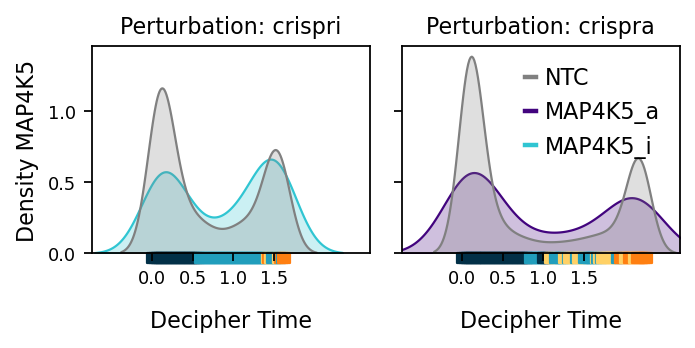

2025-12-08 00:21:46,466 | INFO : maxp pruned
2025-12-08 00:21:46,470 | INFO : cmap pruned
2025-12-08 00:21:46,470 | INFO : kern dropped
2025-12-08 00:21:46,470 | INFO : post pruned
2025-12-08 00:21:46,470 | INFO : FFTM dropped
2025-12-08 00:21:46,471 | INFO : GPOS pruned
2025-12-08 00:21:46,472 | INFO : GSUB pruned
2025-12-08 00:21:46,475 | INFO : glyf pruned
2025-12-08 00:21:46,475 | INFO : Added gid0 to subset
2025-12-08 00:21:46,476 | INFO : Added first four glyphs to subset
2025-12-08 00:21:46,476 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:46,476 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:46,476 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:46,484 | INFO : MATH subsetted
2025-12-08 00:21:46,485 | INFO : GDEF subsetted
2025-12-08 00:21:46,491 | INFO : GPOS subsetted
2025-12-08 00:21:46,492 | INFO : GSUB subsetted
2025-12-08 00:21:46,492 | INFO : name subsetting not needed
2025-12-08 00:21:46,493 | INFO : glyf subsetted
2025-12-08 00:21:46,493 | INFO : head pruned
2025-12-08 00:21:46,493 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:46,493 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:46,493 | INFO : glyf pruned
2025-12-08 00:21:46,494 | INFO : GDEF pruned
2025-12-08 00:21:46,494 | INFO : GPOS pruned
2025-12-08 00:21:46,494 | INFO : GSUB pruned
2025-12-08 00:21:46,496 | INFO : name pruned


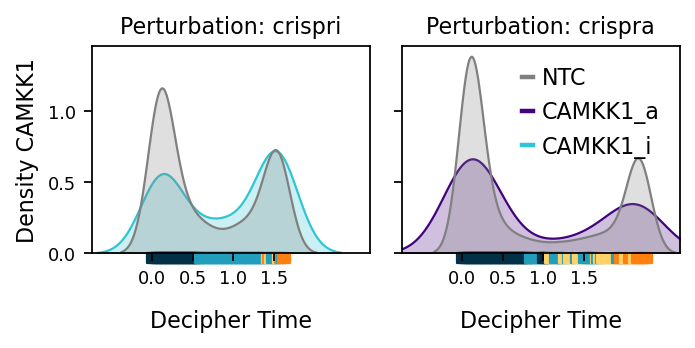

2025-12-08 00:21:46,781 | INFO : maxp pruned
2025-12-08 00:21:46,785 | INFO : cmap pruned
2025-12-08 00:21:46,785 | INFO : kern dropped
2025-12-08 00:21:46,786 | INFO : post pruned
2025-12-08 00:21:46,786 | INFO : FFTM dropped
2025-12-08 00:21:46,787 | INFO : GPOS pruned
2025-12-08 00:21:46,789 | INFO : GSUB pruned
2025-12-08 00:21:46,791 | INFO : glyf pruned
2025-12-08 00:21:46,792 | INFO : Added gid0 to subset
2025-12-08 00:21:46,792 | INFO : Added first four glyphs to subset
2025-12-08 00:21:46,792 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2025-12-08 00:21:46,792 | INFO : Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'K', 'N', 'P', 'R', 'T', 'U', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:46,793 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 37, 38, 39, 46, 49, 51, 53, 55, 56, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82,

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


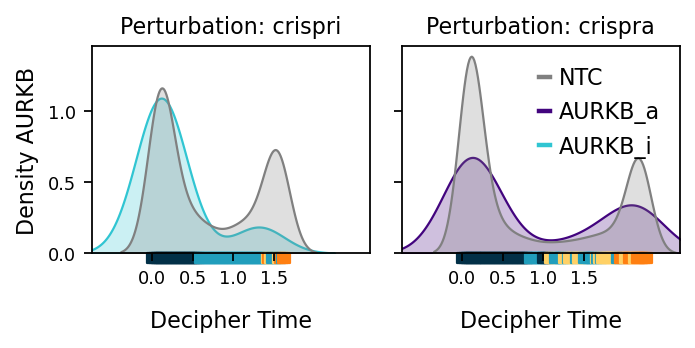

2025-12-08 00:21:47,099 | INFO : maxp pruned
2025-12-08 00:21:47,103 | INFO : cmap pruned
2025-12-08 00:21:47,103 | INFO : kern dropped
2025-12-08 00:21:47,104 | INFO : post pruned
2025-12-08 00:21:47,104 | INFO : FFTM dropped
2025-12-08 00:21:47,105 | INFO : GPOS pruned
2025-12-08 00:21:47,106 | INFO : GSUB pruned
2025-12-08 00:21:47,109 | INFO : glyf pruned
2025-12-08 00:21:47,109 | INFO : Added gid0 to subset
2025-12-08 00:21:47,110 | INFO : Added first four glyphs to subset
2025-12-08 00:21:47,110 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:47,110 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:47,110 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 29, 36, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


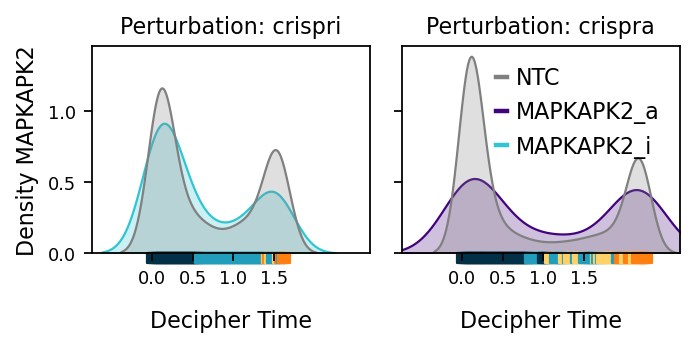

2025-12-08 00:21:47,380 | INFO : maxp pruned
2025-12-08 00:21:47,384 | INFO : cmap pruned
2025-12-08 00:21:47,384 | INFO : kern dropped
2025-12-08 00:21:47,384 | INFO : post pruned
2025-12-08 00:21:47,384 | INFO : FFTM dropped
2025-12-08 00:21:47,385 | INFO : GPOS pruned
2025-12-08 00:21:47,386 | INFO : GSUB pruned
2025-12-08 00:21:47,389 | INFO : glyf pruned
2025-12-08 00:21:47,389 | INFO : Added gid0 to subset
2025-12-08 00:21:47,389 | INFO : Added first four glyphs to subset
2025-12-08 00:21:47,389 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2025-12-08 00:21:47,389 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:47,390 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 28, 29, 36, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


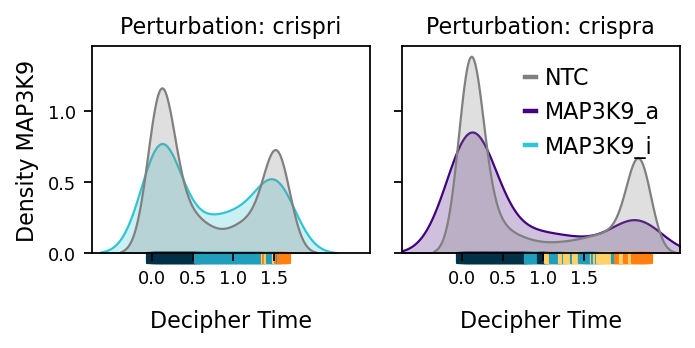

2025-12-08 00:21:47,671 | INFO : maxp pruned
2025-12-08 00:21:47,675 | INFO : cmap pruned
2025-12-08 00:21:47,675 | INFO : kern dropped
2025-12-08 00:21:47,675 | INFO : post pruned
2025-12-08 00:21:47,675 | INFO : FFTM dropped
2025-12-08 00:21:47,676 | INFO : GPOS pruned
2025-12-08 00:21:47,678 | INFO : GSUB pruned
2025-12-08 00:21:47,681 | INFO : glyf pruned
2025-12-08 00:21:47,681 | INFO : Added gid0 to subset
2025-12-08 00:21:47,681 | INFO : Added first four glyphs to subset
2025-12-08 00:21:47,681 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:47,681 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'L', 'M', 'N', 'P', 'T', 'Y', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:47,682 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 46, 47, 48, 49, 51, 55, 60, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


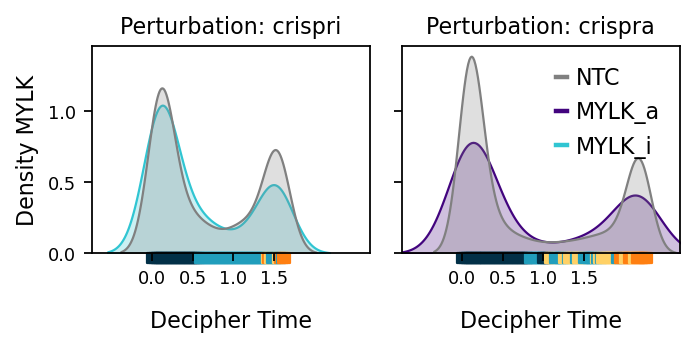

2025-12-08 00:21:47,985 | INFO : maxp pruned
2025-12-08 00:21:47,989 | INFO : cmap pruned
2025-12-08 00:21:47,989 | INFO : kern dropped
2025-12-08 00:21:47,990 | INFO : post pruned
2025-12-08 00:21:47,990 | INFO : FFTM dropped
2025-12-08 00:21:47,990 | INFO : GPOS pruned
2025-12-08 00:21:47,992 | INFO : GSUB pruned
2025-12-08 00:21:47,995 | INFO : glyf pruned
2025-12-08 00:21:47,995 | INFO : Added gid0 to subset
2025-12-08 00:21:47,995 | INFO : Added first four glyphs to subset
2025-12-08 00:21:47,996 | INFO : Closing glyph list over 'GSUB': 35 glyphs before
2025-12-08 00:21:47,996 | INFO : Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'two', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:47,996 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 24, 29, 37, 38, 39, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:48,320 | INFO : GPOS subsetted
2025-12-08 00:21:48,320 | INFO : GSUB subsetted
2025-12-08 00:21:48,321 | INFO : name subsetting not needed
2025-12-08 00:21:48,322 | INFO : glyf subsetted
2025-12-08 00:21:48,322 | INFO : head pruned
2025-12-08 00:21:48,323 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:48,323 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:48,323 | INFO : glyf pruned
2025-12-08 00:21:48,323 | INFO : GDEF pruned
2025-12-08 00:21:48,323 | INFO : GPOS pruned
2025-12-08 00:21:48,323 | INFO : GSUB pruned
2025-12-08 00:21:48,325 | INFO : name pruned


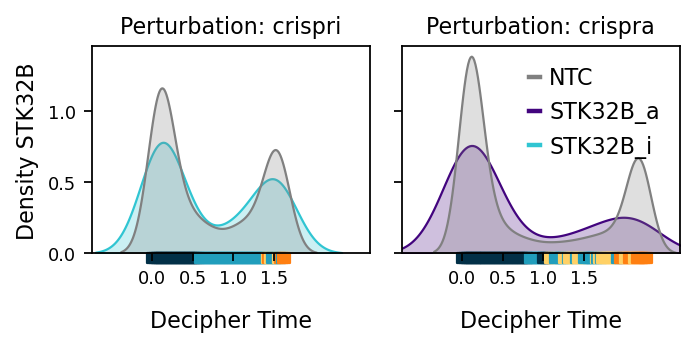

2025-12-08 00:21:48,624 | INFO : maxp pruned
2025-12-08 00:21:48,627 | INFO : cmap pruned
2025-12-08 00:21:48,628 | INFO : kern dropped
2025-12-08 00:21:48,628 | INFO : post pruned
2025-12-08 00:21:48,628 | INFO : FFTM dropped
2025-12-08 00:21:48,628 | INFO : GPOS pruned
2025-12-08 00:21:48,630 | INFO : GSUB pruned
2025-12-08 00:21:48,633 | INFO : glyf pruned
2025-12-08 00:21:48,633 | INFO : Added gid0 to subset
2025-12-08 00:21:48,633 | INFO : Added first four glyphs to subset
2025-12-08 00:21:48,633 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:48,633 | INFO : Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:48,634 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 26, 29, 37, 38, 39, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:48,648 | INFO : GPOS subsetted
2025-12-08 00:21:48,649 | INFO : GSUB subsetted
2025-12-08 00:21:48,649 | INFO : name subsetting not needed
2025-12-08 00:21:48,649 | INFO : glyf subsetted
2025-12-08 00:21:48,650 | INFO : head pruned
2025-12-08 00:21:48,650 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:48,650 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:48,650 | INFO : glyf pruned
2025-12-08 00:21:48,650 | INFO : GDEF pruned
2025-12-08 00:21:48,650 | INFO : GPOS pruned
2025-12-08 00:21:48,651 | INFO : GSUB pruned
2025-12-08 00:21:48,652 | INFO : name pruned


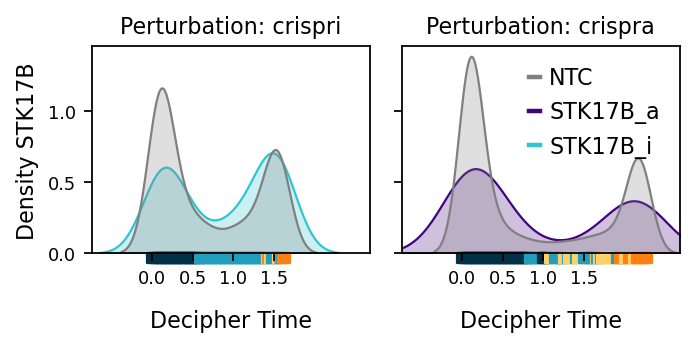

2025-12-08 00:21:48,908 | INFO : maxp pruned
2025-12-08 00:21:48,912 | INFO : cmap pruned
2025-12-08 00:21:48,913 | INFO : kern dropped
2025-12-08 00:21:48,913 | INFO : post pruned
2025-12-08 00:21:48,913 | INFO : FFTM dropped
2025-12-08 00:21:48,914 | INFO : GPOS pruned
2025-12-08 00:21:48,915 | INFO : GSUB pruned
2025-12-08 00:21:48,918 | INFO : glyf pruned
2025-12-08 00:21:48,919 | INFO : Added gid0 to subset
2025-12-08 00:21:48,919 | INFO : Added first four glyphs to subset
2025-12-08 00:21:48,919 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2025-12-08 00:21:48,919 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'three', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:48,920 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 22, 24, 29, 38, 39, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


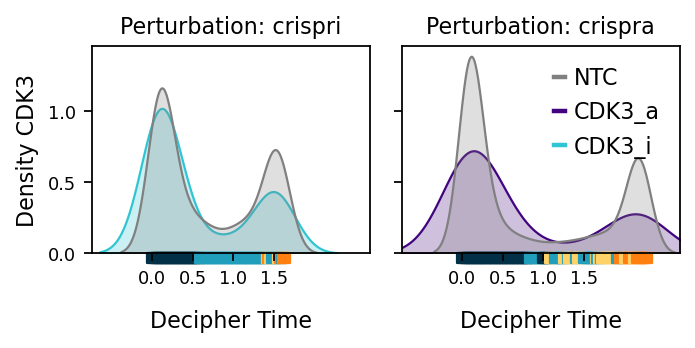

2025-12-08 00:21:49,195 | INFO : maxp pruned
2025-12-08 00:21:49,199 | INFO : cmap pruned
2025-12-08 00:21:49,199 | INFO : kern dropped
2025-12-08 00:21:49,199 | INFO : post pruned
2025-12-08 00:21:49,200 | INFO : FFTM dropped
2025-12-08 00:21:49,200 | INFO : GPOS pruned
2025-12-08 00:21:49,202 | INFO : GSUB pruned
2025-12-08 00:21:49,205 | INFO : glyf pruned
2025-12-08 00:21:49,205 | INFO : Added gid0 to subset
2025-12-08 00:21:49,205 | INFO : Added first four glyphs to subset
2025-12-08 00:21:49,205 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:49,205 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'I', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:49,206 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 44, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


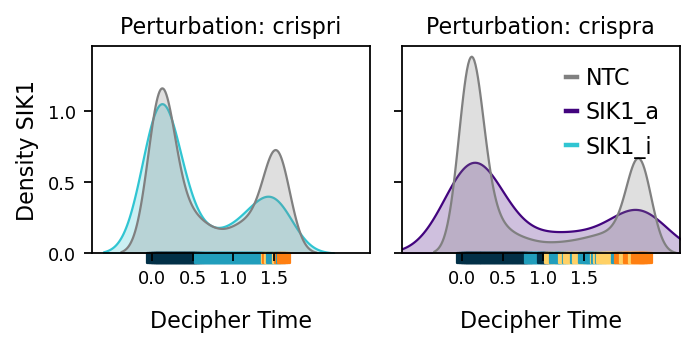

2025-12-08 00:21:49,519 | INFO : maxp pruned
2025-12-08 00:21:49,523 | INFO : cmap pruned
2025-12-08 00:21:49,523 | INFO : kern dropped
2025-12-08 00:21:49,523 | INFO : post pruned
2025-12-08 00:21:49,524 | INFO : FFTM dropped
2025-12-08 00:21:49,524 | INFO : GPOS pruned
2025-12-08 00:21:49,525 | INFO : GSUB pruned
2025-12-08 00:21:49,528 | INFO : glyf pruned
2025-12-08 00:21:49,529 | INFO : Added gid0 to subset
2025-12-08 00:21:49,529 | INFO : Added first four glyphs to subset
2025-12-08 00:21:49,529 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2025-12-08 00:21:49,529 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:49,530 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:49,536 | INFO : fpgm subsetting not needed
2025-12-08 00:21:49,536 | INFO : prep subsetting not needed
2025-12-08 00:21:49,536 | INFO : cvt  subsetting not needed
2025-12-08 00:21:49,536 | INFO : loca subsetting not needed
2025-12-08 00:21:49,536 | INFO : post subsetted
2025-12-08 00:21:49,536 | INFO : gasp subsetting not needed
2025-12-08 00:21:49,536 | INFO : MATH subsetted
2025-12-08 00:21:49,537 | INFO : GDEF subsetted
2025-12-08 00:21:49,544 | INFO : GPOS subsetted
2025-12-08 00:21:49,544 | INFO : GSUB subsetted
2025-12-08 00:21:49,545 | INFO : name subsetting not needed
2025-12-08 00:21:49,545 | INFO : glyf subsetted
2025-12-08 00:21:49,545 | INFO : head pruned
2025-12-08 00:21:49,546 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:49,546 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:49,546 | INFO : glyf pruned
2025-12-08 00:21:49,546 | INFO : GDEF pruned
2025-12-08 00:21:49,546 | INFO : GPOS pruned
2025-12-08 00:21:49,546 | INFO : GSUB pru

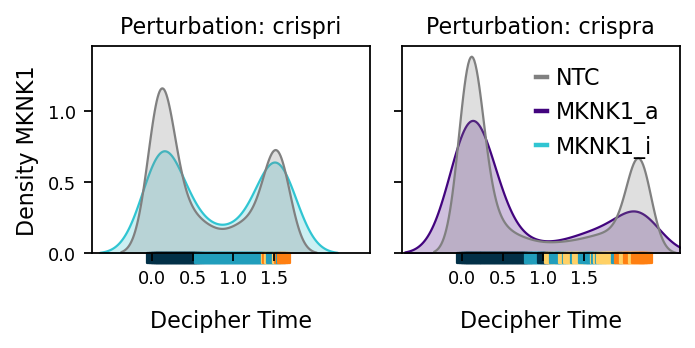

2025-12-08 00:21:49,845 | INFO : maxp pruned
2025-12-08 00:21:49,849 | INFO : cmap pruned
2025-12-08 00:21:49,849 | INFO : kern dropped
2025-12-08 00:21:49,849 | INFO : post pruned
2025-12-08 00:21:49,849 | INFO : FFTM dropped
2025-12-08 00:21:49,850 | INFO : GPOS pruned
2025-12-08 00:21:49,852 | INFO : GSUB pruned
2025-12-08 00:21:49,854 | INFO : glyf pruned
2025-12-08 00:21:49,855 | INFO : Added gid0 to subset
2025-12-08 00:21:49,855 | INFO : Added first four glyphs to subset
2025-12-08 00:21:49,855 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2025-12-08 00:21:49,856 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:49,856 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:49,866 | INFO : GDEF subsetted
2025-12-08 00:21:49,873 | INFO : GPOS subsetted
2025-12-08 00:21:49,874 | INFO : GSUB subsetted
2025-12-08 00:21:49,874 | INFO : name subsetting not needed
2025-12-08 00:21:49,874 | INFO : glyf subsetted
2025-12-08 00:21:49,875 | INFO : head pruned
2025-12-08 00:21:49,875 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:49,875 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:49,875 | INFO : glyf pruned
2025-12-08 00:21:49,875 | INFO : GDEF pruned
2025-12-08 00:21:49,875 | INFO : GPOS pruned
2025-12-08 00:21:49,876 | INFO : GSUB pruned
2025-12-08 00:21:49,877 | INFO : name pruned


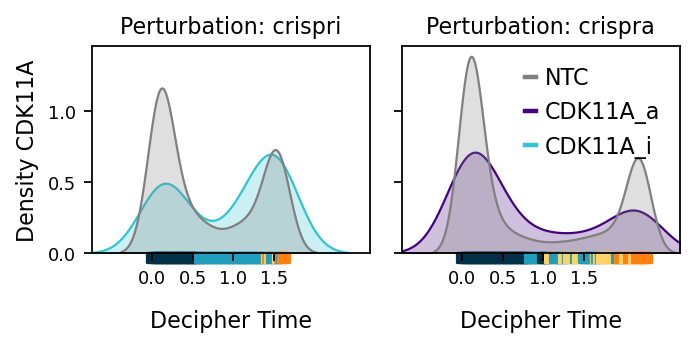

2025-12-08 00:21:50,168 | INFO : maxp pruned
2025-12-08 00:21:50,171 | INFO : cmap pruned
2025-12-08 00:21:50,172 | INFO : kern dropped
2025-12-08 00:21:50,172 | INFO : post pruned
2025-12-08 00:21:50,172 | INFO : FFTM dropped
2025-12-08 00:21:50,173 | INFO : GPOS pruned
2025-12-08 00:21:50,174 | INFO : GSUB pruned
2025-12-08 00:21:50,177 | INFO : glyf pruned
2025-12-08 00:21:50,178 | INFO : Added gid0 to subset
2025-12-08 00:21:50,178 | INFO : Added first four glyphs to subset
2025-12-08 00:21:50,178 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:50,178 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'N', 'P', 'R', 'T', 'U', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:50,178 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 46, 49, 51, 53, 55, 56, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:50,195 | INFO : head pruned
2025-12-08 00:21:50,195 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:50,195 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:50,195 | INFO : glyf pruned
2025-12-08 00:21:50,196 | INFO : GDEF pruned
2025-12-08 00:21:50,196 | INFO : GPOS pruned
2025-12-08 00:21:50,196 | INFO : GSUB pruned
2025-12-08 00:21:50,198 | INFO : name pruned


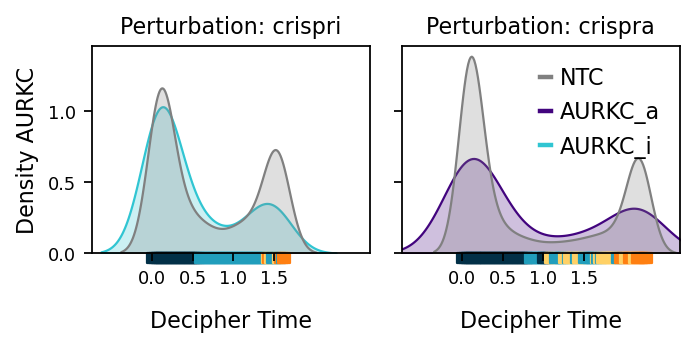

2025-12-08 00:21:50,452 | INFO : maxp pruned
2025-12-08 00:21:50,456 | INFO : cmap pruned
2025-12-08 00:21:50,456 | INFO : kern dropped
2025-12-08 00:21:50,456 | INFO : post pruned
2025-12-08 00:21:50,456 | INFO : FFTM dropped
2025-12-08 00:21:50,457 | INFO : GPOS pruned
2025-12-08 00:21:50,458 | INFO : GSUB pruned
2025-12-08 00:21:50,461 | INFO : glyf pruned
2025-12-08 00:21:50,462 | INFO : Added gid0 to subset
2025-12-08 00:21:50,462 | INFO : Added first four glyphs to subset
2025-12-08 00:21:50,462 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:50,462 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'F', 'G', 'I', 'N', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:50,463 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 41, 42, 44, 49, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


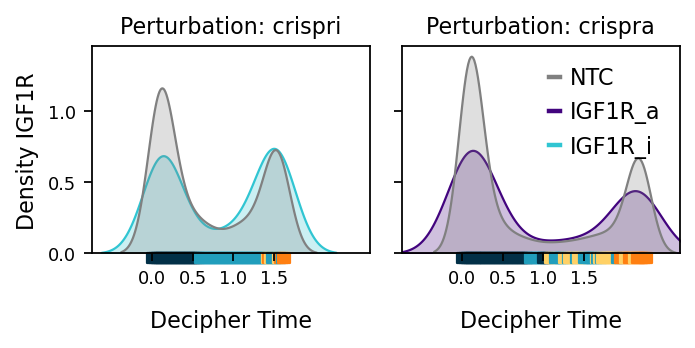

2025-12-08 00:21:50,779 | INFO : maxp pruned
2025-12-08 00:21:50,782 | INFO : cmap pruned
2025-12-08 00:21:50,783 | INFO : kern dropped
2025-12-08 00:21:50,783 | INFO : post pruned
2025-12-08 00:21:50,783 | INFO : FFTM dropped
2025-12-08 00:21:50,783 | INFO : GPOS pruned
2025-12-08 00:21:50,785 | INFO : GSUB pruned
2025-12-08 00:21:50,788 | INFO : glyf pruned
2025-12-08 00:21:50,788 | INFO : Added gid0 to subset
2025-12-08 00:21:50,789 | INFO : Added first four glyphs to subset
2025-12-08 00:21:50,789 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:50,789 | INFO : Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'G', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:50,789 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 23, 24, 29, 37, 38, 39, 42, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83,

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:50,804 | INFO : GSUB subsetted
2025-12-08 00:21:50,804 | INFO : name subsetting not needed
2025-12-08 00:21:50,805 | INFO : glyf subsetted
2025-12-08 00:21:50,805 | INFO : head pruned
2025-12-08 00:21:50,805 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:50,805 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:50,806 | INFO : glyf pruned
2025-12-08 00:21:50,806 | INFO : GDEF pruned
2025-12-08 00:21:50,806 | INFO : GPOS pruned
2025-12-08 00:21:50,806 | INFO : GSUB pruned
2025-12-08 00:21:50,808 | INFO : name pruned


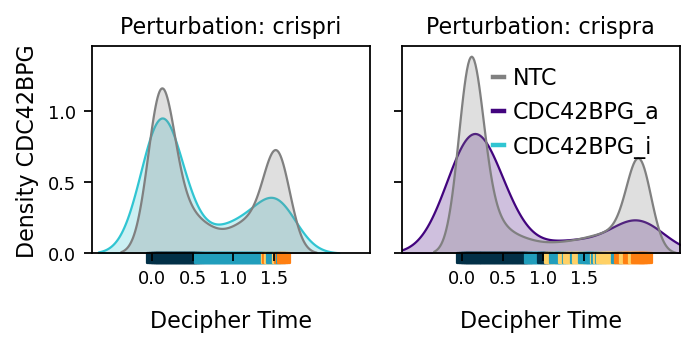

2025-12-08 00:21:51,092 | INFO : maxp pruned
2025-12-08 00:21:51,095 | INFO : cmap pruned
2025-12-08 00:21:51,096 | INFO : kern dropped
2025-12-08 00:21:51,096 | INFO : post pruned
2025-12-08 00:21:51,096 | INFO : FFTM dropped
2025-12-08 00:21:51,097 | INFO : GPOS pruned
2025-12-08 00:21:51,098 | INFO : GSUB pruned
2025-12-08 00:21:51,102 | INFO : glyf pruned
2025-12-08 00:21:51,102 | INFO : Added gid0 to subset
2025-12-08 00:21:51,102 | INFO : Added first four glyphs to subset
2025-12-08 00:21:51,102 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:51,102 | INFO : Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'N', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:51,103 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 29, 37, 38, 39, 49, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


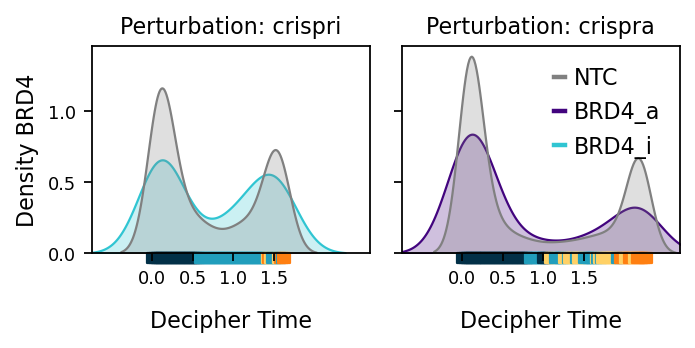

2025-12-08 00:21:51,417 | INFO : maxp pruned
2025-12-08 00:21:51,423 | INFO : cmap pruned
2025-12-08 00:21:51,423 | INFO : kern dropped
2025-12-08 00:21:51,423 | INFO : post pruned
2025-12-08 00:21:51,424 | INFO : FFTM dropped
2025-12-08 00:21:51,424 | INFO : GPOS pruned
2025-12-08 00:21:51,426 | INFO : GSUB pruned


Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:51,735 | INFO : glyf pruned
2025-12-08 00:21:51,736 | INFO : Added gid0 to subset
2025-12-08 00:21:51,736 | INFO : Added first four glyphs to subset
2025-12-08 00:21:51,736 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2025-12-08 00:21:51,736 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:51,737 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 29, 38, 39, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
2025-12-08 00:21:51,738 | INFO : Closed glyph list over 'GSUB': 32 glyphs after
2025-12-08 00:21:51,738 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 

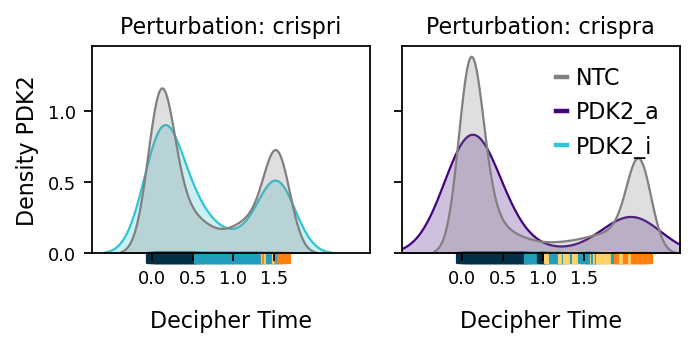

2025-12-08 00:21:52,028 | INFO : maxp pruned
2025-12-08 00:21:52,032 | INFO : cmap pruned
2025-12-08 00:21:52,032 | INFO : kern dropped
2025-12-08 00:21:52,033 | INFO : post pruned
2025-12-08 00:21:52,033 | INFO : FFTM dropped
2025-12-08 00:21:52,033 | INFO : GPOS pruned
2025-12-08 00:21:52,035 | INFO : GSUB pruned
2025-12-08 00:21:52,038 | INFO : glyf pruned
2025-12-08 00:21:52,038 | INFO : Added gid0 to subset
2025-12-08 00:21:52,039 | INFO : Added first four glyphs to subset
2025-12-08 00:21:52,039 | INFO : Closing glyph list over 'GSUB': 34 glyphs before
2025-12-08 00:21:52,039 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'O', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'two', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:52,040 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 24, 29, 38, 39, 46, 49, 50, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


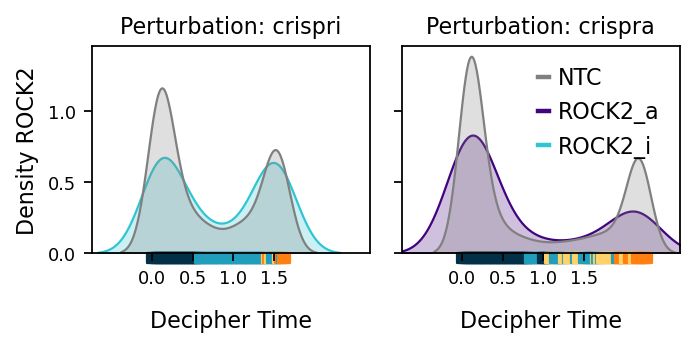

2025-12-08 00:21:52,354 | INFO : maxp pruned
2025-12-08 00:21:52,358 | INFO : cmap pruned
2025-12-08 00:21:52,358 | INFO : kern dropped
2025-12-08 00:21:52,358 | INFO : post pruned
2025-12-08 00:21:52,359 | INFO : FFTM dropped
2025-12-08 00:21:52,360 | INFO : GPOS pruned
2025-12-08 00:21:52,361 | INFO : GSUB pruned
2025-12-08 00:21:52,364 | INFO : glyf pruned
2025-12-08 00:21:52,365 | INFO : Added gid0 to subset
2025-12-08 00:21:52,365 | INFO : Added first four glyphs to subset
2025-12-08 00:21:52,365 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2025-12-08 00:21:52,365 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'R', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:52,366 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 46, 49, 51, 53, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:52,382 | INFO : GSUB subsetted
2025-12-08 00:21:52,382 | INFO : name subsetting not needed
2025-12-08 00:21:52,383 | INFO : glyf subsetted
2025-12-08 00:21:52,383 | INFO : head pruned
2025-12-08 00:21:52,384 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:52,384 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:52,384 | INFO : glyf pruned
2025-12-08 00:21:52,384 | INFO : GDEF pruned
2025-12-08 00:21:52,384 | INFO : GPOS pruned
2025-12-08 00:21:52,384 | INFO : GSUB pruned
2025-12-08 00:21:52,386 | INFO : name pruned


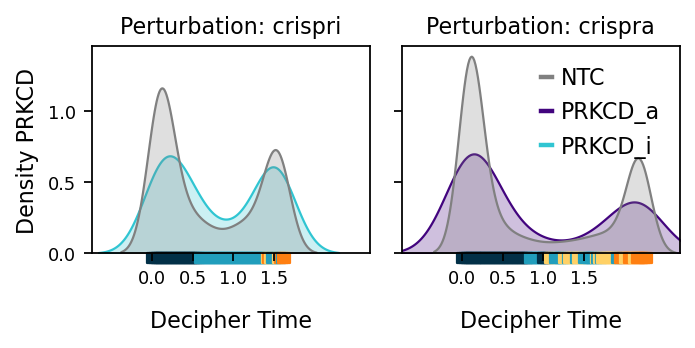

2025-12-08 00:21:52,684 | INFO : maxp pruned
2025-12-08 00:21:52,688 | INFO : cmap pruned
2025-12-08 00:21:52,689 | INFO : kern dropped
2025-12-08 00:21:52,689 | INFO : post pruned
2025-12-08 00:21:52,689 | INFO : FFTM dropped
2025-12-08 00:21:52,690 | INFO : GPOS pruned
2025-12-08 00:21:52,691 | INFO : GSUB pruned
2025-12-08 00:21:52,693 | INFO : glyf pruned
2025-12-08 00:21:52,694 | INFO : Added gid0 to subset
2025-12-08 00:21:52,694 | INFO : Added first four glyphs to subset
2025-12-08 00:21:52,694 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2025-12-08 00:21:52,694 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'I', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:52,695 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 44, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:52,710 | INFO : GSUB subsetted
2025-12-08 00:21:52,711 | INFO : name subsetting not needed
2025-12-08 00:21:52,711 | INFO : glyf subsetted
2025-12-08 00:21:52,712 | INFO : head pruned
2025-12-08 00:21:52,712 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:52,712 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:52,712 | INFO : glyf pruned
2025-12-08 00:21:52,712 | INFO : GDEF pruned
2025-12-08 00:21:52,712 | INFO : GPOS pruned
2025-12-08 00:21:52,713 | INFO : GSUB pruned
2025-12-08 00:21:52,714 | INFO : name pruned


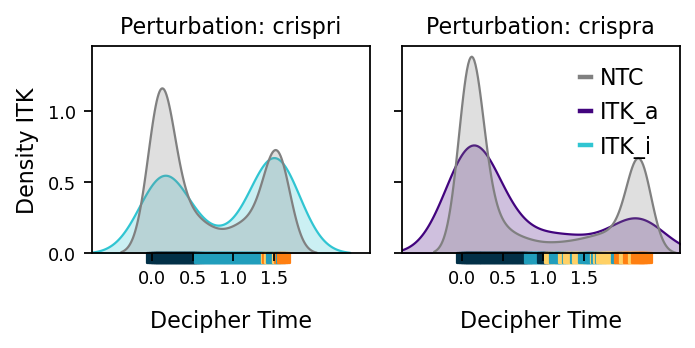

2025-12-08 00:21:53,006 | INFO : maxp pruned
2025-12-08 00:21:53,010 | INFO : cmap pruned
2025-12-08 00:21:53,010 | INFO : kern dropped
2025-12-08 00:21:53,011 | INFO : post pruned
2025-12-08 00:21:53,011 | INFO : FFTM dropped
2025-12-08 00:21:53,011 | INFO : GPOS pruned
2025-12-08 00:21:53,014 | INFO : GSUB pruned
2025-12-08 00:21:53,016 | INFO : glyf pruned
2025-12-08 00:21:53,017 | INFO : Added gid0 to subset
2025-12-08 00:21:53,017 | INFO : Added first four glyphs to subset
2025-12-08 00:21:53,017 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:53,017 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'M', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:53,018 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 46, 48, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 8

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


2025-12-08 00:21:53,033 | INFO : glyf subsetted
2025-12-08 00:21:53,033 | INFO : head pruned
2025-12-08 00:21:53,034 | INFO : OS/2 Unicode ranges pruned: [0]
2025-12-08 00:21:53,034 | INFO : OS/2 CodePage ranges pruned: [0]
2025-12-08 00:21:53,034 | INFO : glyf pruned
2025-12-08 00:21:53,034 | INFO : GDEF pruned
2025-12-08 00:21:53,034 | INFO : GPOS pruned
2025-12-08 00:21:53,034 | INFO : GSUB pruned
2025-12-08 00:21:53,036 | INFO : name pruned


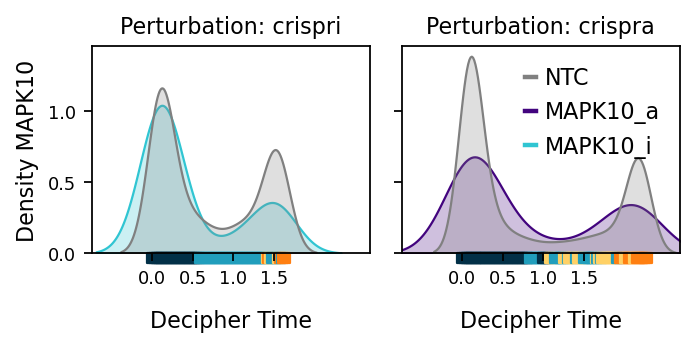

2025-12-08 00:21:53,287 | INFO : maxp pruned
2025-12-08 00:21:53,291 | INFO : cmap pruned
2025-12-08 00:21:53,292 | INFO : kern dropped
2025-12-08 00:21:53,292 | INFO : post pruned
2025-12-08 00:21:53,292 | INFO : FFTM dropped
2025-12-08 00:21:53,293 | INFO : GPOS pruned
2025-12-08 00:21:53,294 | INFO : GSUB pruned
2025-12-08 00:21:53,297 | INFO : glyf pruned
2025-12-08 00:21:53,297 | INFO : Added gid0 to subset
2025-12-08 00:21:53,298 | INFO : Added first four glyphs to subset
2025-12-08 00:21:53,298 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2025-12-08 00:21:53,298 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'L', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:53,299 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 38, 39, 46, 47, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


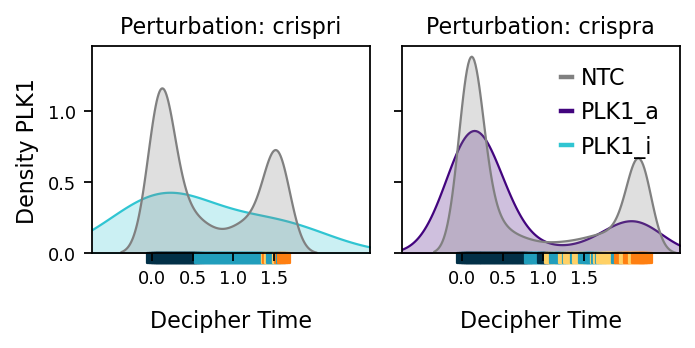

2025-12-08 00:21:53,577 | INFO : maxp pruned
2025-12-08 00:21:53,581 | INFO : cmap pruned
2025-12-08 00:21:53,581 | INFO : kern dropped
2025-12-08 00:21:53,581 | INFO : post pruned
2025-12-08 00:21:53,582 | INFO : FFTM dropped
2025-12-08 00:21:53,582 | INFO : GPOS pruned
2025-12-08 00:21:53,584 | INFO : GSUB pruned
2025-12-08 00:21:53,587 | INFO : glyf pruned
2025-12-08 00:21:53,587 | INFO : Added gid0 to subset
2025-12-08 00:21:53,587 | INFO : Added first four glyphs to subset
2025-12-08 00:21:53,587 | INFO : Closing glyph list over 'GSUB': 33 glyphs before
2025-12-08 00:21:53,587 | INFO : Glyph names: ['.notdef', '.null', 'C', 'D', 'K', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'four', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:53,588 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 23, 24, 29, 38, 39, 46, 49, 51, 54, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


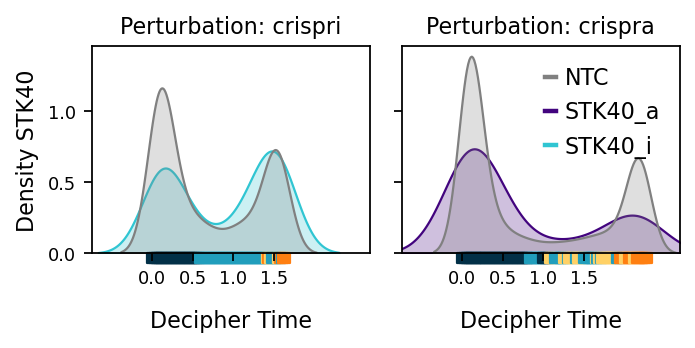

2025-12-08 00:21:53,862 | INFO : maxp pruned
2025-12-08 00:21:53,866 | INFO : cmap pruned
2025-12-08 00:21:53,866 | INFO : kern dropped
2025-12-08 00:21:53,867 | INFO : post pruned
2025-12-08 00:21:53,867 | INFO : FFTM dropped
2025-12-08 00:21:53,867 | INFO : GPOS pruned
2025-12-08 00:21:53,869 | INFO : GSUB pruned
2025-12-08 00:21:53,872 | INFO : glyf pruned
2025-12-08 00:21:53,872 | INFO : Added gid0 to subset
2025-12-08 00:21:53,873 | INFO : Added first four glyphs to subset
2025-12-08 00:21:53,873 | INFO : Closing glyph list over 'GSUB': 32 glyphs before
2025-12-08 00:21:53,873 | INFO : Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'K', 'N', 'P', 'T', 'a', 'b', 'c', 'colon', 'e', 'five', 'h', 'i', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'space', 't', 'u', 'underscore', 'y', 'zero']
2025-12-08 00:21:53,873 | INFO : Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 24, 29, 36, 38, 39, 46, 49, 51, 55, 66, 68, 69, 70, 72, 75, 76, 80, 81, 82, 83, 85, 86, 87, 88, 92]
20

Added crispri_class to axes[0] for crispri
Added crispra_class to axes[1] for crispra


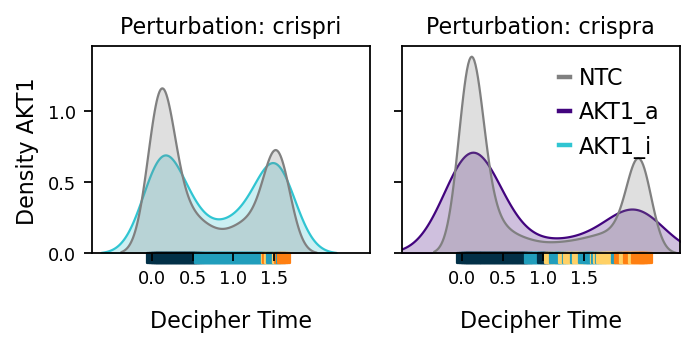

In [60]:
for guide in combined_genes_list:
    # Filter for NTC and current guide
    data_filtered = data[data['gene_id'].isin(['NTC', guide])]
    
    # Get unique perturbations
    perturbations = data_filtered['perturbation'].unique()
    
    # Define consistent color palette: NTC is always gray, guide gets a specific color
    # Only include colors for the genes that are actually in the filtered data
    guide_colors_i = ['gray', crispr_colors['crispri']] # NTC will be first, guide will be second
    guide_colors_a = ['gray', crispr_colors['crispra']]
    # Create a figure with two subplots side by side
    fig, axes = plt.subplots(1, len(perturbations), figsize=(4.5, 2.25), sharey=True)
    
    # Handle case where there's only one perturbation (axes won't be a list)
    if len(perturbations) == 1:
        axes = [axes]
    
    axes[0].set_ylabel(f'Density {guide}', fontsize=10)
    
    # Loop through perturbations and create a subplot for each
    for a, pert in enumerate(perturbations):
        
        # Filter data for this perturbation
        pert_data = data_filtered[data_filtered['perturbation'] == pert]
        
        if pert == 'crispri':
        # Plot on the corresponding axis with custom colors
            sns.kdeplot(
                data=pert_data,
                x="decipher_time",
                hue='gene_id',
                fill=True,
                common_norm=False,
                legend=False,  # We'll add custom legend later
                palette=guide_colors_i,
                hue_order=['NTC', guide],  # Ensure consistent order
                ax=axes[a]
            )
        elif pert == 'crispra':
            sns.kdeplot(
                data=pert_data,
                x="decipher_time",
                hue='gene_id',
                fill=True,
                common_norm=False,
                legend=False,  # We'll add custom legend later
                palette=guide_colors_a,
                hue_order=['NTC', guide],  # Ensure consistent order
                ax=axes[a]
            )
        axes[a].set_title(f'Perturbation: {pert}')
        axes[a].set_xlim(-0.75, np.max(adata_concat.obs['decipher_time'])+0.5)
        axes[a].set_xticks([0, 0.5, 1, 1.5])
        axes[a].set_xlabel('Decipher Time', fontsize=10)
        
        # Add cell type bands based on perturbation type
        if pert == 'crispri':
            add_cell_type_band(adata_concat, 'crispri_class', "treatment", axes[a], color_palette, offset=1)
            print(f"Added crispri_class to axes[{a}] for {pert}")
        elif pert == 'crispra':
            add_cell_type_band(adata_concat, 'crispra_class', "treatment", axes[a], color_palette, offset=1)
            print(f"Added crispra_class to axes[{a}] for {pert}")
    
    # Add legend to the last subplot
    
    legend_elements = [
        plt.Line2D([0], [0], color='gray', lw=2, label='NTC'),
        plt.Line2D([0], [0], color=crispr_colors['crispra'], lw=2, label=f'{guide}_a'),
        plt.Line2D([0], [0], color=crispr_colors['crispri'], lw=2, label=f'{guide}_i')
        
    ]
    axes[-1].legend(handles=legend_elements, loc='upper right', frameon = False, fontsize=10)
    
    # Adjust layout
    plt.tight_layout()
    
    # Save figures
    plt.savefig(f'{figures_dir}/traj_displot_crispriasplit_{guide}.png', dpi=300)
    plt.savefig(f'{figures_dir}/traj_displot_crispriasplit_{guide}.pdf', dpi=300)
    plt.savefig(f'{figures_dir}/traj_displot_crispriasplit_{guide}.svg', dpi=300)
    
    # Show plot
    plt.show()